Luca Dal Zotto
1236343

#NEURAL NETWORKS AND DEEP LEARNING
> M.Sc. ICT FOR LIFE AND HEALTH
> 
> Department of Information Engineering

> M.Sc. COMPUTER ENGINEERING
>
> Department of Information Engineering

> M.Sc. AUTOMATION ENGINEERING
>
> Department of Information Engineering
 
> M.Sc. PHYSICS OF DATA
>
> Department of Physics and Astronomy
 
> M.Sc. COGNITIVE NEUROSCIENCE AND CLINICAL NEUROPSYCHOLOGY
>
> Department of General Psychology

---
A.A. 2020/21 (6 CFU) - Dr. Alberto Testolin, Dr. Matteo Gadaleta
---


# Homework 2 - Unsupervised Deep Learning

## General overview
In this homework you will learn how to implement and test neural network models for solving unsupervised problems. For simplicity and to allow continuity with the kind of data you have seen before, the homework will be based on images of handwritten digits (MNIST). However, you can optionally explore different image collections (e.g., [Caltech](http://www.vision.caltech.edu/Image_Datasets/Caltech101/) or [Cifar](https://www.cs.toronto.edu/~kriz/cifar.html)) or other datasets based on your interests. The basic tasks for the homework will require to test and analyze the convolutional autoencoder implemented during the Lab practice. If you prefer, you can opt for a fully-connected autoencoder, which should achieve similar performance considering the relatively small size of the MNIST images. As for the previous homework, you should explore the use of advanced optimizers and regularization methods. Learning hyperparameters should be tuned using appropriate search procedures, and final accuracy should be evaluated using a cross-validation setup. More advanced tasks will require the exploration of denoising and variational architectures.



## Technical notes
The homework should be implemented in Python using the PyTorch framework. The student can explore additional libraries and tools to implement the models; however, please make sure you understand the code you are writing because during the exam you might receive specific questions related to your implementation. The entire source code required to run the homework must be uploaded as a compressed archive in a Moodle section dedicated to the homework. If your code will be entirely included in a single Python notebook, just upload the notebook file.




## Final report
Along with the source code, you must separately upload a PDF file containing a brief report of your homework. The report should include a brief Introduction on which you explain the homework goals and the main implementation strategies you choose, a brief Method section where you describe your model architectures and hyperparameters, and a Result section where you present the simulation results. Total length must not exceed 6 pages, though you can include additional tables and figures in a final Appendix (optional).




## Grade
The maximum grade for this homework will be **8 points**. Points will be assigned based on the correct implementation of the following items:
*	1 pt: implement and test (convolutional) autoencoder, reporting the trend of reconstruction loss and some examples of image reconstruction
*	1 pt: explore advanced optimizers and regularization methods 
*	1 pt: optimize hyperparameters using grid/random search and cross-validation
*	1 pt: implement and test denoising (convolutional) autoencoder
*	1 pt: fine-tune the (convolutional) autoencoder using a supervised classification task (you can compare classification accuracy and learning speed with results achieved in homework 1)
*	1 pt: explore the latent space structure (e.g., PCA, t-SNE) and generate new samples from latent codes
*	2 pt: implement variational (convolutional) autoencoder or GAN




## Deadline
The complete homework (source code + report) must be submitted through Moodle at least 10 days before the chosen exam date.

# Imports

In [ ]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd # this module is useful to work with tabular data
import random # this module will be used to select random samples from a collection
import os # this module will be used just to create directories in the local filesystem
import tqdm.notebook as tq # this module is useful to plot progress bars
import itertools
import time
import copy
import plotly.express as px 
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import metrics, manifold # we will use the metrics and manifold learning modules from scikit-learn

import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torch import nn

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


# Dataset

In [ ]:
### Download the data and create dataset
data_dir = 'dataset'
# With these commands the train and test datasets, respectively, are downloaded 
# automatically and stored in the local "data_dir" directory.
train_dataset_original = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw


Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw


Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw


Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning:

The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)



Let's plot some random samples from the dataset. The first element of the sample is the actual image, while the second is the corresponding label.

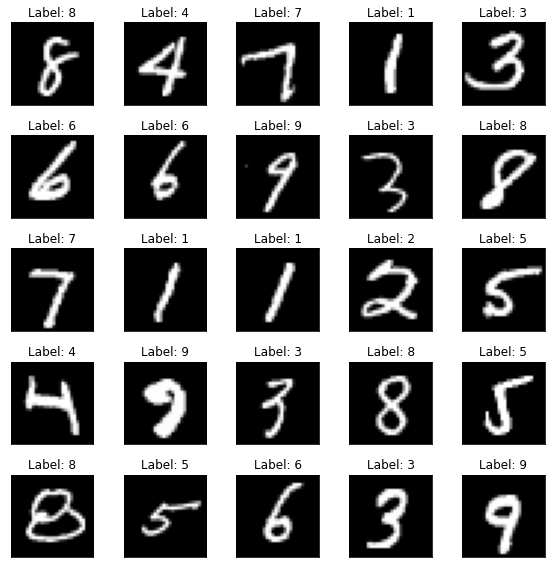

In [ ]:
### Plot some sample
fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset_original)
    ax.imshow(np.array(img), cmap='gist_gray')
    ax.set_title('Label: %d' % label)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [ ]:
# In this case the train_transform and test_transform are the same, but we keep them separate for potential future updates
train_transform = transforms.Compose([transforms.ToTensor(),])
test_transform = transforms.Compose([transforms.ToTensor(),])

Since we already defined our datasets, this is an alternative (and recommended) way to add (or modify) a dataset transformation without reinitializing the dataset (very useful when the dataset initialization is slow):

In [ ]:
# Set the train transform
train_dataset_original.transform = train_transform
# Set the test transform
test_dataset.transform = test_transform

Split the training set into a train and validation set

In [ ]:
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset_original, 
                                        [50000, 10000], generator=torch.Generator().manual_seed(1))

The dataloader allows to easily create batch of data, in this case we set a batch size of 250, and we also enable data shuffling for the training dataset.

In [ ]:
### Define train (train + validation) dataloader
train_dataloader_original = DataLoader(train_dataset_original, batch_size=250, shuffle=True)
### Define train dataloader
train_dataloader = DataLoader(train_dataset, batch_size=250, shuffle=True)
### Define validation dataloader
val_dataloader = DataLoader(val_dataset, batch_size=250, shuffle=True)
### Define test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=250, shuffle=False)


batch_data, batch_labels = next(iter(train_dataloader))
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(val_dataloader))
print(f"VALIDATION BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

TRAIN BATCH SHAPE
	 Data: torch.Size([250, 1, 28, 28])
	 Labels: torch.Size([250])
VALIDATION BATCH SHAPE
	 Data: torch.Size([250, 1, 28, 28])
	 Labels: torch.Size([250])
TEST BATCH SHAPE
	 Data: torch.Size([250, 1, 28, 28])
	 Labels: torch.Size([250])


# Autoencoder

## Architecture definition

In [ ]:
class Encoder(nn.Module):
    
    # def __init__(self, encoded_space_dim):
    def __init__(self, encoded_space_dim, conv_layers=3, fc_layers=2, Nconv1=8, Nconv2=16, Nconv3=32, Nconv4=64, kernel1=3, kernel2=3, 
              stride1=2, stride2=2, Nh1=64, Nh2=64, activation=nn.ReLU(), reg=False, loss=False):        

        super().__init__()
        
        ## Convolutional section
        cnn_layers = [# First convolutional layer
                      nn.Conv2d(1, Nconv1, kernel_size=kernel1, stride=stride1, padding=1),
                      activation,
                      # Second convolutional layer
                      nn.Conv2d(Nconv1, Nconv2, kernel_size=kernel2, stride=stride2, padding=1),
                      activation]
        # cnn_layers0 = [# First convolutional layer
        #               nn.Conv2d(1, Nconv1, kernel_size=kernel1, stride=stride1, padding=1),
        #               activation]
        # cnn_layers = [
        #               # Second convolutional layer
        #               nn.Conv2d(Nconv1, Nconv2, kernel_size=kernel2, stride=stride2, padding=1),
        #               activation]

        size = (28 - kernel1 + 2)//stride1 + 1
        size = (size - kernel2 + 2)//stride2 + 1
        depth = Nconv2

        if conv_layers>=3: 
            # Third convolutional layer
            cnn_layers += [nn.Conv2d(Nconv2, Nconv3, kernel_size=3, stride=1, padding=0), activation]
            size = (size - 2); depth = Nconv3
        
        if conv_layers>=4: 
            # Fourth convolutional layer
            cnn_layers += [nn.Conv2d(Nconv3, Nconv4, kernel_size=3, stride=1, padding=0), activation]
            size = (size - 2); depth = Nconv4

        # self.encoder_cnn0 = nn.Sequential(*cnn_layers0)
        self.encoder_cnn = nn.Sequential(*cnn_layers)
                
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        linear_layers = [# First linear layer
                         nn.Linear(depth * size * size, Nh1), activation]
        Nh = Nh1
        
        if fc_layers == 3:
            # Second linear layer
            linear_layers += [nn.Linear(Nh1, Nh2), activation]
            Nh = Nh2

        linear_layers += [# Last linear layer
                          nn.Linear(Nh, encoded_space_dim)]

        self.encoder_lin = nn.Sequential(*linear_layers)
        

    def forward(self, x):
        # Apply convolutions
        # x = self.encoder_cnn0(x)
        # print(x.shape)
        x = self.encoder_cnn(x)
        # print(x.shape)

        # Flatten
        x = self.flatten(x)
        # Apply linear layers
        x = self.encoder_lin(x)
        return x

sample = next(iter(train_dataloader))
sample = sample[0]
print(sample.shape)

encoded_space_dim = 2
enc = Encoder(encoded_space_dim, conv_layers=3, fc_layers=3, Nconv1=8, Nconv2=16, Nconv3=32, Nconv4=64, kernel1=3, kernel2=3, 
              stride1=2, stride2=2, Nh1=64, Nh2=32, activation=nn.ReLU(), reg=False, loss=False)
out = enc(sample)
print(out.shape)

torch.Size([250, 1, 28, 28])
torch.Size([250, 2])


In [ ]:
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim, conv_layers=3, fc_layers=2, Nconv1=8, Nconv2=16, Nconv3=32, Nconv4=64, kernel1=3, kernel2=3, 
              stride1=2, stride2=2, Nh1=64, Nh2=64, activation=nn.ReLU(), reg=False, loss=False):
        super().__init__()

        size = (28 - kernel1 + 2)//stride1 + 1
        size = (size - kernel2 + 2)//stride2 + 1
        depth = Nconv2
        if conv_layers>=3: size = (size - 2); depth = Nconv3
        if conv_layers>=4: size = (size - 2); depth = Nconv4
        
        Nh = Nh2 if fc_layers == 3 else Nh1

        ### Linear section
        linear_layers = [# Last linear layer
                         nn.Linear(encoded_space_dim, Nh), activation]

        if fc_layers == 3:
            # Second linear layer
            linear_layers += [nn.Linear(Nh2, Nh1), activation]

        linear_layers += [# First linear layer
                         nn.Linear(Nh1, depth * size * size), activation]

        self.decoder_lin = nn.Sequential(*linear_layers)

        ### Unflatten
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(depth, size, size))

        ### Convolutional section
        cnn_layers = []
        if conv_layers>=4: 
            # Fourth last transposed convolutional layer
            cnn_layers += [nn.ConvTranspose2d(Nconv4, Nconv3, kernel_size=3, stride=1, padding=0, output_padding=0), activation]

        if conv_layers>=3: 
            # Third last transposed convolutional layer
            cnn_layers += [nn.ConvTranspose2d(Nconv3, Nconv2, kernel_size=3, stride=1, padding=0, output_padding=0), activation]

        cnn_layers += [# Second last transposed convolution
                      nn.ConvTranspose2d(Nconv2, Nconv1, kernel_size=kernel2, stride=stride2, padding=1, output_padding=(5-kernel1)//2),
                      activation,
                      # Last transposed convolution
                      nn.ConvTranspose2d(Nconv1, 1, kernel_size=kernel1, stride=stride1, padding=1, output_padding=1)]
        # cnn_layers += [# Second last transposed convolution
        #               nn.ConvTranspose2d(Nconv2, Nconv1, kernel_size=kernel2, stride=stride2, padding=1, output_padding=(5-kernel1)//2),
        #               activation]
        # cnn_layers2 = [
        #               # Last transposed convolution
        #               nn.ConvTranspose2d(Nconv1, 1, kernel_size=kernel1, stride=stride1, padding=1, output_padding=1)]
        
        self.decoder_conv = nn.Sequential(*cnn_layers)
        # self.decoder_conv2 = nn.Sequential(*cnn_layers2)
        
    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        
        # Unflatten
        x = self.unflatten(x)
        # print(x.shape)

        # Apply transposed convolutions
        x = self.decoder_conv(x)
        # print(x.shape)
        # x = self.decoder_conv2(x)

        # Apply a sigmoid to force the output to be between 0 and 1 (valid pixel values)
        x = torch.sigmoid(x)
        return x

print(out.shape)

encoded_space_dim = 2
dec = Decoder(encoded_space_dim, conv_layers=2, fc_layers=3, Nconv1=8, Nconv2=16, Nconv3=32, Nconv4=64, kernel1=3, kernel2=3, 
              stride1=2, stride2=2, Nh1=64, Nh2=32, activation=nn.ReLU(), reg=False, loss=False)
out_dec = dec(out)
print(out_dec.shape)

torch.Size([250, 2])
torch.Size([250, 1, 28, 28])


## Training

In [ ]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    
    train_loss= []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Save loss
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)
        # Print batch loss
        # print('\t partial train loss (single batch): %f' % (loss.data))
    return np.mean(train_loss)

In [ ]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()    
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [ ]:
def early_stopping(val_loss, best_loss, train_loss, encoder, decoder, no_improve_epoch, patience):
    stop = False
    if val_loss < best_loss:
        best_loss = val_loss # Update the best value so far
        # corresponding_train_loss = train_loss
        # Save network parameters
        torch.save(encoder.state_dict(), 'encoder_params.torch')
        torch.save(decoder.state_dict(), 'decoder_params.torch')
        no_improve_epoch = 0 # Reset number of consecutive epochs without improvement
    else:
        no_improve_epoch += 1
        if no_improve_epoch == patience: 
            stop = True
    return (stop, val_loss, best_loss, train_loss, no_improve_epoch)

In [ ]:
def plot_results(train_loss_log, val_loss_log, encoder, decoder, device):
    fig, ax = plt.subplots(1,3, figsize=(15,3))
    # Plot the learning curves (loss)
    ax[0].plot(train_loss_log, label='Train loss')
    ax[0].plot(val_loss_log, label='Validation loss') # semilogy
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    ax[0].set_title('Learning curves')
    ax[0].grid()
    ax[0].legend()

    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
        # Plot the original image
        ax[1].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax[1].set_title('Original image')
        # Plot the reconstructed image
        ax[2].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax[2].set_title('Reconstructed image')

    plt.show()

## Main

##### First search

CNN 3 conv: 32(5x5)-32(5x5)-64, 3 fc: 1024-128-4, act = LeakyReLU, opt = SGD, lr = 0.001, reg = L2, wd = 1e-06



Best val_loss: 0.16362 - train_loss: 0.16538 - execution_time: 148s


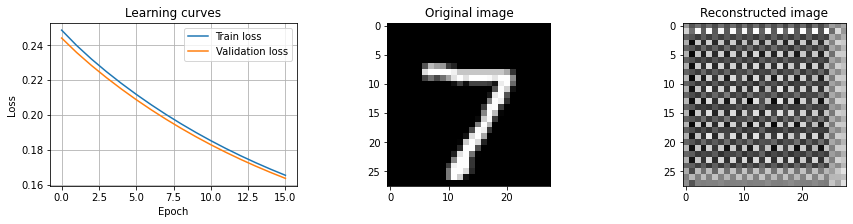

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-64(3x3)-128, 3 fc: 128-128-8, act = ELU, opt = SGD, lr = 0.0001, reg = False, wd = 1e-05



Best val_loss: 0.21625 - train_loss: 0.21692 - execution_time: 183s


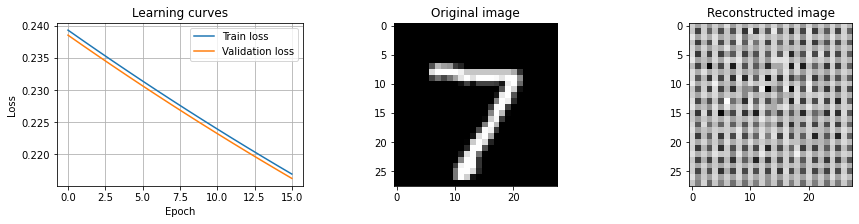

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-32(3x3), 2 fc: 256-2, act = LeakyReLU, opt = RMSprop, lr = 1e-05, reg = False, wd = 1e-06



Best val_loss: 0.06070 - train_loss: 0.06111 - execution_time: 167s


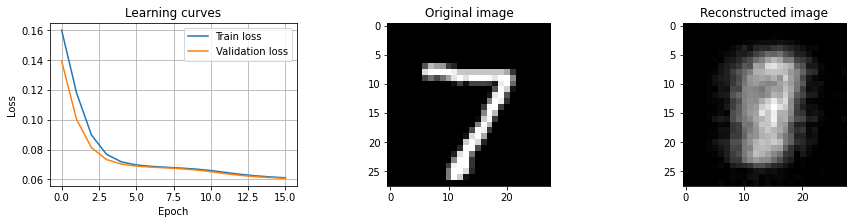

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-64(5x5)-32, 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm, wd = 1e-05



Best val_loss: 0.01779 - train_loss: 0.01741 - execution_time: 129s


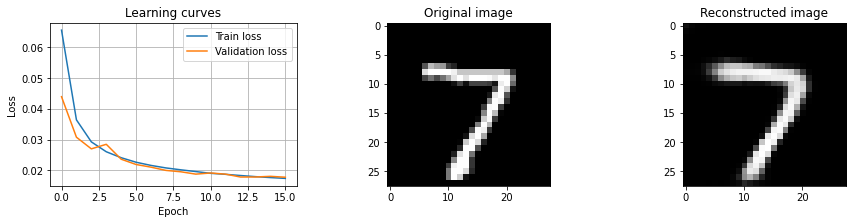

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(3x3)-16(3x3)-64-128, 2 fc: 32-2, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False, wd = 0.001



Best val_loss: 0.04998 - train_loss: 0.05051 - execution_time: 180s


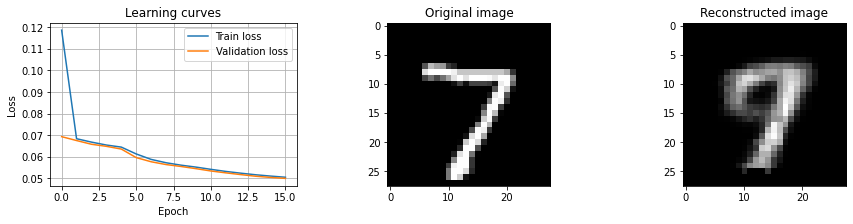

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(3x3)-16(3x3)-128-32, 2 fc: 1024-1, act = LeakyReLU, opt = Adam, lr = 1e-05, reg = Batch norm, wd = 0.0001



Best val_loss: 0.06467 - train_loss: 0.06492 - execution_time: 184s


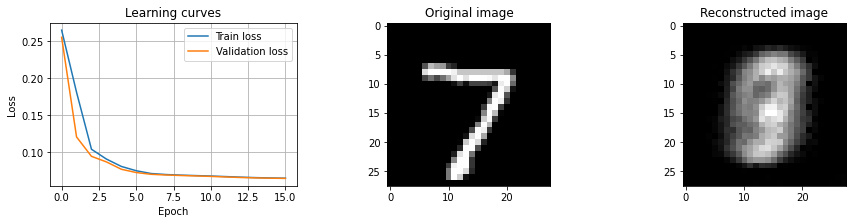

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-16(5x5)-64, 3 fc: 512-128-8, act = LeakyReLU, opt = Adam, lr = 0.01, reg = L2, wd = 1e-05


Best val_loss: 0.06829 - train_loss: 0.11207 - execution_time: 53s


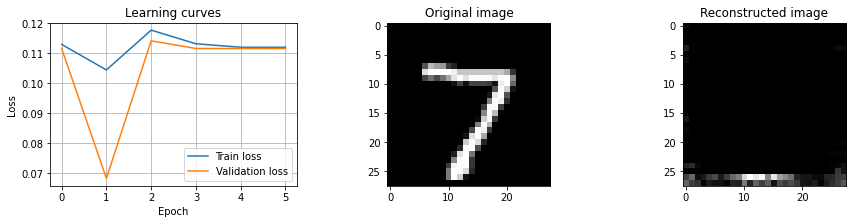

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-32(3x3)-32, 2 fc: 64-32, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False, wd = 0.0001



Best val_loss: 0.02602 - train_loss: 0.02693 - execution_time: 180s


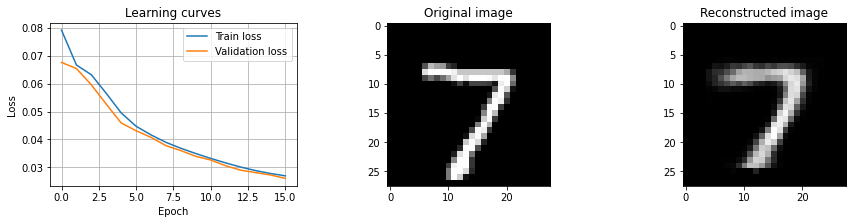

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-8(5x5)-32-128, 2 fc: 128-1, act = Sigmoid, opt = Adam, lr = 0.0001, reg = L2, wd = 0.001



Best val_loss: 0.07565 - train_loss: 0.07611 - execution_time: 141s


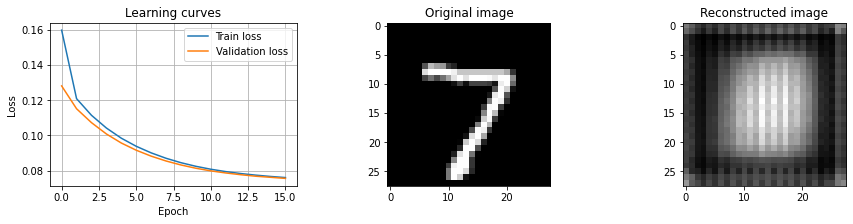

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-32(5x5)-32, 3 fc: 512-128-2, act = LeakyReLU, opt = SGD, lr = 0.01, reg = L2, wd = 1e-05



Best val_loss: 0.09686 - train_loss: 0.09724 - execution_time: 131s


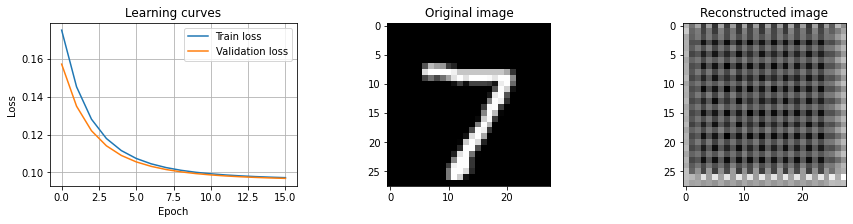

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-8(5x5)-64-64, 3 fc: 32-256-16, act = Sigmoid, opt = RMSprop, lr = 0.01, reg = Batch norm, wd = 1e-05


Best val_loss: 0.06717 - train_loss: 0.06735 - execution_time: 94s


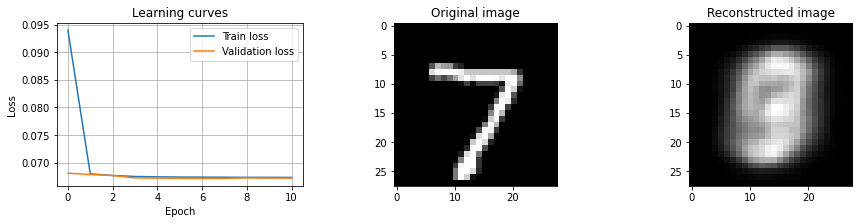

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 8(3x3)-16(3x3)-32, 2 fc: 128-4, act = Sigmoid, opt = SGD, lr = 0.0001, reg = False, wd = 1e-05



Best val_loss: 0.25374 - train_loss: 0.25442 - execution_time: 166s


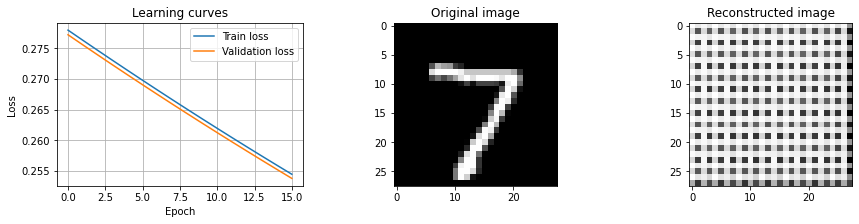

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(3x3)-8(3x3)-64-128, 2 fc: 32-2, act = Sigmoid, opt = RMSprop, lr = 0.001, reg = False, wd = 0.001



Best val_loss: 0.06714 - train_loss: 0.06737 - execution_time: 176s


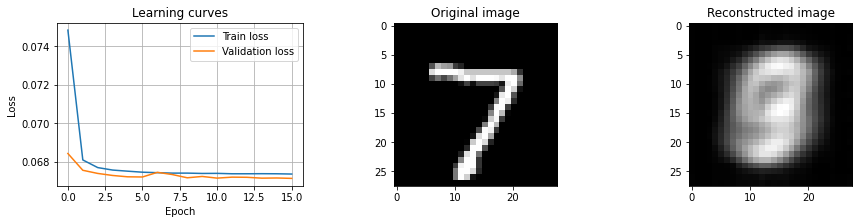

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(3x3), 3 fc: 64-32-32, act = Sigmoid, opt = SGD, lr = 0.0001, reg = False, wd = 0.0001



Best val_loss: 0.17209 - train_loss: 0.17271 - execution_time: 164s


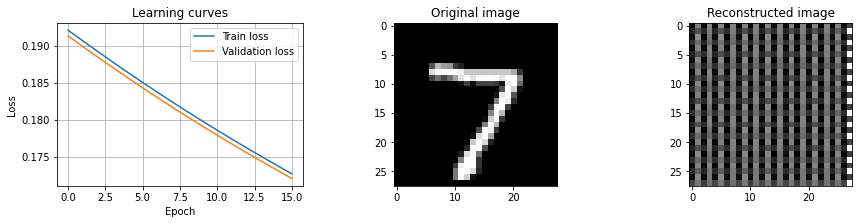

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-32(5x5)-128, 2 fc: 256-16, act = ELU, opt = Adam, lr = 0.01, reg = L2, wd = 0.0001


Best val_loss: 0.11167 - train_loss: 0.11210 - execution_time: 51s


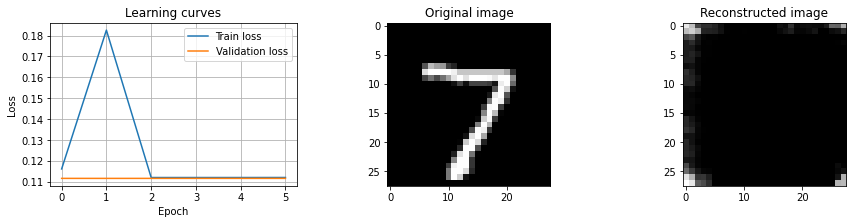

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(5x5), 3 fc: 256-32-32, act = Sigmoid, opt = SGD, lr = 0.0001, reg = L2, wd = 0.0001



Best val_loss: 0.19916 - train_loss: 0.20039 - execution_time: 122s


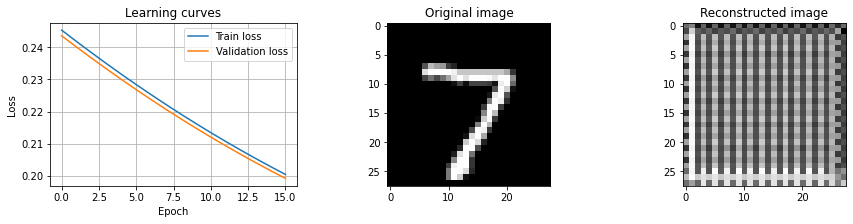

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-32(3x3), 2 fc: 1024-8, act = LeakyReLU, opt = SGD, lr = 0.001, reg = Batch norm, wd = 0.0001



Best val_loss: 0.15547 - train_loss: 0.15758 - execution_time: 171s


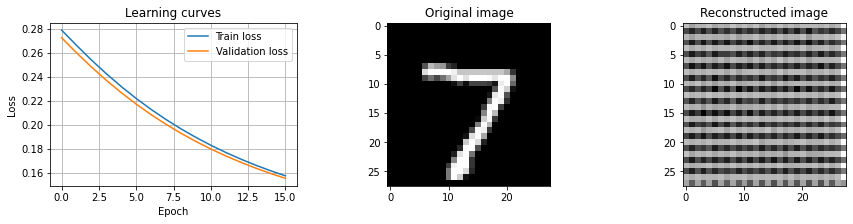

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(3x3)-16(3x3)-128-64, 3 fc: 256-256-32, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = False, wd = 1e-06


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 68s


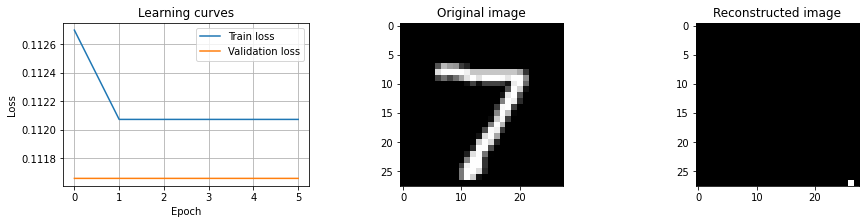

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(3x3)-32, 2 fc: 32-8, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False, wd = 0.001



Best val_loss: 0.03698 - train_loss: 0.03783 - execution_time: 163s


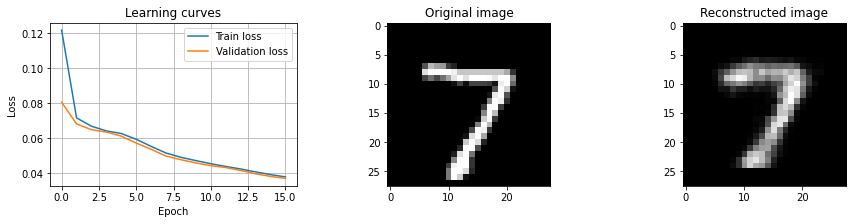

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(3x3)-8(3x3)-128-64, 3 fc: 64-256-4, act = Sigmoid, opt = RMSprop, lr = 1e-05, reg = False, wd = 0.0001



Best val_loss: 0.20170 - train_loss: 0.20317 - execution_time: 168s


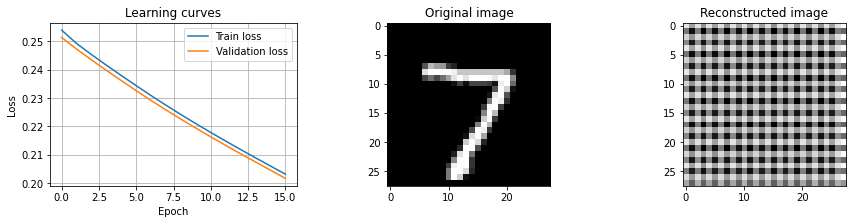

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.01779 -> CNN 3 conv: 16(5x5)-64(5x5)-32, 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm
Val_loss = 0.02602 -> CNN 3 conv: 64(3x3)-32(3x3)-32, 2 fc: 64-32, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False
Val_loss = 0.03698 -> CNN 3 conv: 16(3x3)-32(3x3)-32, 2 fc: 32-8, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False
Val_loss = 0.04998 -> CNN 4 conv: 64(3x3)-16(3x3)-64-128, 2 fc: 32-2, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False
Val_loss = 0.06070 -> CNN 2 conv: 16(3x3)-32(3x3), 2 fc: 256-2, act = LeakyReLU, opt = RMSprop, lr = 1e-05, reg = False
Val_loss = 0.06467 -> CNN 4 conv: 32(3x3)-16(3x3)-128-32, 2 fc: 1024-1, act = LeakyReLU, opt = Adam, lr = 1e-05, reg = Batch norm
Val_loss = 0.06714 -> CNN 4 conv: 64(3x3)-8(3x3)-64-128, 2 fc: 32-2, act = Sigmoid, opt = RMSprop, lr = 0.001, reg = False
Val_loss =

In [ ]:
num_epochs = 16
patience = 4
# Define possible values for each hyper-parameter
conv_layers_v = [2,3,4]
fc_layers_v = [2,3]
Nconv_v = [8,16,32,64]
Nconv_v2 = [32,64,128]
kernel_v = [3,5]
Nh_v = [32, 64, 128, 256, 512, 1024]

encoded_space_dim_v = [1,2,4,8,16,32]
act_v = ['Sigmoid', 'LeakyReLU', 'ELU']
act_dict = {'Sigmoid':nn.Sigmoid(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop', 'SGD']
lr_v = [0.01, 0.001, 0.0001, 0.00001]
reg_v = ['False', 'Batch norm', 'L2']
wd_v = [0.001, 0.0001, 0.00001, 0.000001]
results = []

grid1 = list(itertools.product(conv_layers_v, fc_layers_v, Nconv_v, Nconv_v, Nconv_v2, Nconv_v2, kernel_v, Nh_v))
grid2 = list(itertools.product(Nh_v, encoded_space_dim_v, act_v, opt_v, lr_v, reg_v, wd_v))
grid = [x + y for x, y in zip(grid1, grid2)] 

### Random search
random.seed(0)
pbar = tq.tqdm(total = 20, desc = 'Random search progress')
for (conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, Nh1, 
    Nh2, encoded_space_dim, act, opt, lr, reg, wd) in random.sample(grid, 20):
    kernel2 = kernel1
        
    print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
          f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
          f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, wd = {wd}')
    
    start_time = time.time()

    ### Set the random seed for reproducible results
    torch.manual_seed(0)
    activation = act_dict[act]

    ### Initialize the two networks
    encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
    decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
    # Move both the encoder and the decoder to the selected device
    encoder.to(device)
    decoder.to(device)

    ### Define the loss function
    loss_fn = torch.nn.MSELoss()

    ### Define an optimizer (both for the encoder and the decoder!)
    params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
    if reg == 'L2':
        opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                    'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd),
                    'SGD': torch.optim.SGD(params_to_optimize, lr = lr, weight_decay = wd)}
        optimizer = opt_dict[opt]
    else:
        opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                    'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr),
                    'SGD': torch.optim.SGD(params_to_optimize, lr = lr)}
        optimizer = opt_dict[opt]

    ### Training cycle
    no_improve_epoch = 0
    train_loss_log, val_loss_log = [], []
    best_loss = 1e10

    for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
        ### Training (use the training function)
        train_loss = train_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader, loss_fn=loss_fn, optimizer=optimizer)
        train_loss_log.append(train_loss)
        ### Validation  (use the testing function)
        val_loss = test_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=val_dataloader, loss_fn=loss_fn)
        val_loss_log.append(val_loss)

        ### Early Stopping
        (stop, val_loss, best_loss, corr_train_loss, no_improve_epoch) = early_stopping(val_loss, best_loss, train_loss, 
                                                                                                encoder, decoder, no_improve_epoch, patience)
        if stop: break

    run_time = time.time() - start_time
    print(f'Best val_loss: {best_loss:.5f} - train_loss: {corr_train_loss:.5f} - execution_time: {run_time:.0f}s') 
    
    results.append((np.round(best_loss, 5), 
          f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
          f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
          f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}'))
    
    ### Plot learning curves and a reconstruction sample
    plot_results(train_loss_log, val_loss_log, encoder, decoder, device)


    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)


print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = False):
    print(f'Val_loss = {r[0]:.5f} -> {r[1]}')


##### Second search

CNN 4 conv: 8(3x3)-8(3x3)-32-32, 2 fc: 1024-4, act = Sigmoid, opt = Adam, lr = 0.003, reg = Batch norm



Best val_loss: 0.06727 - train_loss: 0.06746 - execution_time: 344s


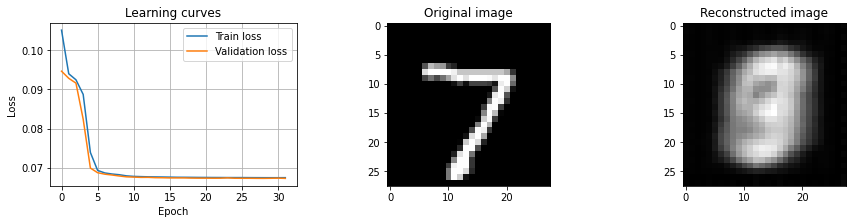

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-16(5x5), 3 fc: 1024-128-4, act = LeakyReLU, opt = RMSprop, lr = 0.0003, reg = Batch norm



Best val_loss: 0.02434 - train_loss: 0.02359 - execution_time: 271s


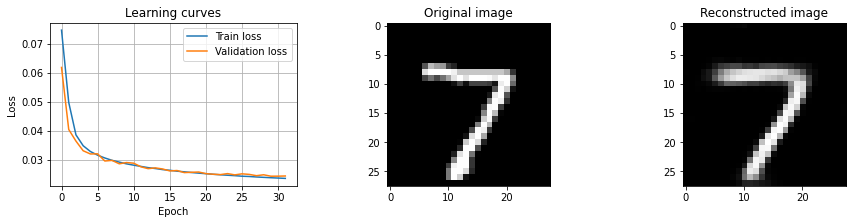

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(3x3)-16(3x3)-64, 3 fc: 1024-512-16, act = ELU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)



Best val_loss: 0.00610 - train_loss: 0.00526 - execution_time: 368s


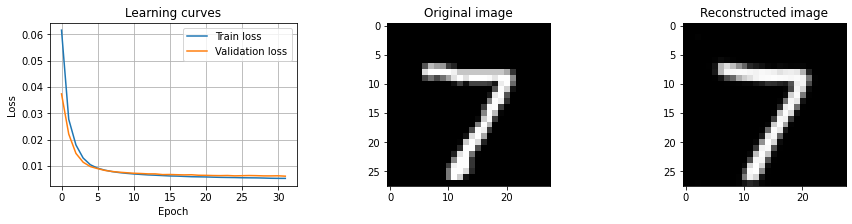

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(5x5)-64(5x5)-64-64, 2 fc: 128-8, act = ELU, opt = Adam, lr = 0.0003, reg = False



Best val_loss: 0.01732 - train_loss: 0.01717 - execution_time: 266s


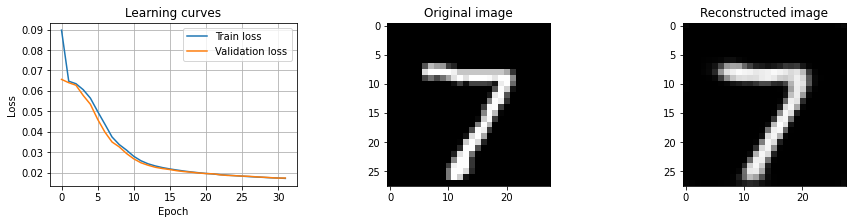

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-64(3x3), 3 fc: 64-128-8, act = ELU, opt = RMSprop, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.01682 - train_loss: 0.01685 - execution_time: 352s


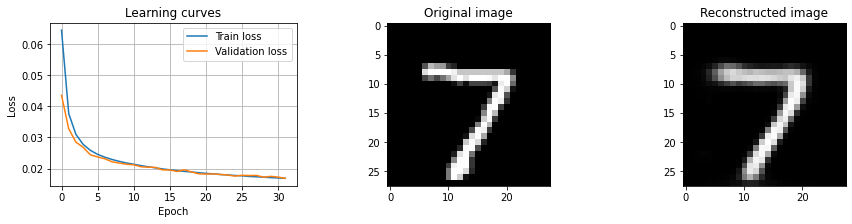

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 8(5x5)-64(5x5), 2 fc: 64-2, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = L2 (wd=1e-05)


Best val_loss: 0.03945 - train_loss: 0.03954 - execution_time: 174s


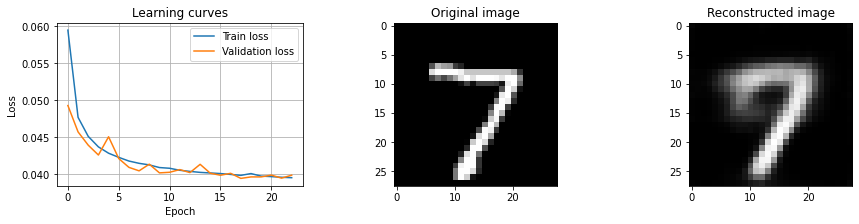

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 8(5x5)-64(5x5), 3 fc: 256-64-8, act = ELU, opt = Adam, lr = 0.0001, reg = L2 (wd=0.0001)



Best val_loss: 0.02443 - train_loss: 0.02460 - execution_time: 259s


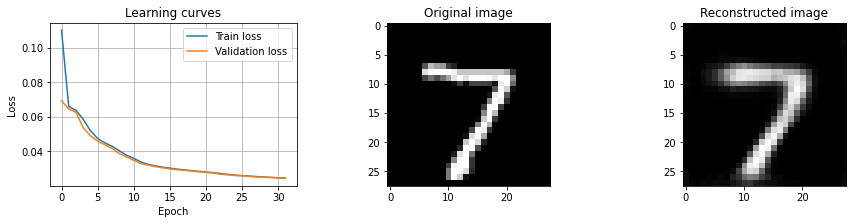

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(3x3)-128, 2 fc: 32-2, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 65s


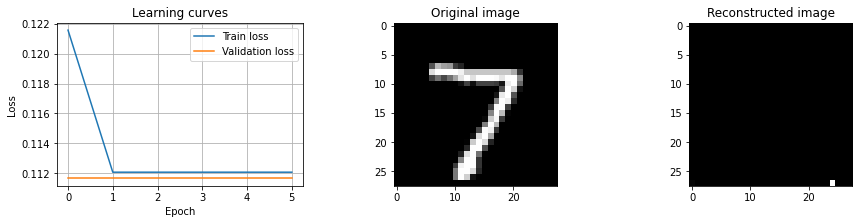

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-8(5x5)-128, 2 fc: 128-1, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = False


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 154s


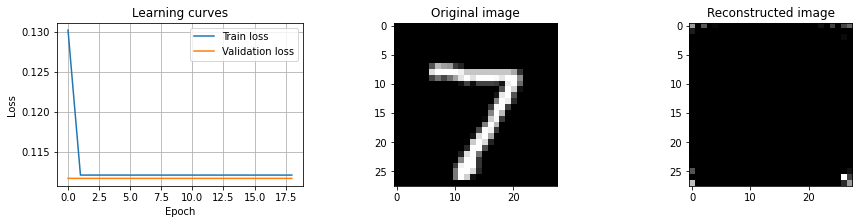

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-32(3x3), 3 fc: 1024-128-8, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm


Best val_loss: 0.01265 - train_loss: 0.01034 - execution_time: 303s


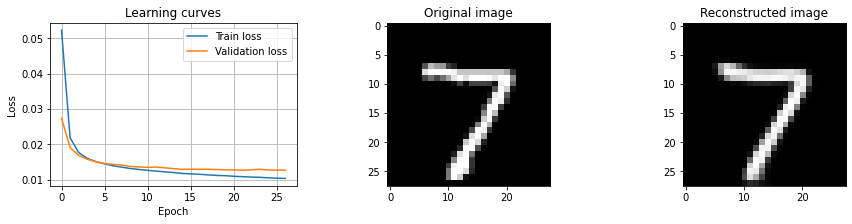

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-64-128, 2 fc: 512-16, act = ELU, opt = Adam, lr = 0.0001, reg = L2 (wd=1e-05)



Best val_loss: 0.01767 - train_loss: 0.01797 - execution_time: 265s


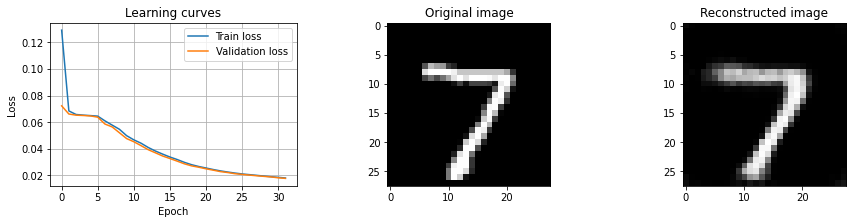

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(3x3)-64(3x3)-64, 3 fc: 32-512-32, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm



Best val_loss: 0.00814 - train_loss: 0.00787 - execution_time: 361s


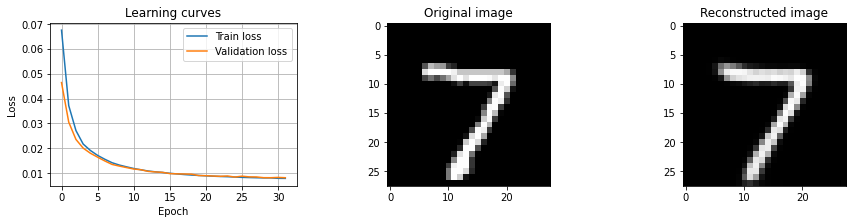

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-32(5x5)-128, 3 fc: 32-1024-2, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 171s


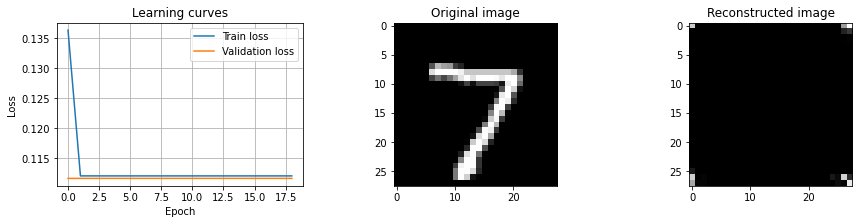

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-64(3x3), 3 fc: 32-64-32, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = False


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 63s


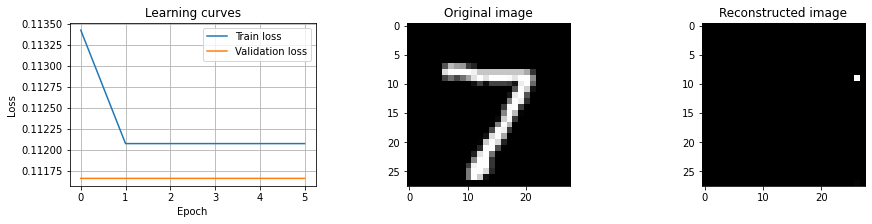

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-8(3x3)-32, 2 fc: 512-1, act = Sigmoid, opt = Adam, lr = 0.001, reg = L2 (wd=1e-05)



Best val_loss: 0.06721 - train_loss: 0.06740 - execution_time: 343s


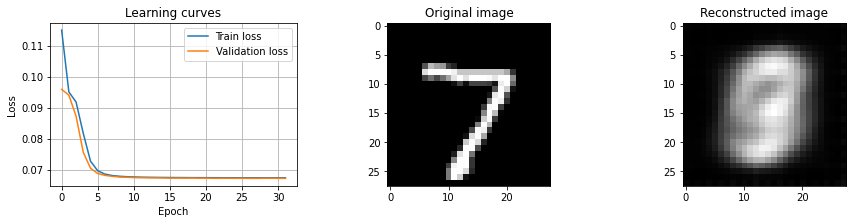

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(3x3)-64(3x3), 3 fc: 1024-128-2, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-06)


Best val_loss: 0.03514 - train_loss: 0.03471 - execution_time: 320s


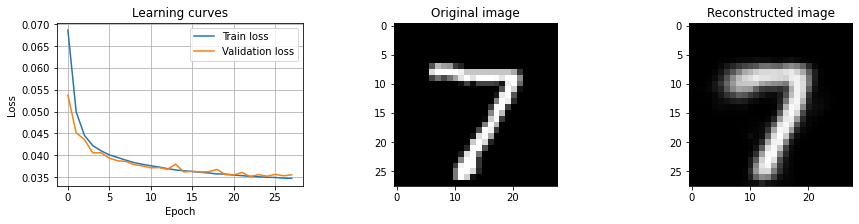

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-8(3x3)-32, 2 fc: 256-16, act = Sigmoid, opt = Adam, lr = 0.0001, reg = False



Best val_loss: 0.06751 - train_loss: 0.06770 - execution_time: 346s


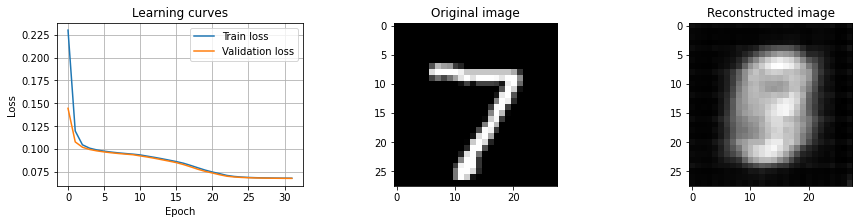

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(5x5)-64(5x5)-64-128, 2 fc: 128-8, act = ELU, opt = Adam, lr = 0.0001, reg = Batch norm



Best val_loss: 0.02309 - train_loss: 0.02329 - execution_time: 260s


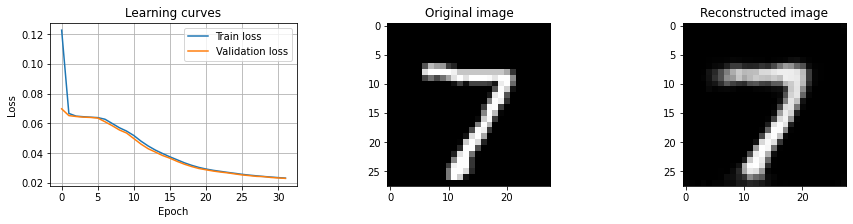

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-8(5x5)-128-64, 2 fc: 1024-16, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Batch norm



Best val_loss: 0.00889 - train_loss: 0.00863 - execution_time: 261s


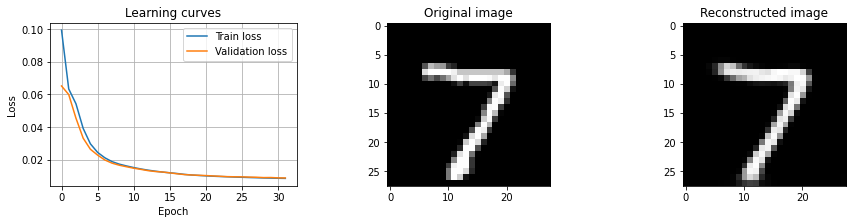

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 8(3x3)-8(3x3), 3 fc: 64-64-4, act = Sigmoid, opt = RMSprop, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.06726 - train_loss: 0.06744 - execution_time: 338s


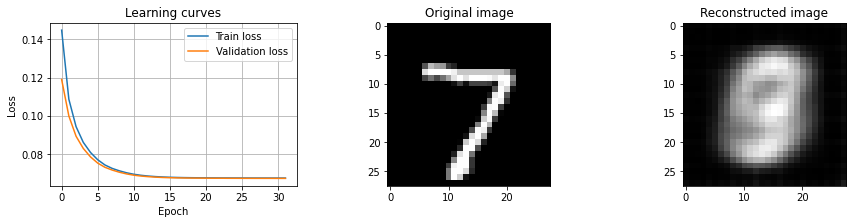

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-32(5x5)-32, 2 fc: 32-2, act = Sigmoid, opt = Adam, lr = 0.0001, reg = Batch norm



Best val_loss: 0.06741 - train_loss: 0.06759 - execution_time: 261s


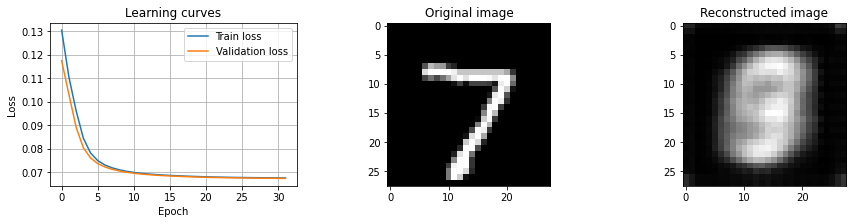

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(3x3)-32(3x3), 2 fc: 32-32, act = Sigmoid, opt = RMSprop, lr = 0.0003, reg = L2 (wd=0.0001)


Best val_loss: 0.06753 - train_loss: 0.06774 - execution_time: 323s


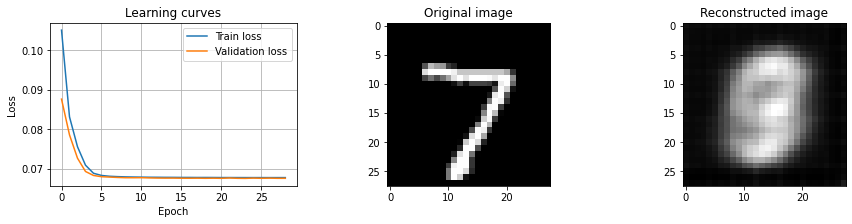

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(3x3), 3 fc: 512-64-16, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm



Best val_loss: 0.00678 - train_loss: 0.00605 - execution_time: 336s


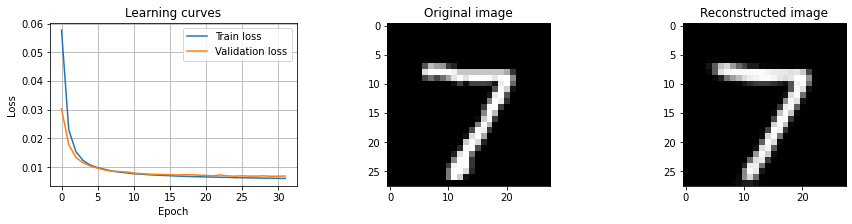

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(3x3)-32(3x3), 2 fc: 512-32, act = Sigmoid, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.06717 - train_loss: 0.06733 - execution_time: 350s


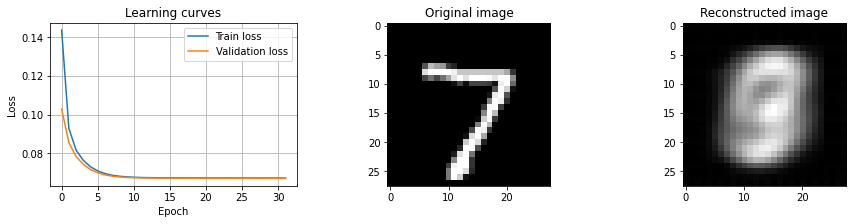

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-16(5x5)-32, 3 fc: 1024-512-16, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-06)



Best val_loss: 0.02772 - train_loss: 0.02857 - execution_time: 268s


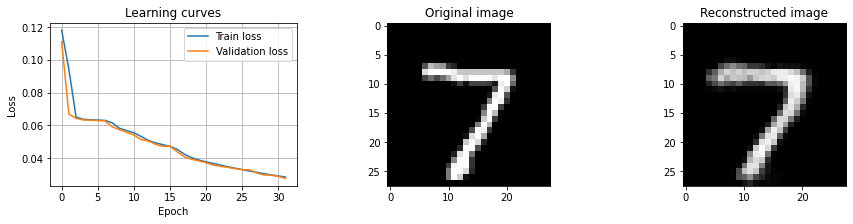

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-64(5x5), 2 fc: 128-8, act = LeakyReLU, opt = RMSprop, lr = 0.0003, reg = False



Best val_loss: 0.01582 - train_loss: 0.01538 - execution_time: 244s


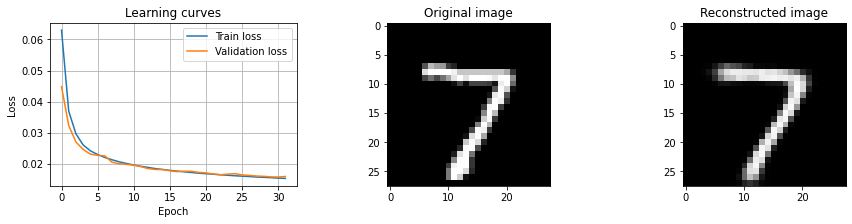

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-32(3x3)-128, 2 fc: 64-32, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.00690 - train_loss: 0.00682 - execution_time: 359s


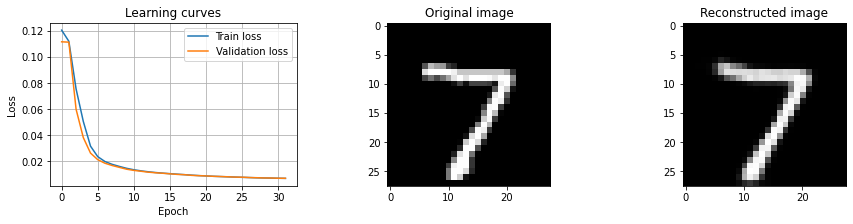

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-8(5x5)-64, 3 fc: 128-1024-1, act = Sigmoid, opt = RMSprop, lr = 0.0001, reg = Batch norm



Best val_loss: 0.06720 - train_loss: 0.06737 - execution_time: 272s


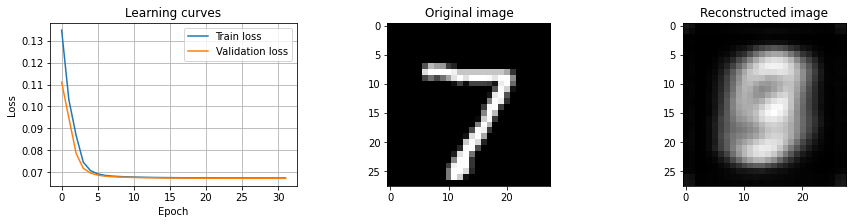

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 8(3x3)-64(3x3), 3 fc: 32-64-8, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = False



Best val_loss: 0.01738 - train_loss: 0.01735 - execution_time: 327s


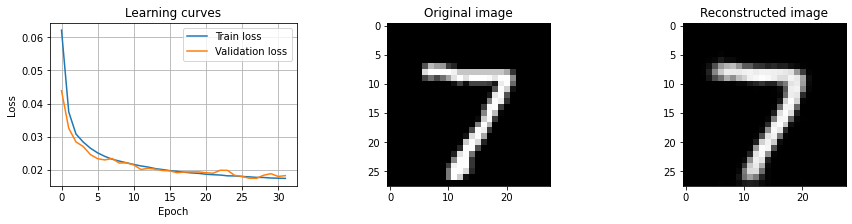

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-16(3x3)-32-32, 2 fc: 32-16, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = False


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 64s


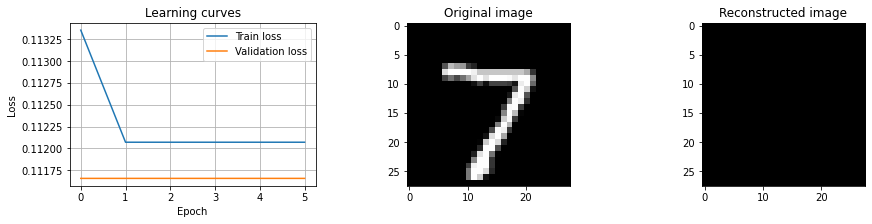

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.00610 -> CNN 3 conv: 32(3x3)-16(3x3)-64, 3 fc: 1024-512-16, act = ELU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)
Val_loss = 0.00678 -> CNN 2 conv: 16(3x3)-16(3x3), 3 fc: 512-64-16, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.00690 -> CNN 3 conv: 64(3x3)-32(3x3)-128, 2 fc: 64-32, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.00814 -> CNN 3 conv: 32(3x3)-64(3x3)-64, 3 fc: 32-512-32, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm
Val_loss = 0.00889 -> CNN 4 conv: 16(5x5)-8(5x5)-128-64, 2 fc: 1024-16, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Batch norm
Val_loss = 0.01265 -> CNN 2 conv: 64(3x3)-32(3x3), 3 fc: 1024-128-8, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.01582 -> CNN 2 conv: 16(5x5)-64(5x5), 2 fc: 128-8, act = LeakyReLU, opt = RMSprop, lr = 0.0003, reg = F

In [ ]:
num_epochs = 32
patience = 5
# Define possible values for each hyper-parameter
conv_layers_v = [2,3,4]
fc_layers_v = [2,3]
Nconv_v = [8,16,32,64]
Nconv_v2 = [32,64,128]
kernel_v = [3,5]
Nh_v = [32, 64, 128, 256, 512, 1024]

encoded_space_dim_v = [1,2,4,8,16,32]
act_v = ['Sigmoid', 'LeakyReLU', 'ELU']
act_dict = {'Sigmoid':nn.Sigmoid(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.003, 0.001, 0.0003, 0.0001]
reg_v = ['False', 'Batch norm', 'L2']
wd_v = [0.0001, 0.00001, 0.000001]
results = []

grid1 = list(itertools.product(conv_layers_v, fc_layers_v, Nconv_v, Nconv_v, Nconv_v2, Nconv_v2, kernel_v, Nh_v))
grid2 = list(itertools.product(Nh_v, encoded_space_dim_v, act_v, opt_v, lr_v, reg_v, wd_v))
grid = [x + y for x, y in zip(grid1, grid2)] 

### Random search
random.seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
for (conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, Nh1, 
    Nh2, encoded_space_dim, act, opt, lr, reg, wd) in random.sample(grid, 30):
    kernel2 = kernel1
        
    print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
          f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
          f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}')
    
    start_time = time.time()
    
    ### Set the random seed for reproducible results
    torch.manual_seed(0)
    activation = act_dict[act]

    ### Initialize the two networks
    encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
    decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
    # Move both the encoder and the decoder to the selected device
    encoder.to(device)
    decoder.to(device)

    ### Define the loss function
    loss_fn = torch.nn.MSELoss()

    ### Define an optimizer (both for the encoder and the decoder!)
    params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
    if reg == 'L2':
        opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                    'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd)}
        optimizer = opt_dict[opt]
    else:
        opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                    'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr)}
        optimizer = opt_dict[opt]

    ### Training cycle
    no_improve_epoch = 0
    train_loss_log, val_loss_log = [], []
    best_loss = 1e10

    for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
        ### Training (use the training function)
        train_loss = train_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader, loss_fn=loss_fn, optimizer=optimizer)
        train_loss_log.append(train_loss)
        ### Validation  (use the testing function)
        val_loss = test_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=val_dataloader, loss_fn=loss_fn)
        val_loss_log.append(val_loss)

        ### Early Stopping
        (stop, val_loss, best_loss, corr_train_loss, no_improve_epoch) = early_stopping(val_loss, best_loss, train_loss, 
                                                                                                encoder, decoder, no_improve_epoch, patience)
        if stop: break

    run_time = time.time() - start_time
    print(f'Best val_loss: {best_loss:.5f} - train_loss: {corr_train_loss:.5f} - execution_time: {run_time:.0f}s') 
    results.append((np.round(best_loss, 5), 
          f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
          f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
          f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}'))
    
    ### Plot learning curves and a reconstruction sample
    plot_results(train_loss_log, val_loss_log, encoder, decoder, device)


    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = False):
    print(f'Val_loss = {r[0]:.5f} -> {r[1]}')


##### Third search

CNN 3 conv: 32(3x3)-64(3x3)-128, 2 fc: 64-1, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm



Best val_loss: 0.05097 - train_loss: 0.05120 - execution_time: 535s


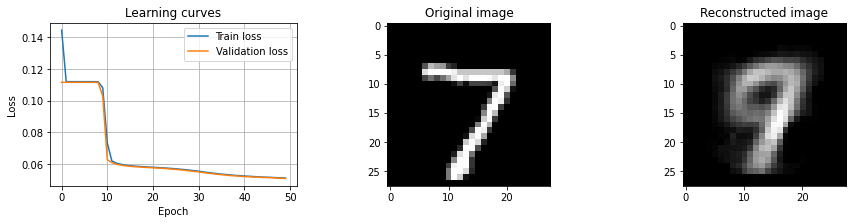

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-32(3x3)-32-128, 3 fc: 128-512-1, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 64s


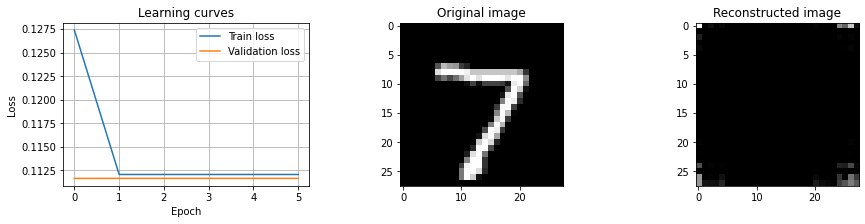

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-64(5x5)-128, 2 fc: 64-1, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm



Best val_loss: 0.04764 - train_loss: 0.04781 - execution_time: 422s


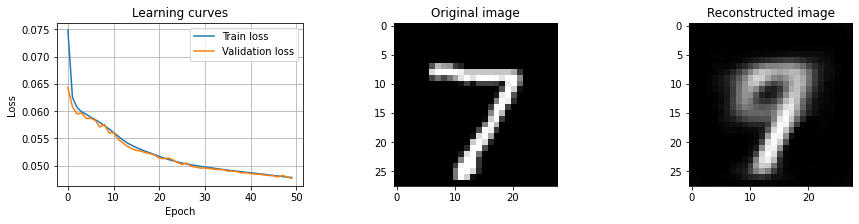

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-8(3x3), 2 fc: 32-1, act = ELU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)



Best val_loss: 0.05005 - train_loss: 0.05039 - execution_time: 506s


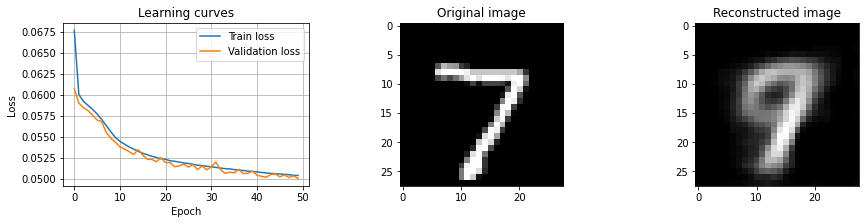

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-16(3x3), 3 fc: 32-1024-1, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm


Best val_loss: 0.04450 - train_loss: 0.04540 - execution_time: 328s


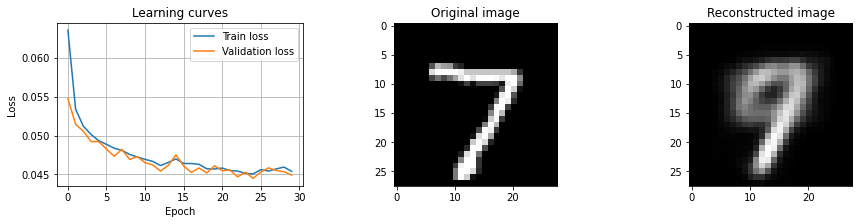

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.04450 -> CNN 2 conv: 64(3x3)-16(3x3), 3 fc: 32-1024-1, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.04764 -> CNN 3 conv: 64(5x5)-64(5x5)-128, 2 fc: 64-1, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.05005 -> CNN 2 conv: 16(3x3)-8(3x3), 2 fc: 32-1, act = ELU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)
Val_loss = 0.05097 -> CNN 3 conv: 32(3x3)-64(3x3)-128, 2 fc: 64-1, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm
Val_loss = 0.11166 -> CNN 4 conv: 16(3x3)-32(3x3)-32-128, 3 fc: 128-512-1, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
CNN 3 conv: 32(5x5)-32(5x5)-32, 3 fc: 64-512-2, act = ELU, opt = RMSprop, lr = 0.0003, reg = Batch norm



Best val_loss: 0.03516 - train_loss: 0.03498 - execution_time: 420s


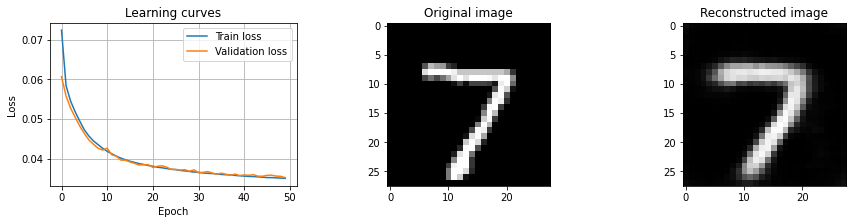

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-64(5x5)-32, 3 fc: 64-512-2, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-06)


Best val_loss: 0.11166 - train_loss: 0.11241 - execution_time: 49s


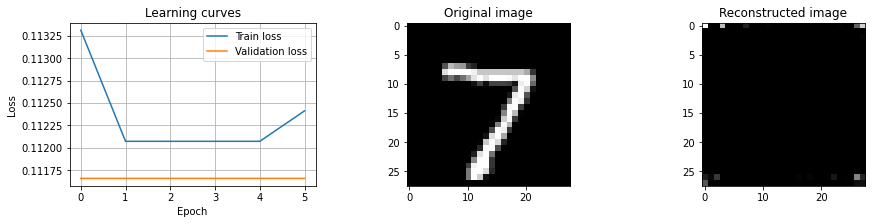

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-32(5x5)-32, 2 fc: 64-2, act = ELU, opt = Adam, lr = 0.0003, reg = False



Best val_loss: 0.03788 - train_loss: 0.03761 - execution_time: 435s


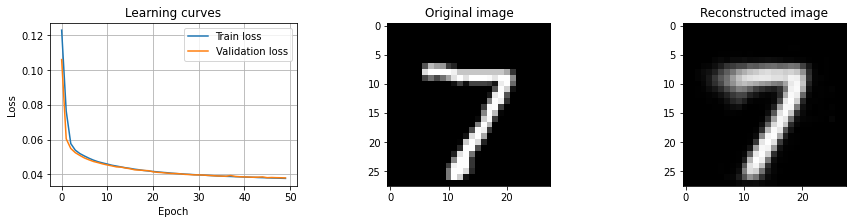

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-16(5x5)-32-64, 3 fc: 128-512-2, act = ELU, opt = Adam, lr = 0.0001, reg = Batch norm



Best val_loss: 0.04498 - train_loss: 0.04526 - execution_time: 437s


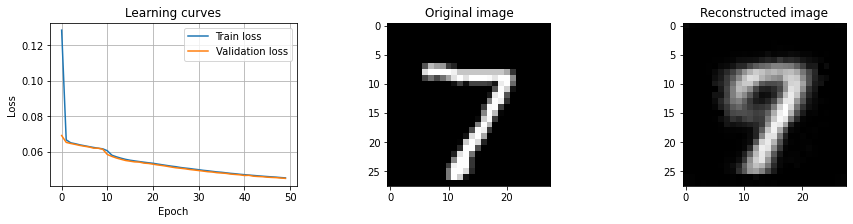

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(5x5)-32(5x5)-64-32, 3 fc: 128-1024-2, act = ELU, opt = Adam, lr = 0.0001, reg = False



Best val_loss: 0.04027 - train_loss: 0.04037 - execution_time: 456s


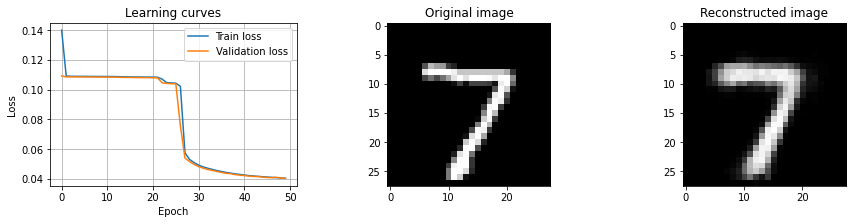

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.03516 -> CNN 3 conv: 32(5x5)-32(5x5)-32, 3 fc: 64-512-2, act = ELU, opt = RMSprop, lr = 0.0003, reg = Batch norm
Val_loss = 0.03788 -> CNN 3 conv: 64(5x5)-32(5x5)-32, 2 fc: 64-2, act = ELU, opt = Adam, lr = 0.0003, reg = False
Val_loss = 0.04027 -> CNN 4 conv: 64(5x5)-32(5x5)-64-32, 3 fc: 128-1024-2, act = ELU, opt = Adam, lr = 0.0001, reg = False
Val_loss = 0.04450 -> CNN 2 conv: 64(3x3)-16(3x3), 3 fc: 32-1024-1, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.04498 -> CNN 4 conv: 32(5x5)-16(5x5)-32-64, 3 fc: 128-512-2, act = ELU, opt = Adam, lr = 0.0001, reg = Batch norm
Val_loss = 0.04764 -> CNN 3 conv: 64(5x5)-64(5x5)-128, 2 fc: 64-1, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.05005 -> CNN 2 conv: 16(3x3)-8(3x3), 2 fc: 32-1, act = ELU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)
Val_loss = 0.05097 -> 


Best val_loss: 0.03446 - train_loss: 0.03454 - execution_time: 410s


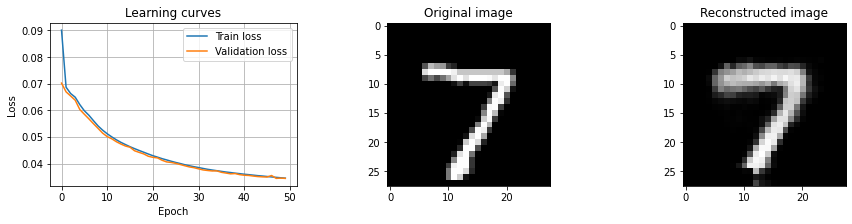

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 64-512-4, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.02598 - train_loss: 0.02572 - execution_time: 556s


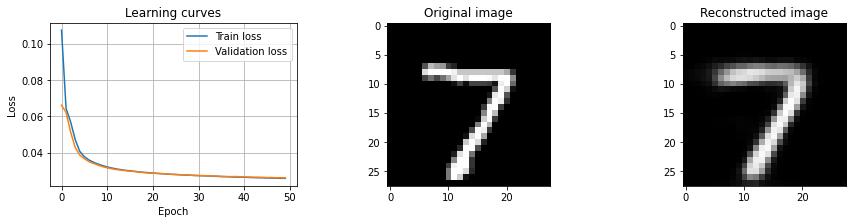

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-8(5x5)-128, 2 fc: 64-4, act = ELU, opt = Adam, lr = 0.0003, reg = False



Best val_loss: 0.02707 - train_loss: 0.02677 - execution_time: 419s


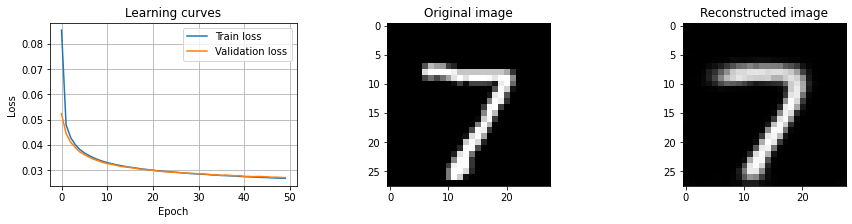

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(3x3)-32(3x3)-64-32, 2 fc: 128-4, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.03346 - train_loss: 0.03378 - execution_time: 549s


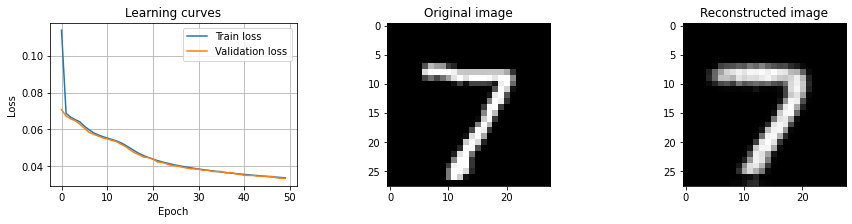

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(5x5)-8(5x5), 3 fc: 32-512-4, act = ELU, opt = Adam, lr = 0.0003, reg = Batch norm



Best val_loss: 0.02901 - train_loss: 0.02901 - execution_time: 408s


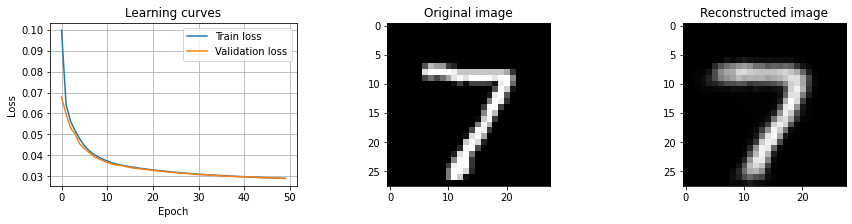

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.02598 -> CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 64-512-4, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.02707 -> CNN 3 conv: 32(5x5)-8(5x5)-128, 2 fc: 64-4, act = ELU, opt = Adam, lr = 0.0003, reg = False
Val_loss = 0.02901 -> CNN 2 conv: 32(5x5)-8(5x5), 3 fc: 32-512-4, act = ELU, opt = Adam, lr = 0.0003, reg = Batch norm
Val_loss = 0.03346 -> CNN 4 conv: 8(3x3)-32(3x3)-64-32, 2 fc: 128-4, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False
Val_loss = 0.03446 -> CNN 3 conv: 8(5x5)-32(5x5)-64, 2 fc: 64-4, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.03516 -> CNN 3 conv: 32(5x5)-32(5x5)-32, 3 fc: 64-512-2, act = ELU, opt = RMSprop, lr = 0.0003, reg = Batch norm
Val_loss = 0.03788 -> CNN 3 conv: 64(5x5)-32(5x5)-32, 2 fc: 64-2, act = ELU, opt = Adam, lr = 0.0003, reg = False
Val_loss = 0.0402

Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 50s


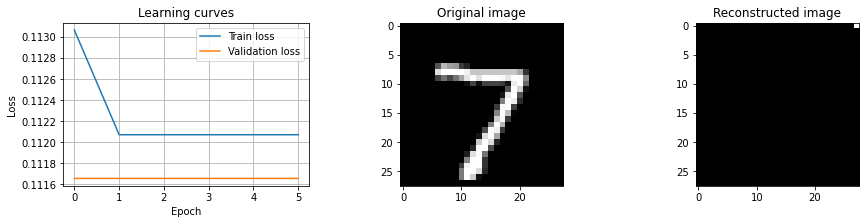

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-64(5x5), 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm



Best val_loss: 0.01904 - train_loss: 0.01890 - execution_time: 420s


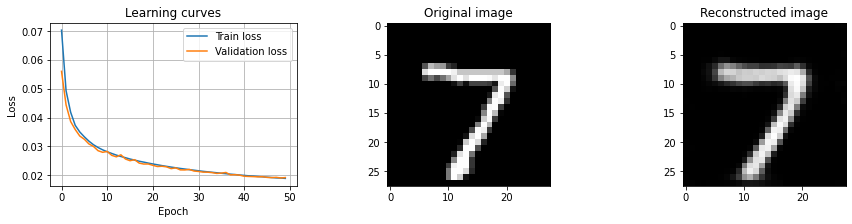

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 8(5x5)-8(5x5)-32, 2 fc: 64-8, act = LeakyReLU, opt = Adam, lr = 0.003, reg = False


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 65s


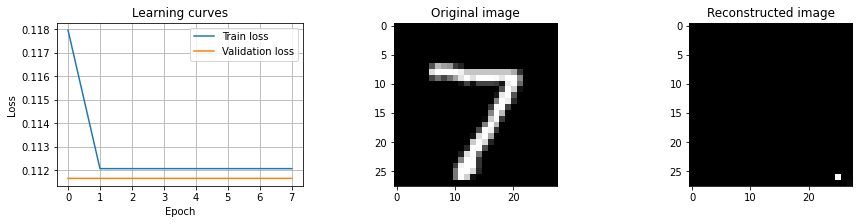

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-64(3x3), 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-05)



Best val_loss: 0.02071 - train_loss: 0.02084 - execution_time: 544s


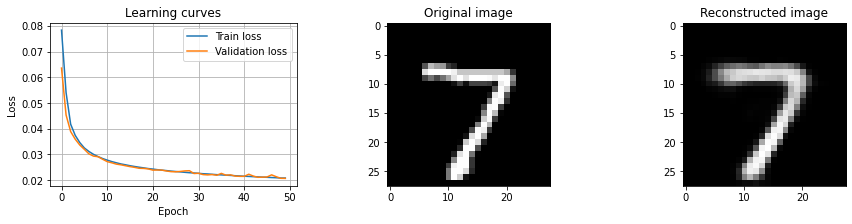

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-128-128, 3 fc: 128-512-8, act = LeakyReLU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 75s


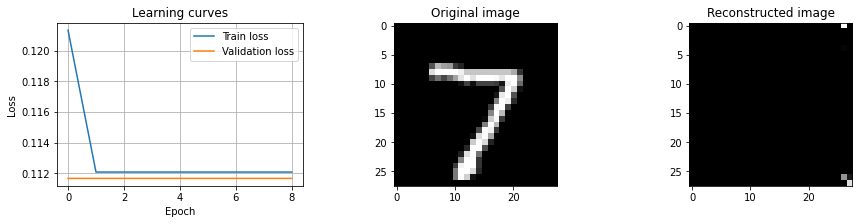

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.01904 -> CNN 2 conv: 64(5x5)-64(5x5), 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.02071 -> CNN 2 conv: 64(3x3)-64(3x3), 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-05)
Val_loss = 0.02598 -> CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 64-512-4, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.02707 -> CNN 3 conv: 32(5x5)-8(5x5)-128, 2 fc: 64-4, act = ELU, opt = Adam, lr = 0.0003, reg = False
Val_loss = 0.02901 -> CNN 2 conv: 32(5x5)-8(5x5), 3 fc: 32-512-4, act = ELU, opt = Adam, lr = 0.0003, reg = Batch norm
Val_loss = 0.03346 -> CNN 4 conv: 8(3x3)-32(3x3)-64-32, 2 fc: 128-4, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False
Val_loss = 0.03446 -> CNN 3 conv: 8(5x5)-32(5x5)-64, 2 fc: 64-4, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.035


Best val_loss: 0.00849 - train_loss: 0.00818 - execution_time: 535s


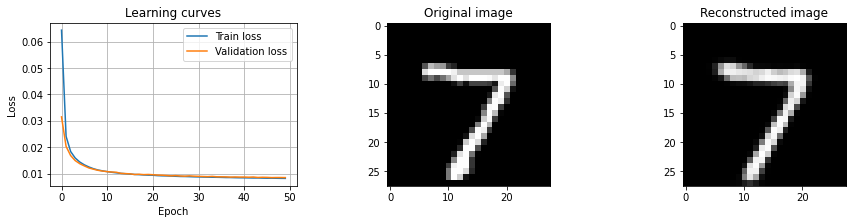

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-32(3x3)-64-32, 2 fc: 128-16, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False



Best val_loss: 0.01569 - train_loss: 0.01570 - execution_time: 518s


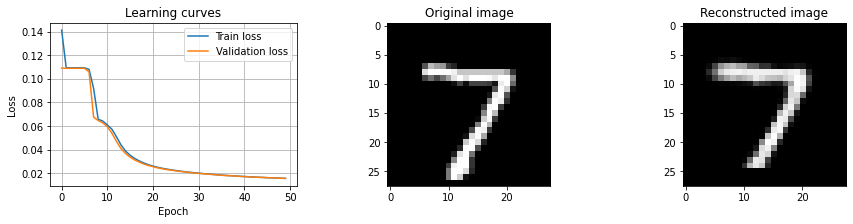

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-32(5x5)-128-128, 3 fc: 128-1024-16, act = LeakyReLU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-06)


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 50s


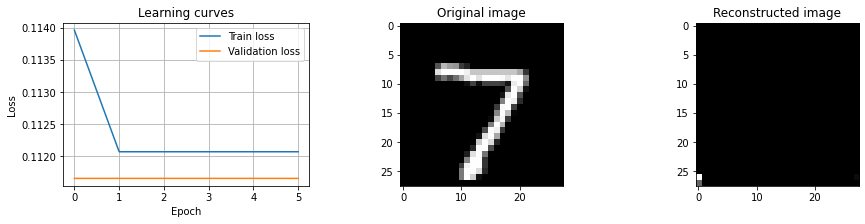

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-8(5x5), 3 fc: 32-1024-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 112s


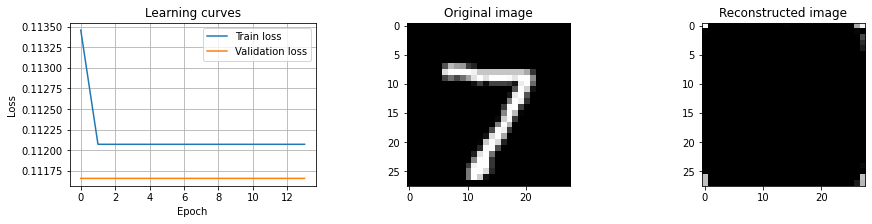

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-8(3x3)-64, 3 fc: 64-1024-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)



Best val_loss: 0.01848 - train_loss: 0.01875 - execution_time: 530s


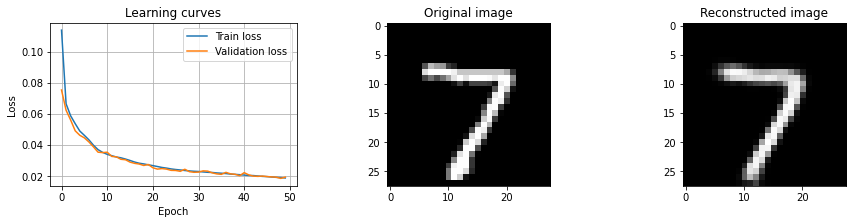

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.00849 -> CNN 2 conv: 32(3x3)-32(3x3), 2 fc: 32-16, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.01569 -> CNN 4 conv: 16(3x3)-32(3x3)-64-32, 2 fc: 128-16, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False
Val_loss = 0.01848 -> CNN 3 conv: 64(3x3)-8(3x3)-64, 3 fc: 64-1024-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)
Val_loss = 0.01904 -> CNN 2 conv: 64(5x5)-64(5x5), 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.02071 -> CNN 2 conv: 64(3x3)-64(3x3), 2 fc: 32-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-05)
Val_loss = 0.02598 -> CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 64-512-4, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.02707 -> CNN 3 conv: 32(5x5)-8(5x5)-128, 2 fc: 64-4, act = ELU, opt = Adam, lr = 0.0003, reg = False
Val_lo


Best val_loss: 0.01619 - train_loss: 0.01609 - execution_time: 530s


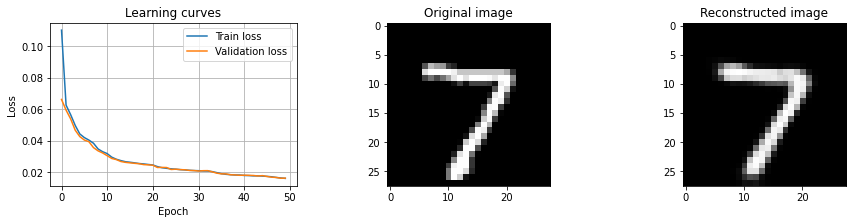

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(5x5)-8(5x5)-32-64, 3 fc: 128-1024-32, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 51s


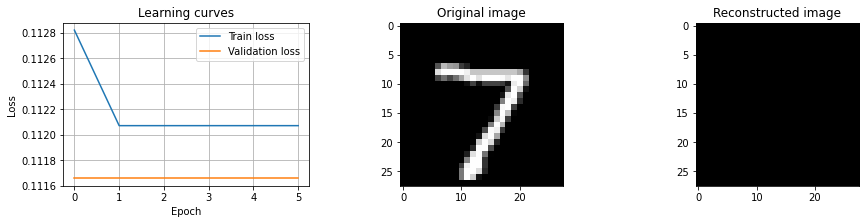

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-8(3x3)-64-64, 2 fc: 128-32, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm


Best val_loss: 0.00583 - train_loss: 0.00581 - execution_time: 384s


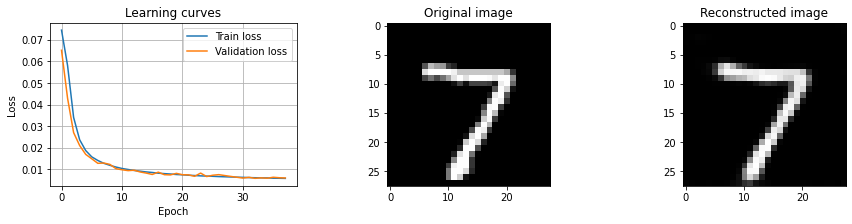

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 8(3x3)-8(3x3), 3 fc: 32-256-32, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = False



Best val_loss: 0.01641 - train_loss: 0.01641 - execution_time: 506s


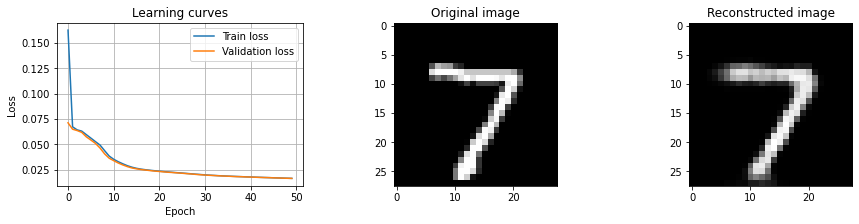

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 8(5x5)-64(5x5)-32, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)



Best val_loss: 0.00559 - train_loss: 0.00549 - execution_time: 389s


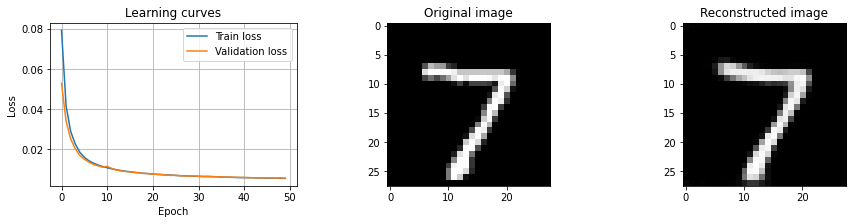

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.00559 -> CNN 3 conv: 8(5x5)-64(5x5)-32, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)
Val_loss = 0.00583 -> CNN 4 conv: 16(3x3)-8(3x3)-64-64, 2 fc: 128-32, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm
Val_loss = 0.00849 -> CNN 2 conv: 32(3x3)-32(3x3), 2 fc: 32-16, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.01569 -> CNN 4 conv: 16(3x3)-32(3x3)-64-32, 2 fc: 128-16, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False
Val_loss = 0.01619 -> CNN 4 conv: 8(3x3)-8(3x3)-32-128, 3 fc: 128-256-32, act = LeakyReLU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-05)
Val_loss = 0.01641 -> CNN 2 conv: 8(3x3)-8(3x3), 3 fc: 32-256-32, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = False
Val_loss = 0.01848 -> CNN 3 conv: 64(3x3)-8(3x3)-64, 3 fc: 64-1024-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd

In [ ]:
num_epochs = 50
patience = 5
# Define possible values for each hyper-parameter
conv_layers_v = [2,3,4]
fc_layers_v = [2,3]
Nconv_v = [8,16,32,64]
Nconv_v2 = [32,64,128]
kernel_v = [3,5]
Nh_v = [32, 64, 128, 256, 512, 1024]

encoded_space_dim_v = [1,2,4,8,16,32]
act_v = ['LeakyReLU', 'ELU']
act_dict = {'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.003, 0.001, 0.0003, 0.0001]
reg_v = ['False', 'Batch norm', 'L2']
wd_v = [0.00001, 0.000001]
results = []

grid1 = list(itertools.product(conv_layers_v, fc_layers_v, Nconv_v, Nconv_v, Nconv_v2, Nconv_v2, kernel_v))
grid2 = list(itertools.product(Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v, wd_v))
grid = [x + y for x, y in zip(grid1, grid2)] 

### Random search
random.seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
for encoded_space_dim in encoded_space_dim_v:
    for (conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, 
        Nh1, Nh2, act, opt, lr, reg, wd) in random.sample(grid, 5):
        kernel2 = kernel1
            
        print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
            f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
            f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}')
        
        start_time = time.time()

        ### Set the random seed for reproducible results
        torch.manual_seed(0)
        activation = act_dict[act]

        ### Initialize the two networks
        encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                    stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
        decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                    stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
        # Move both the encoder and the decoder to the selected device
        encoder.to(device)
        decoder.to(device)

        ### Define the loss function
        loss_fn = torch.nn.MSELoss()

        ### Define an optimizer (both for the encoder and the decoder!)
        params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
        if reg == 'L2':
            opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                        'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd)}
            optimizer = opt_dict[opt]
        else:
            opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                        'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr)}
            optimizer = opt_dict[opt]

        ### Training cycle
        no_improve_epoch = 0
        train_loss_log, val_loss_log = [], []
        best_loss = 1e10

        for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
            ### Training (use the training function)
            train_loss = train_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader, loss_fn=loss_fn, optimizer=optimizer)
            train_loss_log.append(train_loss)
            ### Validation  (use the testing function)
            val_loss = test_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=val_dataloader, loss_fn=loss_fn)
            val_loss_log.append(val_loss)

            ### Early Stopping
            (stop, val_loss, best_loss, corr_train_loss, no_improve_epoch) = early_stopping(val_loss, best_loss, train_loss, 
                                                                                                    encoder, decoder, no_improve_epoch, patience)
            if stop: break

        run_time = time.time() - start_time
        print(f'Best val_loss: {best_loss:.5f} - train_loss: {corr_train_loss:.5f} - execution_time: {run_time:.0f}s') 
        results.append((np.round(best_loss, 5), 
              f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
              f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
              f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}'))
        
        ### Plot learning curves and a reconstruction sample
        plot_results(train_loss_log, val_loss_log, encoder, decoder, device)


        print('--------------------------------------------------------------------------------------------------------------------')
        pbar.update(1)

    print('RESULTS')
    for r in sorted(results, key=lambda tup: tup[0], reverse = False):
        print(f'Val_loss = {r[0]:.5f} -> {r[1]}')


##### Code size comparison
Train 10 hyper-parameter combinations for each possible choice of the code dimension.


CNN 3 conv: 32(3x3)-64(3x3)-128, 2 fc: 64-1, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm



Best val_loss: 0.05092 - train_loss: 0.05113 - execution_time: 531s


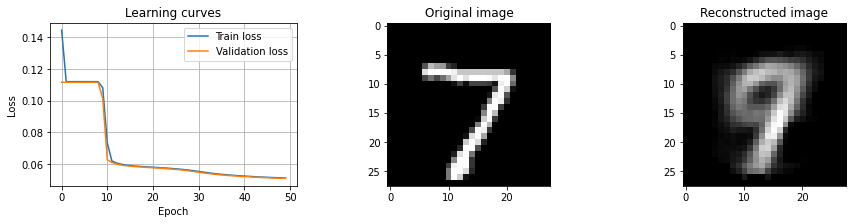

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-32(3x3)-32-128, 3 fc: 256-64-1, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.04696 - train_loss: 0.04721 - execution_time: 512s


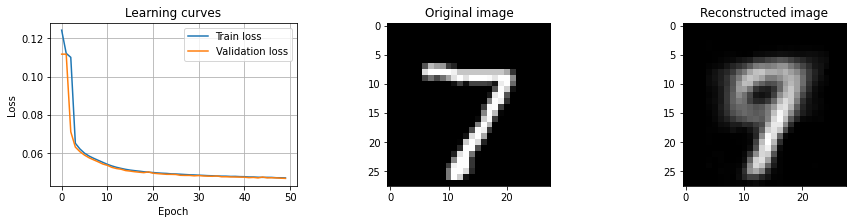

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-64(5x5)-128, 2 fc: 64-1, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm



Best val_loss: 0.04773 - train_loss: 0.04777 - execution_time: 412s


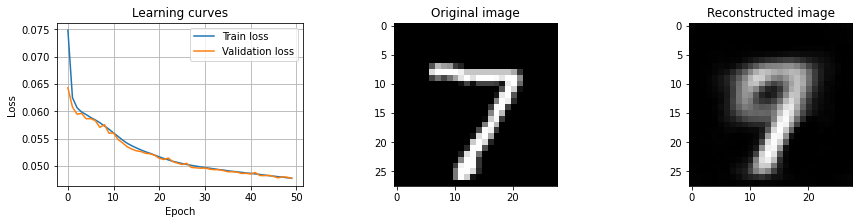

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-8(3x3), 2 fc: 32-1, act = ELU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)



Best val_loss: 0.04977 - train_loss: 0.05041 - execution_time: 473s


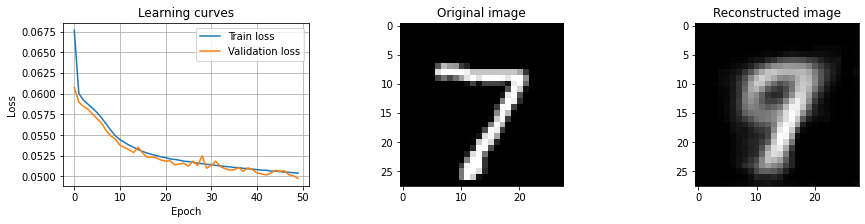

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-16(3x3), 3 fc: 64-32-1, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm


Best val_loss: 0.04450 - train_loss: 0.04515 - execution_time: 278s


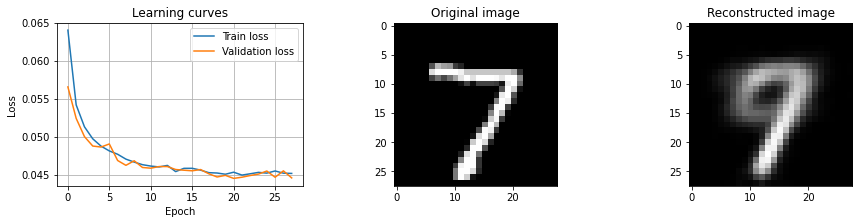

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-32(5x5)-32, 3 fc: 128-32-1, act = ELU, opt = RMSprop, lr = 0.0003, reg = Batch norm



Best val_loss: 0.04472 - train_loss: 0.04487 - execution_time: 388s


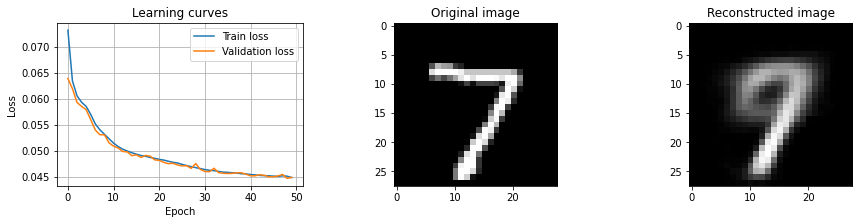

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-64(5x5)-32, 3 fc: 128-32-1, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-06)


Best val_loss: 0.04561 - train_loss: 0.04622 - execution_time: 354s


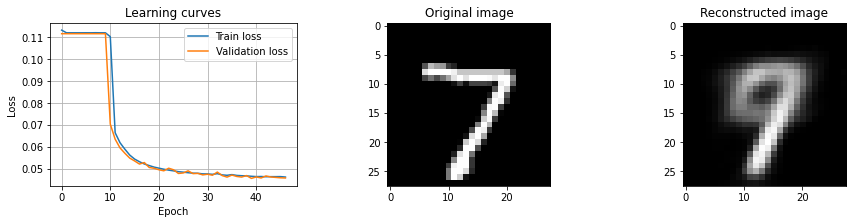

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-32(5x5)-32, 2 fc: 64-1, act = ELU, opt = Adam, lr = 0.0003, reg = False



Best val_loss: 0.04775 - train_loss: 0.04801 - execution_time: 409s


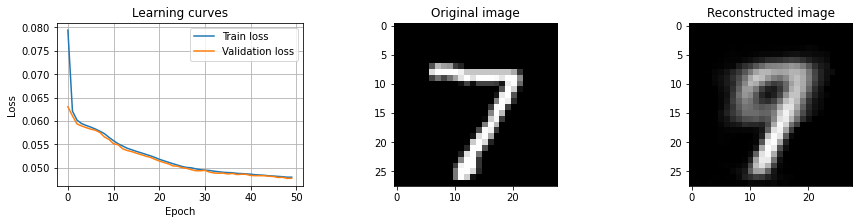

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-16(5x5)-32-64, 3 fc: 256-64-1, act = ELU, opt = Adam, lr = 0.0001, reg = Batch norm



Best val_loss: 0.05631 - train_loss: 0.05666 - execution_time: 401s


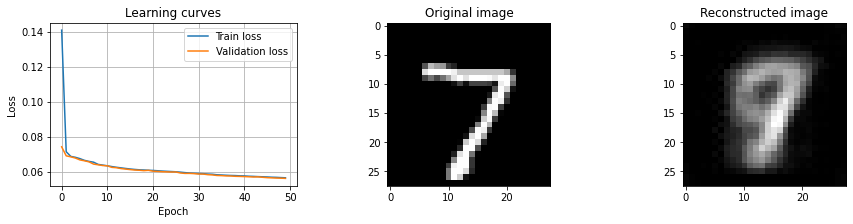

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(5x5)-32(5x5)-64-32, 3 fc: 256-128-1, act = ELU, opt = Adam, lr = 0.0001, reg = False



Best val_loss: 0.04978 - train_loss: 0.05005 - execution_time: 427s


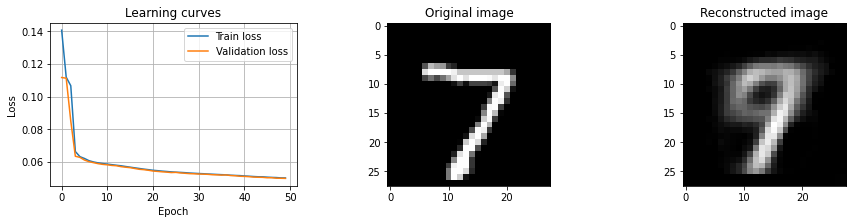

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.04450 -> CNN 2 conv: 64(3x3)-16(3x3), 3 fc: 64-32-1, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.04472 -> CNN 3 conv: 32(5x5)-32(5x5)-32, 3 fc: 128-32-1, act = ELU, opt = RMSprop, lr = 0.0003, reg = Batch norm
Val_loss = 0.04561 -> CNN 3 conv: 16(5x5)-64(5x5)-32, 3 fc: 128-32-1, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-06)
Val_loss = 0.04696 -> CNN 4 conv: 16(3x3)-32(3x3)-32-128, 3 fc: 256-64-1, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.04773 -> CNN 3 conv: 64(5x5)-64(5x5)-128, 2 fc: 64-1, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.04775 -> CNN 3 conv: 64(5x5)-32(5x5)-32, 2 fc: 64-1, act = ELU, opt = Adam, lr = 0.0003, reg = False
Val_loss = 0.04977 -> CNN 2 conv: 16(3x3)-8(3x3), 2 fc: 32-1, act = ELU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)
Val_


Best val_loss: 0.04595 - train_loss: 0.04624 - execution_time: 369s


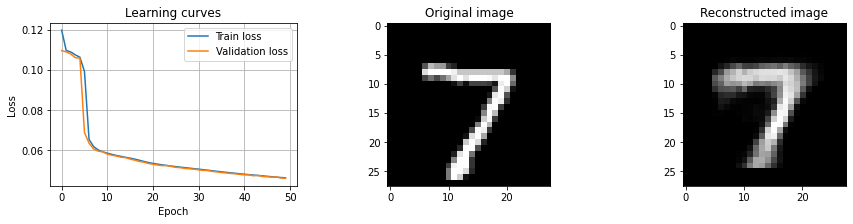

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 128-32-2, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.03881 - train_loss: 0.03882 - execution_time: 503s


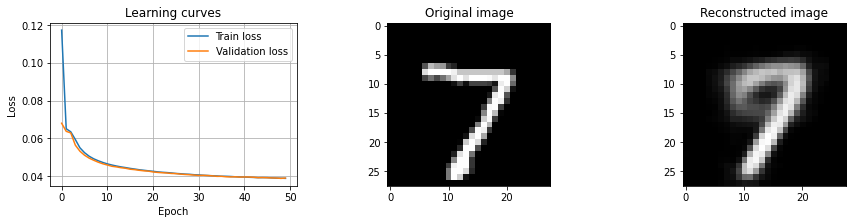

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-8(5x5)-128, 2 fc: 64-2, act = ELU, opt = Adam, lr = 0.0003, reg = False



Best val_loss: 0.03875 - train_loss: 0.03858 - execution_time: 390s


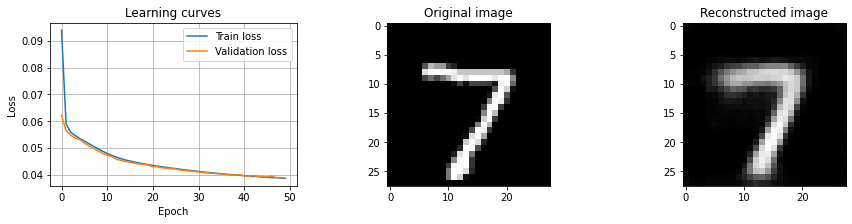

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(3x3)-32(3x3)-64-32, 2 fc: 128-2, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.04593 - train_loss: 0.04620 - execution_time: 496s


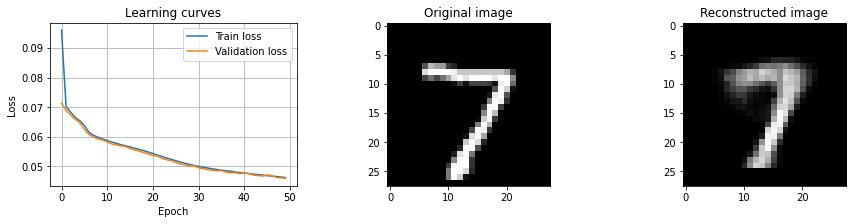

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(5x5)-8(5x5), 3 fc: 32-512-2, act = ELU, opt = Adam, lr = 0.0003, reg = Batch norm



Best val_loss: 0.03900 - train_loss: 0.03893 - execution_time: 376s


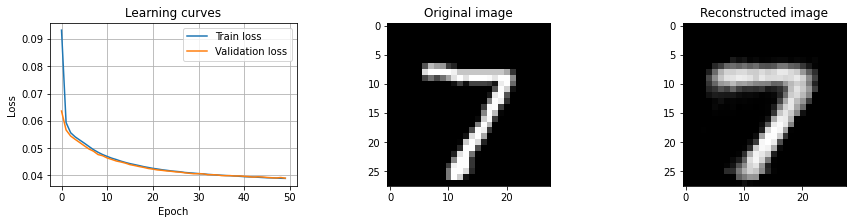

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-16(5x5)-64, 3 fc: 128-32-2, act = ELU, opt = RMSprop, lr = 0.003, reg = False


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 70s


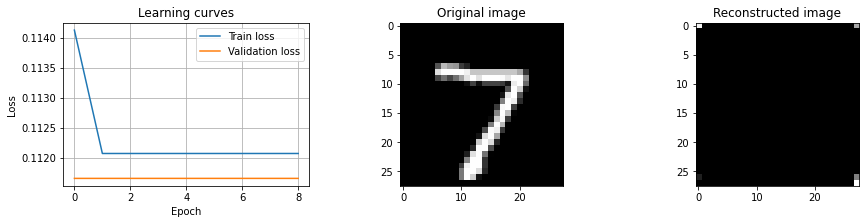

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-64(5x5), 2 fc: 32-2, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm



Best val_loss: 0.04090 - train_loss: 0.04093 - execution_time: 399s


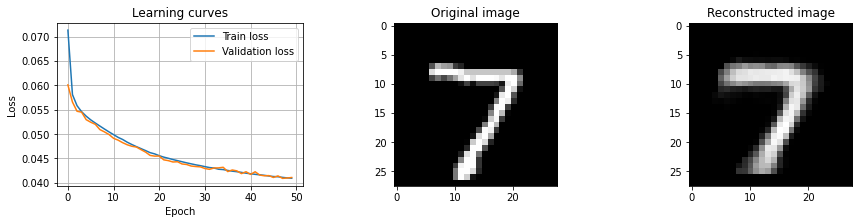

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 8(5x5)-8(5x5)-32, 2 fc: 64-2, act = LeakyReLU, opt = Adam, lr = 0.003, reg = False


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 60s


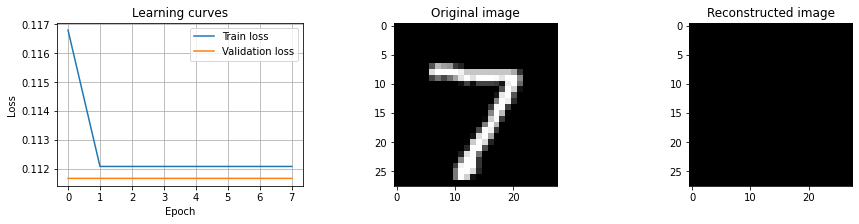

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-64(3x3), 2 fc: 32-2, act = ELU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-05)



Best val_loss: 0.04281 - train_loss: 0.04295 - execution_time: 512s


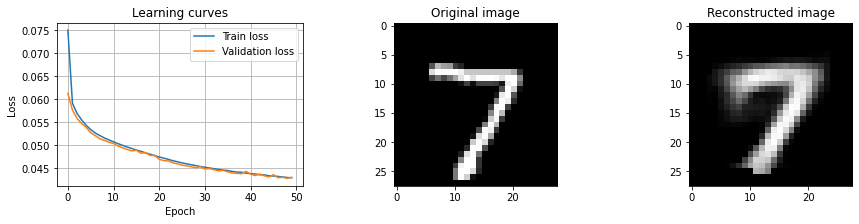

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-128-128, 3 fc: 256-64-2, act = LeakyReLU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 103s


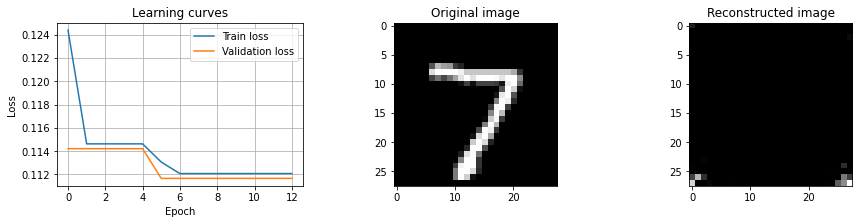

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.03875 -> CNN 3 conv: 32(5x5)-8(5x5)-128, 2 fc: 64-2, act = ELU, opt = Adam, lr = 0.0003, reg = False
Val_loss = 0.03881 -> CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 128-32-2, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.03900 -> CNN 2 conv: 32(5x5)-8(5x5), 3 fc: 32-512-2, act = ELU, opt = Adam, lr = 0.0003, reg = Batch norm
Val_loss = 0.04090 -> CNN 2 conv: 64(5x5)-64(5x5), 2 fc: 32-2, act = ELU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.04281 -> CNN 2 conv: 64(3x3)-64(3x3), 2 fc: 32-2, act = ELU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-05)
Val_loss = 0.04593 -> CNN 4 conv: 8(3x3)-32(3x3)-64-32, 2 fc: 128-2, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False
Val_loss = 0.04595 -> CNN 3 conv: 8(5x5)-32(5x5)-64, 2 fc: 64-2, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = Batch norm
Val_loss = 0.111


Best val_loss: 0.02673 - train_loss: 0.02567 - execution_time: 508s


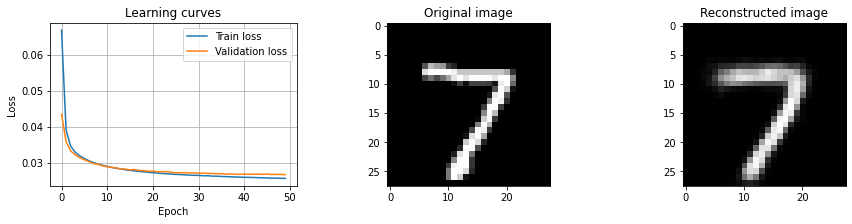

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-32(3x3)-64-32, 2 fc: 128-4, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False



Best val_loss: 0.03293 - train_loss: 0.03303 - execution_time: 499s


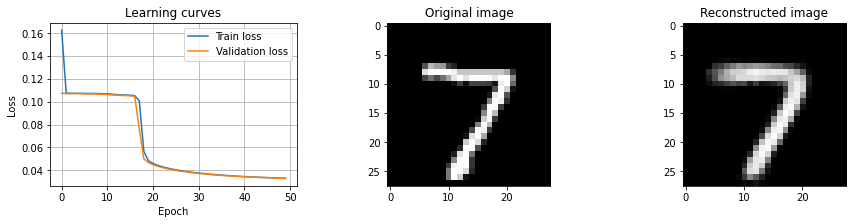

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-32(5x5)-128-128, 3 fc: 256-128-4, act = LeakyReLU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-06)


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 100s


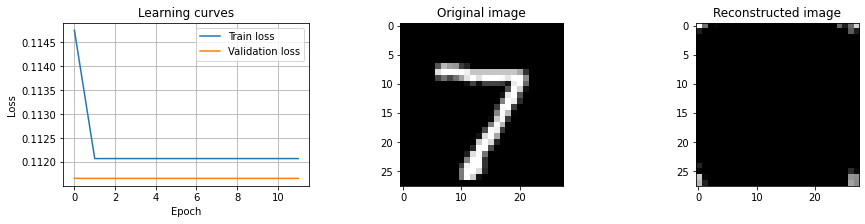

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-8(5x5), 3 fc: 64-32-4, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm



Best val_loss: 0.02594 - train_loss: 0.02571 - execution_time: 389s


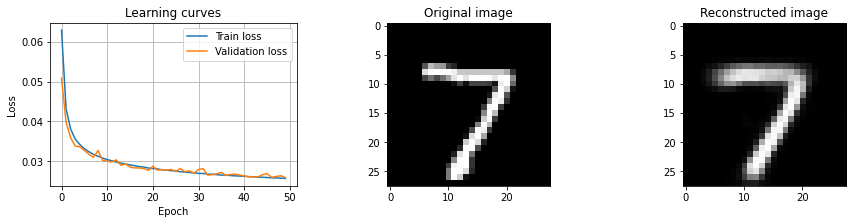

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-8(3x3)-64, 3 fc: 128-64-4, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)



Best val_loss: 0.02611 - train_loss: 0.02614 - execution_time: 511s


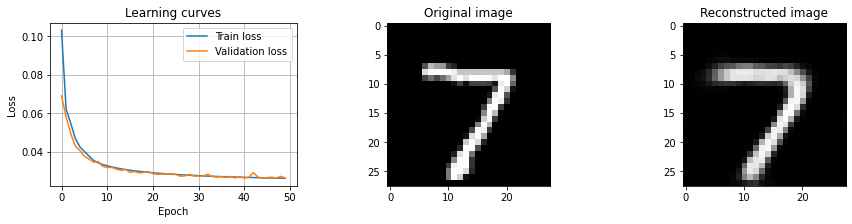

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(3x3)-8(3x3)-32-128, 3 fc: 256-32-4, act = LeakyReLU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-05)



Best val_loss: 0.02449 - train_loss: 0.02437 - execution_time: 510s


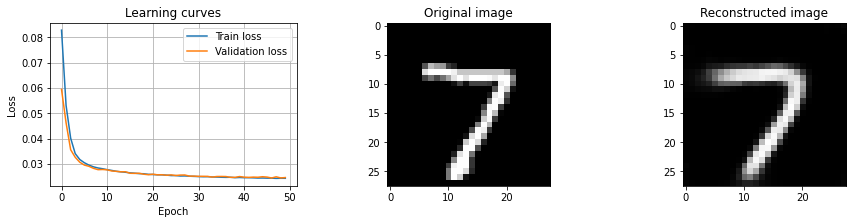

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(5x5)-8(5x5)-32-64, 3 fc: 256-128-4, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 66s


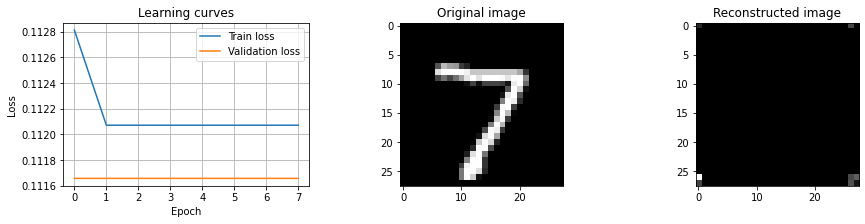

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-8(3x3)-64-64, 2 fc: 128-4, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm


Best val_loss: 0.02499 - train_loss: 0.02424 - execution_time: 317s


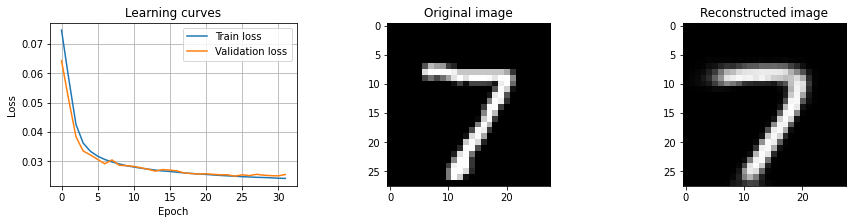

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 8(3x3)-8(3x3), 3 fc: 32-256-4, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = False



Best val_loss: 0.02979 - train_loss: 0.02974 - execution_time: 493s


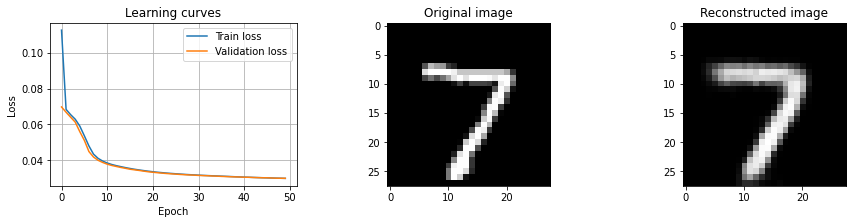

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 8(5x5)-64(5x5)-32, 2 fc: 64-4, act = ELU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)



Best val_loss: 0.02450 - train_loss: 0.02395 - execution_time: 376s


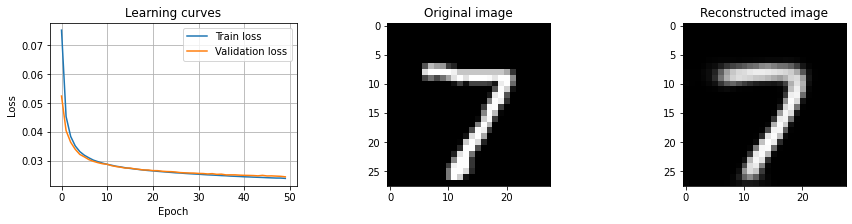

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.02449 -> CNN 4 conv: 8(3x3)-8(3x3)-32-128, 3 fc: 256-32-4, act = LeakyReLU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-05)
Val_loss = 0.02450 -> CNN 3 conv: 8(5x5)-64(5x5)-32, 2 fc: 64-4, act = ELU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)
Val_loss = 0.02499 -> CNN 4 conv: 16(3x3)-8(3x3)-64-64, 2 fc: 128-4, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm
Val_loss = 0.02594 -> CNN 2 conv: 64(5x5)-8(5x5), 3 fc: 64-32-4, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm
Val_loss = 0.02611 -> CNN 3 conv: 64(3x3)-8(3x3)-64, 3 fc: 128-64-4, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)
Val_loss = 0.02673 -> CNN 2 conv: 32(3x3)-32(3x3), 2 fc: 32-4, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm
Val_loss = 0.02979 -> CNN 2 conv: 8(3x3)-8(3x3), 3 fc: 32-256-4, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = False


Best val_loss: 0.01543 - train_loss: 0.01501 - execution_time: 499s


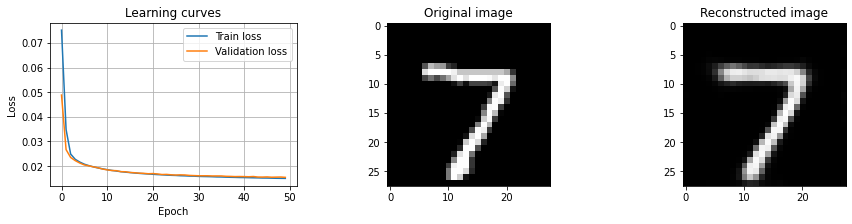

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(3x3)-64(3x3)-32-32, 3 fc: 256-32-8, act = ELU, opt = Adam, lr = 0.001, reg = False



Best val_loss: 0.01351 - train_loss: 0.01311 - execution_time: 509s


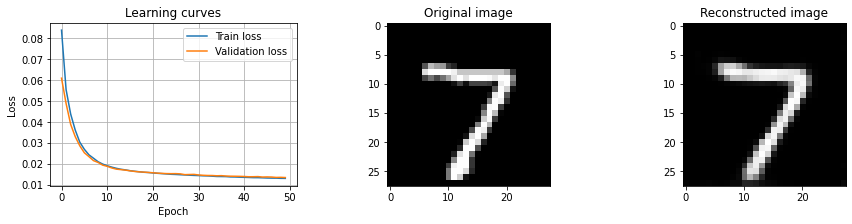

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(5x5)-8(5x5), 2 fc: 32-8, act = ELU, opt = Adam, lr = 0.001, reg = False



Best val_loss: 0.01778 - train_loss: 0.01764 - execution_time: 367s


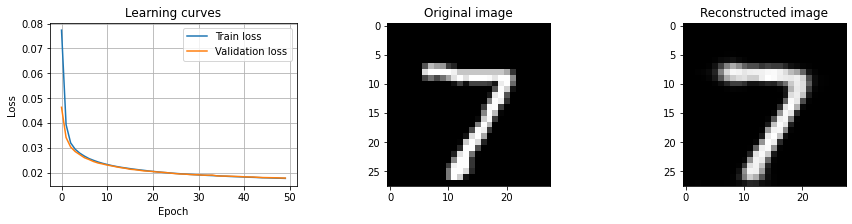

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(3x3)-16(3x3)-128-64, 2 fc: 128-8, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm



Best val_loss: 0.01243 - train_loss: 0.01098 - execution_time: 531s


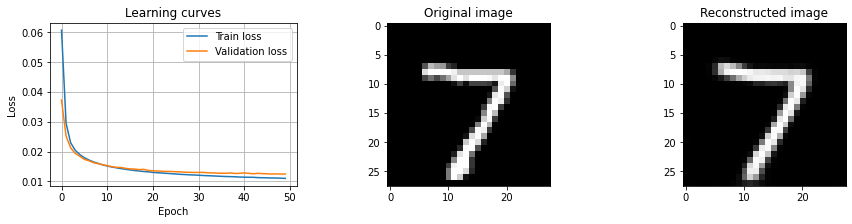

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-16(3x3)-64, 2 fc: 64-8, act = LeakyReLU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-05)



Best val_loss: 0.01507 - train_loss: 0.01474 - execution_time: 492s


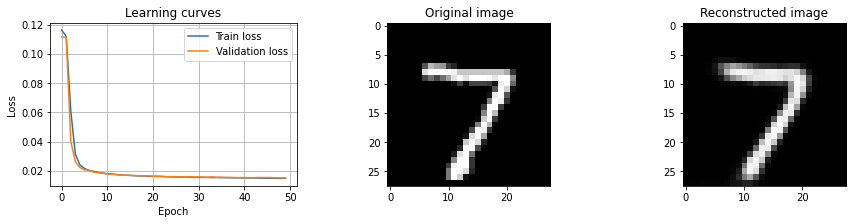

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-16(3x3)-128, 3 fc: 128-32-8, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False



Best val_loss: 0.01374 - train_loss: 0.01241 - execution_time: 498s


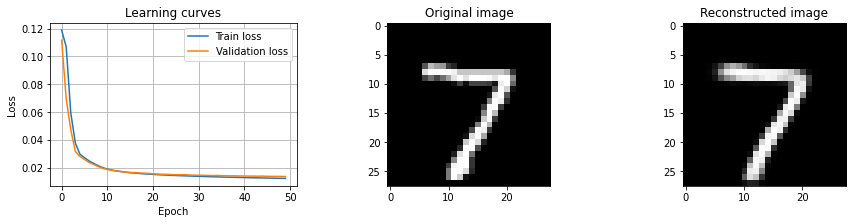

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-64(3x3)-128, 3 fc: 128-64-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.01492 - train_loss: 0.01464 - execution_time: 532s


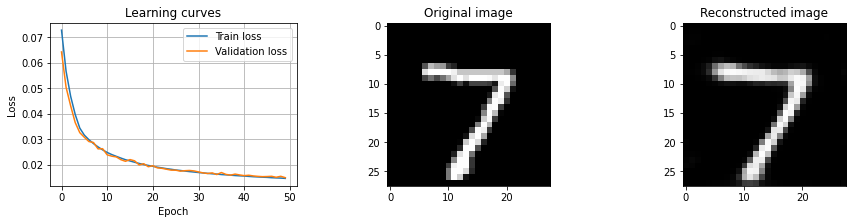

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(3x3)-64(3x3), 2 fc: 32-8, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Batch norm



Best val_loss: 0.01718 - train_loss: 0.01680 - execution_time: 502s


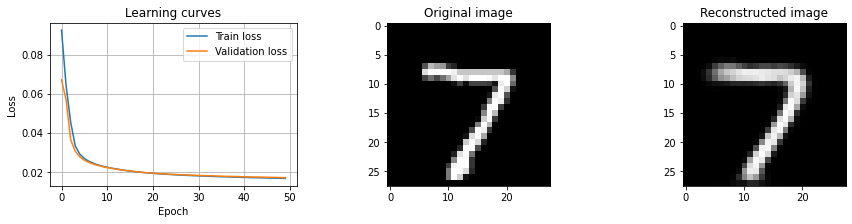

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(3x3)-8(3x3)-32, 2 fc: 64-8, act = ELU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-05)



Best val_loss: 0.01400 - train_loss: 0.01379 - execution_time: 517s


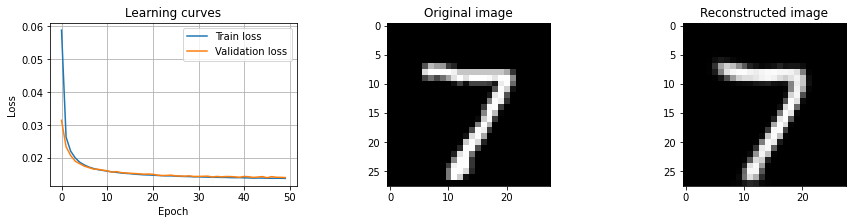

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 8(5x5)-16(5x5)-64, 3 fc: 64-512-8, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = False


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 62s


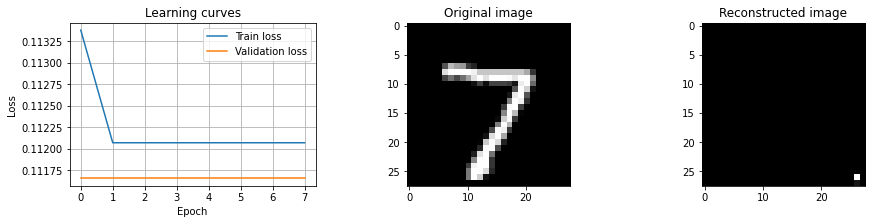

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.01243 -> CNN 4 conv: 64(3x3)-16(3x3)-128-64, 2 fc: 128-8, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm
Val_loss = 0.01351 -> CNN 4 conv: 8(3x3)-64(3x3)-32-32, 3 fc: 256-32-8, act = ELU, opt = Adam, lr = 0.001, reg = False
Val_loss = 0.01374 -> CNN 3 conv: 16(3x3)-16(3x3)-128, 3 fc: 128-32-8, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False
Val_loss = 0.01400 -> CNN 3 conv: 32(3x3)-8(3x3)-32, 2 fc: 64-8, act = ELU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-05)
Val_loss = 0.01492 -> CNN 3 conv: 64(3x3)-64(3x3)-128, 3 fc: 128-64-8, act = ELU, opt = RMSprop, lr = 0.0001, reg = False
Val_loss = 0.01507 -> CNN 3 conv: 16(3x3)-16(3x3)-64, 2 fc: 64-8, act = LeakyReLU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-05)
Val_loss = 0.01543 -> CNN 2 conv: 32(3x3)-64(3x3), 2 fc: 32-8, act = LeakyReLU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-05)
Val_loss = 0.017


Best val_loss: 0.01367 - train_loss: 0.01361 - execution_time: 392s


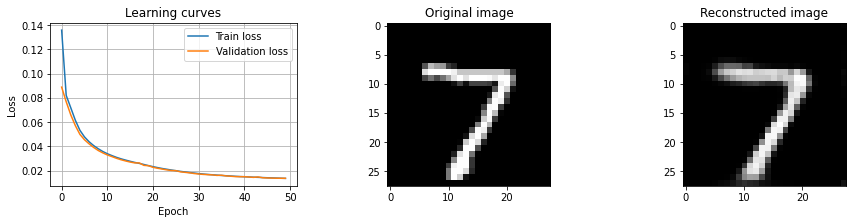

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-64-64, 2 fc: 128-16, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 64s


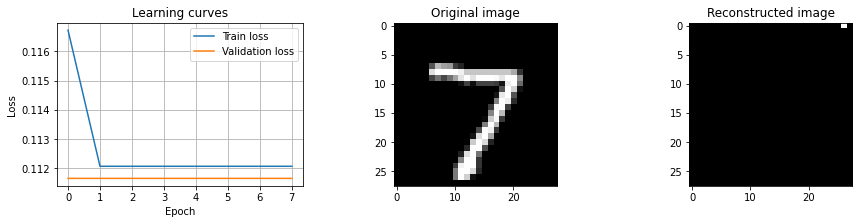

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-8(5x5)-128-64, 2 fc: 128-16, act = ELU, opt = Adam, lr = 0.0003, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 227s


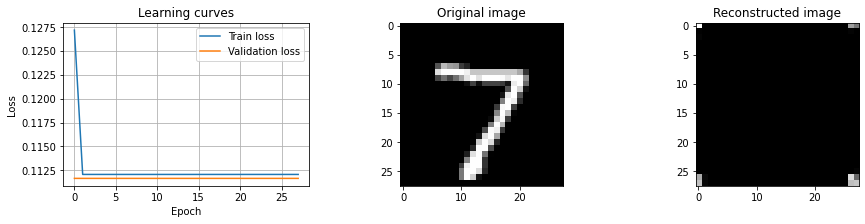

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-64(3x3), 3 fc: 32-512-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)



Best val_loss: 0.01392 - train_loss: 0.01469 - execution_time: 495s


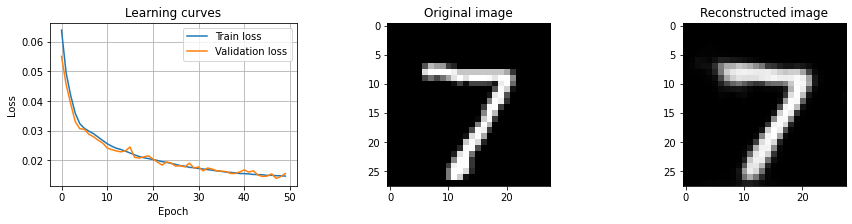

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-32(5x5)-128, 3 fc: 128-64-16, act = ELU, opt = RMSprop, lr = 0.003, reg = Batch norm


Best val_loss: 0.18709 - train_loss: 0.18731 - execution_time: 69s


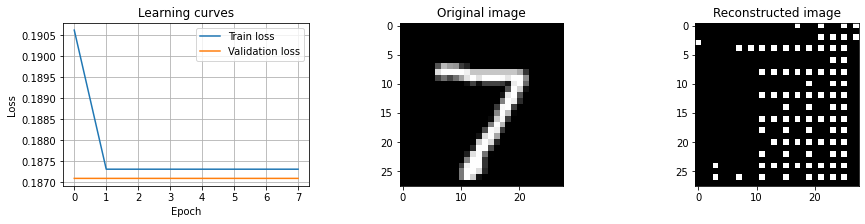

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 128-32-16, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.01181 - train_loss: 0.01173 - execution_time: 515s


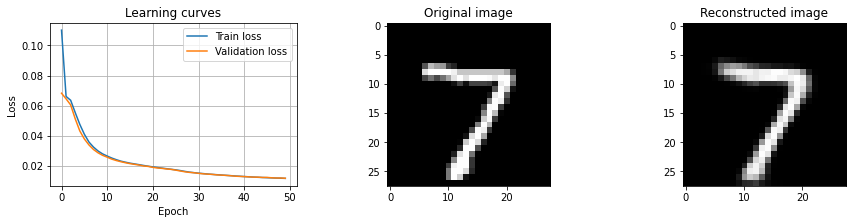

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 8(3x3)-32(3x3)-64, 3 fc: 64-512-16, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.02006 - train_loss: 0.02050 - execution_time: 493s


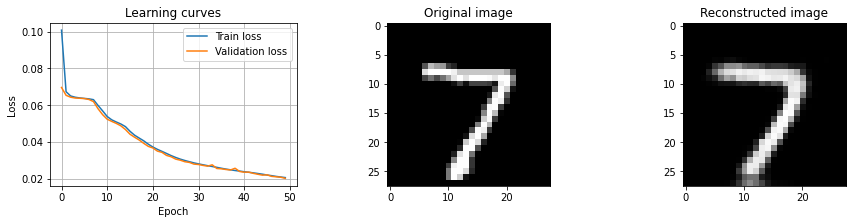

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-64(5x5)-32, 3 fc: 128-64-16, act = LeakyReLU, opt = Adam, lr = 0.001, reg = L2 (wd=1e-06)


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 85s


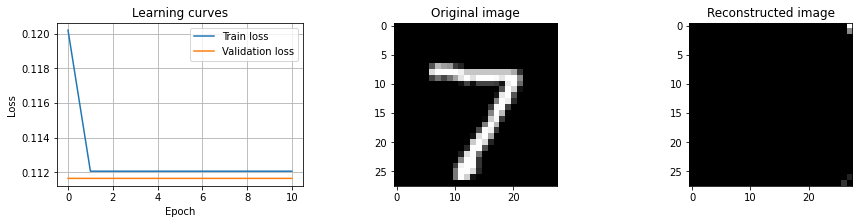

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-16(5x5), 3 fc: 64-32-16, act = ELU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-06)



Best val_loss: 0.00716 - train_loss: 0.00705 - execution_time: 394s


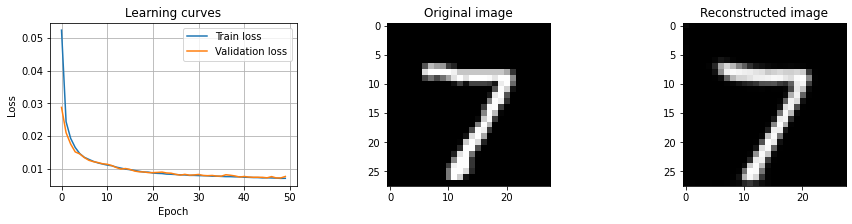

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-64(5x5), 2 fc: 32-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False



Best val_loss: 0.00914 - train_loss: 0.00889 - execution_time: 358s


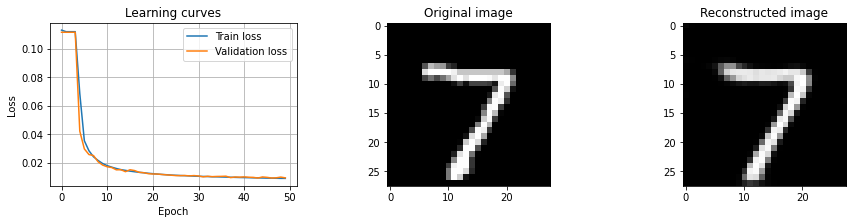

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.00716 -> CNN 2 conv: 64(5x5)-16(5x5), 3 fc: 64-32-16, act = ELU, opt = Adam, lr = 0.003, reg = L2 (wd=1e-06)
Val_loss = 0.00914 -> CNN 2 conv: 16(5x5)-64(5x5), 2 fc: 32-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False
Val_loss = 0.01181 -> CNN 3 conv: 16(3x3)-32(3x3)-32, 3 fc: 128-32-16, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.01367 -> CNN 3 conv: 8(5x5)-64(5x5)-128, 2 fc: 64-16, act = ELU, opt = Adam, lr = 0.0001, reg = L2 (wd=1e-06)
Val_loss = 0.01392 -> CNN 2 conv: 16(3x3)-64(3x3), 3 fc: 32-512-16, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = L2 (wd=1e-05)
Val_loss = 0.02006 -> CNN 3 conv: 8(3x3)-32(3x3)-64, 3 fc: 64-512-16, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False
Val_loss = 0.11166 -> CNN 4 conv: 16(5x5)-16(5x5)-64-64, 2 fc: 128-16, act = LeakyReLU, opt = Adam, lr = 0.003, reg = 


Best val_loss: 0.02840 - train_loss: 0.02840 - execution_time: 533s


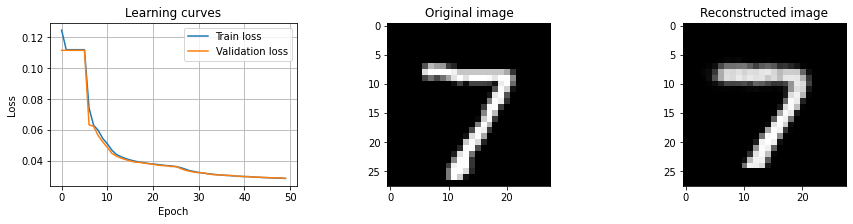

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-32(5x5)-64, 3 fc: 128-64-32, act = ELU, opt = Adam, lr = 0.0001, reg = False



Best val_loss: 0.01267 - train_loss: 0.01264 - execution_time: 426s


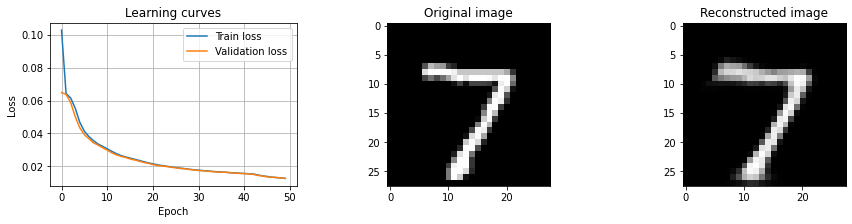

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 8(3x3)-16(3x3), 2 fc: 32-32, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = L2 (wd=1e-05)


Best val_loss: 0.01374 - train_loss: 0.01450 - execution_time: 456s


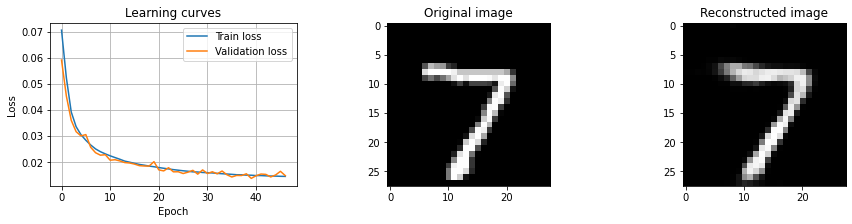

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(5x5)-32(5x5), 2 fc: 32-32, act = ELU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-06)



Best val_loss: 0.01540 - train_loss: 0.01549 - execution_time: 379s


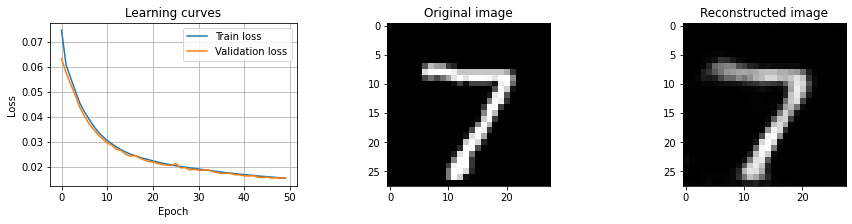

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(5x5)-16(5x5)-128-64, 3 fc: 256-32-32, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 103s


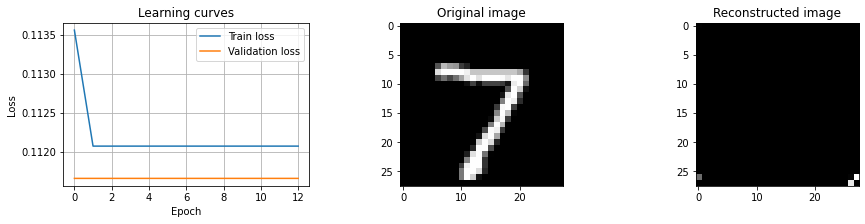

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(3x3)-64(3x3)-64-128, 3 fc: 256-128-32, act = ELU, opt = RMSprop, lr = 0.0003, reg = L2 (wd=1e-05)



Best val_loss: 0.00757 - train_loss: 0.00800 - execution_time: 543s


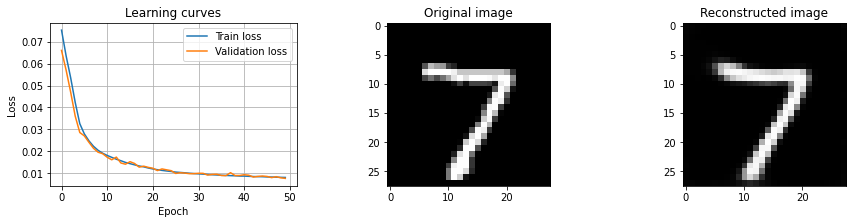

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(3x3)-16(3x3)-64, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.003, reg = False



Best val_loss: 0.00345 - train_loss: 0.00333 - execution_time: 521s


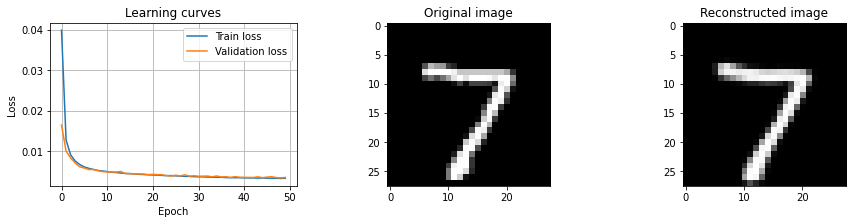

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 8(3x3)-8(3x3)-128-64, 3 fc: 256-32-32, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Batch norm



Best val_loss: 0.01400 - train_loss: 0.01388 - execution_time: 514s


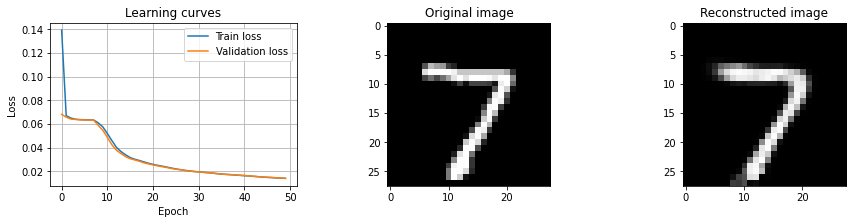

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(5x5)-16(5x5)-128-64, 3 fc: 256-128-32, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm


Best val_loss: 0.11166 - train_loss: 0.11207 - execution_time: 86s


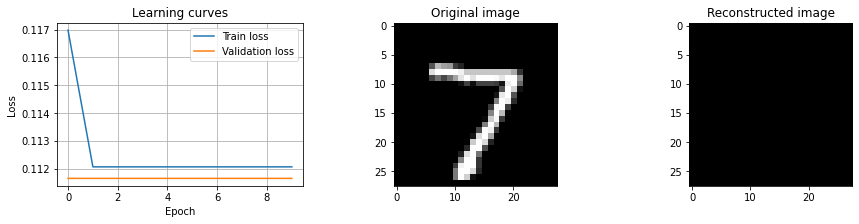

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-16(5x5)-32-128, 3 fc: 256-64-32, act = ELU, opt = Adam, lr = 0.0001, reg = L2 (wd=1e-06)



Best val_loss: 0.02242 - train_loss: 0.02250 - execution_time: 417s


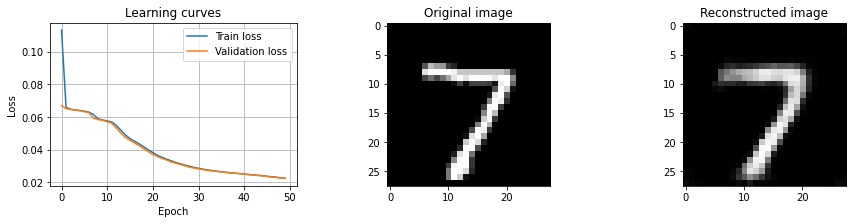

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_loss = 0.00345 -> CNN 3 conv: 64(3x3)-16(3x3)-64, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.003, reg = False
Val_loss = 0.00757 -> CNN 4 conv: 64(3x3)-64(3x3)-64-128, 3 fc: 256-128-32, act = ELU, opt = RMSprop, lr = 0.0003, reg = L2 (wd=1e-05)
Val_loss = 0.01267 -> CNN 3 conv: 64(5x5)-32(5x5)-64, 3 fc: 128-64-32, act = ELU, opt = Adam, lr = 0.0001, reg = False
Val_loss = 0.01374 -> CNN 2 conv: 8(3x3)-16(3x3), 2 fc: 32-32, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = L2 (wd=1e-05)
Val_loss = 0.01400 -> CNN 4 conv: 8(3x3)-8(3x3)-128-64, 3 fc: 256-32-32, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Batch norm
Val_loss = 0.01540 -> CNN 2 conv: 32(5x5)-32(5x5), 2 fc: 32-32, act = ELU, opt = RMSprop, lr = 0.0001, reg = L2 (wd=1e-06)
Val_loss = 0.02242 -> CNN 4 conv: 32(5x5)-16(5x5)-32-128, 3 fc: 256-64-32, act = ELU, opt = Adam, lr = 0.0001, reg = L2 (wd=1

In [ ]:
num_epochs = 50
patience = 7
# Define possible values for each hyper-parameter
conv_layers_v = [2,3,4]
fc_layers_v = [2,3]
Nconv_v = [8,16,32,64]
Nconv_v2 = [32,64,128]
kernel_v = [3,5]
Nh_v = [32, 64, 128, 256, 512]

encoded_space_dim_v = [1,2,4,8,16,32]
act_v = ['LeakyReLU', 'ELU']
act_dict = {'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.003, 0.001, 0.0003, 0.0001]
reg_v = ['False', 'Batch norm', 'L2']
wd_v = [0.00001, 0.000001]
results_all = []
results_dict = {}

grid1 = list(itertools.product(conv_layers_v, fc_layers_v, Nconv_v, Nconv_v, Nconv_v2, Nconv_v2, kernel_v))
grid2 = list(itertools.product(Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v, wd_v))
grid = [x + y for x, y in zip(grid1, grid2)] 

### Random search
random.seed(0)
pbar = tq.tqdm(total = 60, desc = 'Random search progress')
for encoded_space_dim in encoded_space_dim_v:
    results = []
    for (conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, 
        Nh1, Nh2, act, opt, lr, reg, wd) in random.sample(grid, 10):
        kernel2 = kernel1
            
        print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
            f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
            f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}')
        
        start_time = time.time()

        ### Set the random seed for reproducible results
        torch.manual_seed(0)
        activation = act_dict[act]

        ### Initialize the two networks
        encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                    stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
        decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
                    stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
        # Move both the encoder and the decoder to the selected device
        encoder.to(device)
        decoder.to(device)

        ### Define the loss function
        loss_fn = torch.nn.MSELoss()

        ### Define an optimizer (both for the encoder and the decoder!)
        params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
        if reg == 'L2':
            opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                        'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd)}
            optimizer = opt_dict[opt]
        else:
            opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                        'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr)}
            optimizer = opt_dict[opt]

        ### Training cycle
        no_improve_epoch = 0
        train_loss_log, val_loss_log = [], []
        best_loss = 1e10

        for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
            ### Training (use the training function)
            train_loss = train_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader, loss_fn=loss_fn, optimizer=optimizer)
            train_loss_log.append(train_loss)
            ### Validation  (use the testing function)
            val_loss = test_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=val_dataloader, loss_fn=loss_fn)
            val_loss_log.append(val_loss)

            ### Early Stopping
            (stop, val_loss, best_loss, corr_train_loss, no_improve_epoch) = early_stopping(val_loss, best_loss, train_loss, 
                                                                                                    encoder, decoder, no_improve_epoch, patience)
            if stop: break

        run_time = time.time() - start_time
        print(f'Best val_loss: {best_loss:.5f} - train_loss: {corr_train_loss:.5f} - execution_time: {run_time:.0f}s') 
        results.append((np.round(best_loss, 5), 
              f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
              f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
              f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}'))
        results_dict.setdefault(encoded_space_dim, []).append(np.round(best_loss, 5)) 
        
        ### Plot learning curves and a reconstruction sample
        plot_results(train_loss_log, val_loss_log, encoder, decoder, device)


        print('--------------------------------------------------------------------------------------------------------------------')
        pbar.update(1)

    print('RESULTS')
    for r in sorted(results, key=lambda tup: tup[0], reverse = False):
        print(f'Val_loss = {r[0]:.5f} -> {r[1]}')
    print('--------------------------------------------------------------------------------------------------------------------')
    print('--------------------------------------------------------------------------------------------------------------------')
    results_all += results

print('ALL RESULTS')
for r in sorted(results_all, key=lambda tup: tup[0], reverse = False):
    print(f'Val_loss = {r[0]:.5f} -> {r[1]}')

I copied these results in a text file and wrote a function to parse them into a dictionary, since colab disconnected...

In [ ]:
results_dict = {}
with open('aeresults.txt', 'r') as f:
    for line in f:
        v = line.split()[2]
        k = line.split()[10][-3:-1].replace('-','')
        
        results_dict.setdefault(int(k), []).append(float(v))
        
for k in results_dict:
    print(k, '->', results_dict[k])

32 -> [0.00345, 0.00757, 0.01267, 0.01374, 0.014, 0.0154, 0.02242, 0.0284, 0.11166, 0.11166]
16 -> [0.00716, 0.00914, 0.01181, 0.01367, 0.01392, 0.02006, 0.11166, 0.11166, 0.11166, 0.18709]
8 -> [0.01243, 0.01351, 0.01374, 0.014, 0.01492, 0.01507, 0.01543, 0.01718, 0.01778, 0.11166]
4 -> [0.02449, 0.0245, 0.02499, 0.02594, 0.02611, 0.02673, 0.02979, 0.03293, 0.11166, 0.11166]
2 -> [0.03875, 0.03881, 0.039, 0.0409, 0.04281, 0.04593, 0.04595, 0.11166, 0.11166, 0.11166]
1 -> [0.0445, 0.04472, 0.04561, 0.04696, 0.04773, 0.04775, 0.04977, 0.04978, 0.05092, 0.05631]


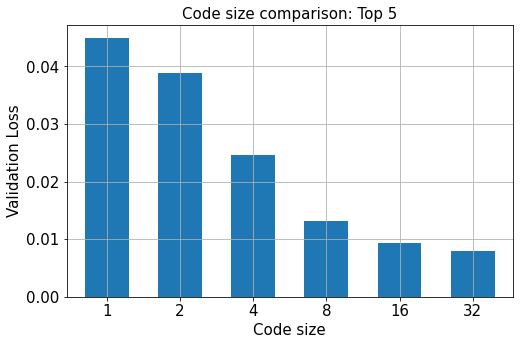

In [ ]:
# Comparison computing the mean of the 5 best results for each code size
best_3 = {}
for k in sorted(results_dict.keys(), reverse=False):
    best_3[k] = np.round(np.mean(sorted(results_dict[k])[:3]), decimals = 5)

# convert into a Series
best_3_s = pd.Series(best_3.values(), index = best_3.keys())

# plot
_ = best_3_s.plot.bar(figsize = (8,5), rot = 0, grid=True, width = .6, fontsize = 15)
_.set_title('Code size comparison: Top 5', fontsize= 15)
_.set_ylabel('Validation Loss', fontsize= 15)
_.set_xlabel('Code size', fontsize= 15)
plt.savefig('code_size_comparison_5.png')
plt.show()

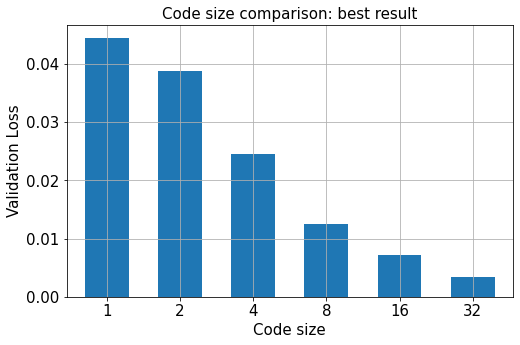

In [ ]:
# Comparison computing the mean of the best result for each code size
best_3 = {}
for k in sorted(results_dict.keys(), reverse=False):
    best_3[k] = np.round(np.mean(sorted(results_dict[k])[0]), decimals = 5)

# convert into a Series
best_3_s = pd.Series(best_3.values(), index = best_3.keys())

# plot
_ = best_3_s.plot.bar(figsize = (8,5), rot = 0, grid=True, width = .6, fontsize = 15)
_.set_title('Code size comparison: best result', fontsize= 15)
_.set_ylabel('Validation Loss', fontsize= 15)
_.set_xlabel('Code size', fontsize= 15)
plt.savefig('code_size_comparison_best.png')
plt.show()

## Final AE (code size = 8)

Best autoencoder with code size 8

In [ ]:
# Val_loss = 0.01243 -> CNN 4 conv: 64(3x3)-16(3x3)-128-64, 2 fc: 128-8, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm

In [ ]:
random.seed(0)
num_epochs = 50
patience = 7
act_dict = {'ELU':nn.ELU()}
encoded_space_dim = 8
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (4, 2, 64, 16, 128, 64, 3, 3, 128, 0, 'ELU',
                                   'Adam', 0.001, 'Batch norm', 0)
print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
    f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
    f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}')

start_time = time.time()

### Set the random seed for reproducible results
torch.manual_seed(0)
activation = act_dict[act]

### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=False, loss=False)
decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=False, loss=False)
# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
if reg == 'L2':
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd)}
    optimizer = opt_dict[opt]
else:
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr)}
    optimizer = opt_dict[opt]

### Training cycle
# no_improve_epoch = 0
train_loss_log = []
# best_loss = 1e10

for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
    ### Training (use the training function)
    train_loss = train_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader_original, loss_fn=loss_fn, optimizer=optimizer)
    train_loss_log.append(train_loss)
    
run_time = time.time() - start_time
print(f'Final train_loss: {train_loss:.5f} - execution_time: {run_time:.0f}s') 


CNN 4 conv: 64(3x3)-16(3x3)-128-64, 2 fc: 128-8, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm



Final train_loss: 0.01055 - execution_time: 582s


Save and Load

In [ ]:
torch.save(encoder.state_dict(), 'encoder_params8.torch')
torch.save(decoder.state_dict(), 'decoder_params8.torch')

In [ ]:
act_dict = {'ELU':nn.ELU()}
encoded_space_dim = 8
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (4, 2, 64, 16, 128, 64, 3, 3, 128, 0, 'ELU',
                                   'Adam', 0.001, 'Batch norm', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=reg, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params8.torch')
best_decoder = torch.load('decoder_params8.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
decoder.load_state_dict(best_decoder)
encoder.to(device)
decoder.to(device)

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=32, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=1600, bias=True)
    (3): ELU(alpha=1.0)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(64, 5, 5))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(64, 16, kernel_size=(3, 3), stride=(1, 1))
    (1): ELU(alpha=1.0)
    (2): ConvTranspose2d(16, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): ConvTranspose2d(64, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

Test evaluation

In [ ]:
test_loss = test_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=test_dataloader, loss_fn=loss_fn)

In [ ]:
test_loss

tensor(0.0120)

Plot some sample reconstruction

In [ ]:
indeces = {0:3,
           1:2,
           2:1,
           3:32,
           4:4,
           5:15,
           6:21,
           7:0,
           8:134,
           9:12}

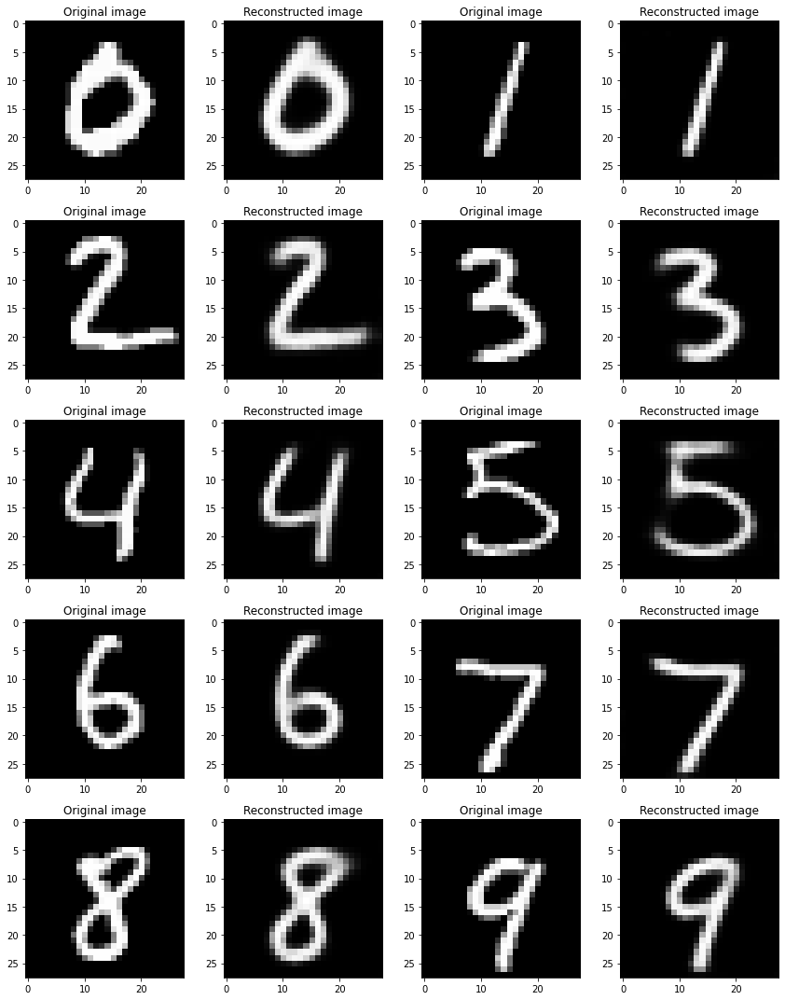

In [ ]:
fig, ax = plt.subplots(5,4, figsize=(12,15))
for i in sorted(indeces.keys()):
  # if test_dataset[i][1] == 9:
    # print(i)
    img = test_dataset[indeces[i]][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
        # Plot the original image
        # fig, ax = plt.subplots(1,2, figsize=(25,20))
        ax[i//2,2*(i%2)].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax[i//2,2*(i%2)].set_title('Original image')
        # Plot the reconstructed image
        ax[i//2,2*(i%2) + 1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax[i//2,2*(i%2) + 1].set_title('Reconstructed image')

plt.tight_layout()

#### Explore latent space

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tq.tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,label
0,-6.522764,-6.826959,-0.829369,-1.267850,-3.223139,16.365038,7.604766,14.352663,7
1,23.886806,-10.196434,-4.830221,10.400110,-26.455091,-22.051727,1.276838,4.005861,2
2,-0.562233,-1.178061,-5.899796,2.036544,-6.663957,-0.983039,-7.595374,0.230658,1
3,1.877143,46.330742,-10.255559,11.623129,-3.448220,3.089934,9.550827,5.655455,0
4,-18.540300,16.969759,2.846043,-3.429219,-2.196573,-4.577568,5.791501,9.820213,4
...,...,...,...,...,...,...,...,...,...
9995,23.562529,-6.797595,-28.447535,5.850301,-14.907333,-7.102948,17.040070,37.686718,2
9996,26.425299,9.215438,-10.630927,28.248672,-10.644348,10.767220,10.335039,19.656349,3
9997,-28.145638,13.948161,-13.591237,-4.629951,-6.801775,2.658434,-3.886203,16.493095,4
9998,5.924341,9.163125,-20.570593,-17.786745,-25.881586,-1.080533,12.165500,-21.597477,5


In [ ]:
encoded_samples_array = np.array(encoded_samples)[:,:8]
encoded_samples_array.shape

(10000, 8)

PCA

In [ ]:
import plotly.express as px

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=2)
code_2d_pca = pca.fit_transform(encoded_samples_array)
code_2d_pca.shape

(10000, 2)

In [ ]:
px.scatter(code_2d_pca, x=0, y=1, color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
pca3d = PCA(n_components=3)
code_3d_pca = pca3d.fit_transform(encoded_samples_array)

In [ ]:
px.scatter_3d(code_3d_pca, x=0, y=1, z=2, color=encoded_samples.label.astype(str), opacity=0.9, 
              size = np.repeat(15, 10000), size_max=7)

t-distributed Stochastic Neighbor Embedding (t-SNE)

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
code_2d_t = TSNE(n_components=2).fit_transform(encoded_samples_array)
code_2d_t.shape

(10000, 2)

In [ ]:
px.scatter(code_2d_t, x=0, y=1, color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
code_3d_t = TSNE(n_components=3).fit_transform(encoded_samples_array)
code_3d_t.shape

(10000, 3)

In [ ]:
px.scatter_3d(code_3d_t, x=0, y=1, z=2, color=encoded_samples.label.astype(str), opacity=0.9, 
              size = np.repeat(15, 10000), size_max=8)

#### Generate samples from latent space

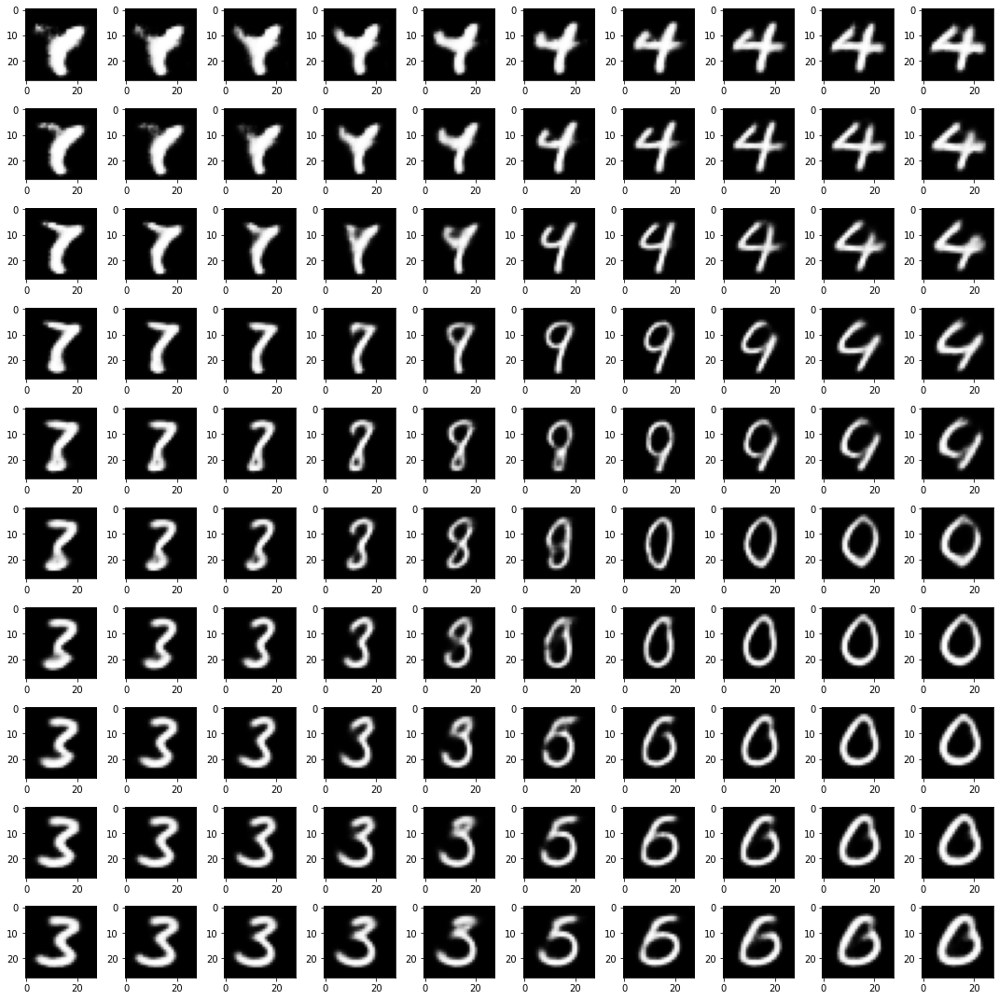

In [ ]:
fig, ax = plt.subplots(10,10, figsize=(15,15))
for m,x in enumerate(range(-40, 40, 8)):
    for n,y in enumerate(range(-40, 40, 8)):        
        reduced = [x,y]
        custom_encoded_sample = pca.inverse_transform(reduced)
        encoded_value = torch.tensor(custom_encoded_sample).float().unsqueeze(0).to(device)

        # Decode sample
        decoder.eval()
        with torch.no_grad():
            generated_img  = decoder(encoded_value)
        ax[m,n].imshow(generated_img.squeeze().cpu().numpy(), cmap='gist_gray')
plt.tight_layout()
plt.savefig('generation.png')

## Final AE (code size = 32)

Best autoencoder with code size 32

In [ ]:
# Val_loss = 0.00345 -> CNN 3 conv: 64(3x3)-16(3x3)-64, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.003, reg = False

In [ ]:
random.seed(0)
num_epochs = 50
patience = 7
act_dict = {'ELU':nn.ELU()}
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
    f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
    f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}')

start_time = time.time()

### Set the random seed for reproducible results
torch.manual_seed(0)
activation = act_dict[act]

### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=False, loss=False)
decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=False, loss=False)
# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
if reg == 'L2':
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd)}
    optimizer = opt_dict[opt]
else:
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr)}
    optimizer = opt_dict[opt]

### Training cycle
# no_improve_epoch = 0
train_loss_log = []
# best_loss = 1e10

for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
    ### Training (use the training function)
    train_loss = train_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader_original, loss_fn=loss_fn, optimizer=optimizer)
    train_loss_log.append(train_loss)
    
run_time = time.time() - start_time
print(f'Final train_loss: {train_loss:.5f} - execution_time: {run_time:.0f}s') 


CNN 3 conv: 64(3x3)-16(3x3)-64, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.003, reg = False



Final train_loss: 0.00419 - execution_time: 589s


Save and load

In [ ]:
torch.save(encoder.state_dict(), 'encoder_params32.torch')
torch.save(decoder.state_dict(), 'decoder_params32.torch')

In [ ]:
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=False, loss=False)
decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=False, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params32.torch')
best_decoder = torch.load('decoder_params32.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
decoder.load_state_dict(best_decoder)
encoder.to(device)
decoder.to(device)

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=32, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=1600, bias=True)
    (3): ELU(alpha=1.0)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(64, 5, 5))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(64, 16, kernel_size=(3, 3), stride=(1, 1))
    (1): ELU(alpha=1.0)
    (2): ConvTranspose2d(16, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): ConvTranspose2d(64, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

Test evaluation

In [ ]:
test_loss = test_epoch(encoder=encoder, decoder=decoder, device=device, dataloader=test_dataloader, loss_fn=loss_fn)
test_loss

tensor(0.0044)

Plot some sample reconstruction

In [ ]:
indeces = {0:3,
           1:2,
           2:1,
           3:32,
           4:4,
           5:15,
           6:21,
           7:0,
           8:134,
           9:12}

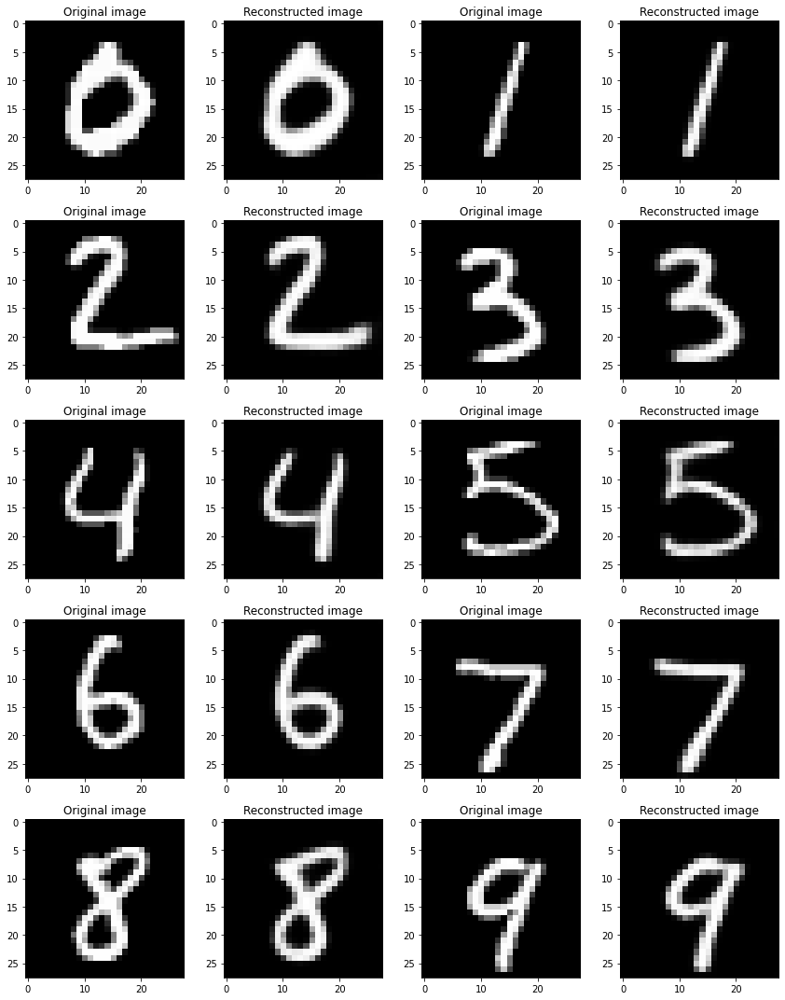

In [ ]:
fig, ax = plt.subplots(5,4, figsize=(12,15))
for i in sorted(indeces.keys()):
  # if test_dataset[i][1] == 9:
    # print(i)
    img = test_dataset[indeces[i]][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
        # Plot the original image
        # fig, ax = plt.subplots(1,2, figsize=(25,20))
        ax[i//2,2*(i%2)].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax[i//2,2*(i%2)].set_title('Original image')
        # Plot the reconstructed image
        ax[i//2,2*(i%2) + 1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax[i//2,2*(i%2) + 1].set_title('Reconstructed image')

plt.tight_layout()

#### Explore latent space

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tq.tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,Enc. Variable 10,Enc. Variable 11,Enc. Variable 12,Enc. Variable 13,Enc. Variable 14,Enc. Variable 15,Enc. Variable 16,Enc. Variable 17,Enc. Variable 18,Enc. Variable 19,Enc. Variable 20,Enc. Variable 21,Enc. Variable 22,Enc. Variable 23,Enc. Variable 24,Enc. Variable 25,Enc. Variable 26,Enc. Variable 27,Enc. Variable 28,Enc. Variable 29,Enc. Variable 30,Enc. Variable 31,label
0,1.012729,-2.385214,2.484890,-6.416272,3.234488,0.096275,2.159441,11.264174,5.291640,7.738984,0.848133,-4.853256,-5.343515,4.707671,0.280099,-2.675934,2.543573,-2.316244,1.171950,6.437627,-2.429219,1.195744,1.460629,-0.558053,0.506985,0.120375,6.183126,-3.702918,0.566592,-3.788403,-1.895590,-4.891000,7
1,-3.779321,3.761096,-7.224053,0.761306,8.409268,-2.592673,-6.714535,-0.464955,-10.997717,3.719186,4.686707,-2.132862,7.730549,-2.310938,0.873848,1.416390,-2.634227,-5.444370,1.528710,-4.367097,7.718677,0.478028,-0.495507,2.005022,-5.549494,5.116852,-5.943052,5.227020,0.865028,-4.770270,2.435677,-4.494583,2
2,-3.059771,-4.505052,0.933264,-0.444300,-0.939784,1.648073,-1.441870,6.972321,4.485645,1.948867,9.381159,3.492650,2.913052,0.752661,-0.497932,0.396376,0.760743,-8.519468,3.414716,-0.870654,-0.376810,1.839896,-2.204863,-1.515829,-6.862452,-1.755543,2.127850,-1.027420,-3.582863,-5.328647,2.655047,2.659542,1
3,0.269934,5.021901,-1.814543,-0.285691,-3.955199,-4.662696,-0.485152,5.186085,-2.641348,4.941708,-9.126124,-11.834763,6.315279,0.048282,1.421239,-3.327413,-2.647977,-6.004303,-0.620506,5.033230,0.318650,-0.784750,2.008253,-1.574335,-0.372195,1.741397,-2.783754,0.558921,3.294577,-0.110147,-0.571541,1.454613,0
4,6.953115,-0.020028,3.114210,1.591141,-0.319053,-0.485766,1.169496,0.757070,-6.277743,-1.704755,2.118919,-7.594289,-2.674615,-0.719587,0.861615,-0.157254,-3.285465,-6.155742,0.260782,0.442925,-2.926121,4.332336,-0.961169,-7.480401,6.448432,3.303060,-0.397161,0.234742,-2.703125,1.177566,-5.038344,-1.469288,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.978323,4.903055,-11.713571,-5.827464,2.492402,-2.268996,-3.527827,0.194998,-5.147901,4.964722,1.960733,-3.634715,5.929943,1.659816,0.903505,6.846421,3.126947,-3.700683,-2.992409,6.398225,-0.717426,2.163243,-7.013781,3.819857,0.167120,5.775193,-1.478218,-1.611414,-3.598679,1.018366,5.234699,-5.684326,2
9996,-1.500234,10.243281,-5.679946,-2.276520,2.518963,-0.191263,-0.607455,6.997884,-5.825378,7.144793,-5.027581,-9.246763,1.480840,1.097975,0.257218,1.182434,2.966078,-7.475118,1.541689,-0.743789,2.496494,-0.580635,1.628582,6.494421,-2.243238,1.133064,-0.672081,-7.090993,2.630132,-4.882373,1.948678,-4.001832,3
9997,5.958804,-2.148037,-1.258931,-5.561035,-6.267320,0.924597,1.067494,5.215405,3.350310,0.095394,3.862344,-6.941986,-1.008230,-5.500678,0.750859,-2.771513,-4.744202,-4.346935,-2.364298,2.309459,0.299623,-2.334009,-7.301925,2.520317,-1.139898,-5.226882,-0.494586,-2.725933,-2.935510,3.670363,0.890818,1.198549,4
9998,3.514099,-4.435143,-2.262249,1.024957,3.824091,4.692008,1.169249,11.134591,0.688222,10.159678,-4.612889,-1.907584,-2.657385,0.979097,-4.891970,-1.285542,-2.867218,-0.489813,2.098207,1.896445,5.198983,-7.774946,-0.782450,-3.997167,-0.658673,-0.769262,1.891394,7.584806,6.493754,1.696237,2.125432,1.274272,5


In [ ]:
encoded_samples_array = np.array(encoded_samples)[:,:32]
encoded_samples_array.shape

(10000, 32)

PCA

In [ ]:
pca = PCA(n_components=2)
code_2d_pca = pca.fit_transform(encoded_samples_array)
code_2d_pca.shape

(10000, 2)

In [ ]:
px.scatter(code_2d_pca, x=0, y=1, color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
pca3d = PCA(n_components=3)
code_3d_pca = pca3d.fit_transform(encoded_samples_array)

In [ ]:
px.scatter_3d(code_3d_pca, x=0, y=1, z=2, color=encoded_samples.label.astype(str), opacity=0.9, 
              size = np.repeat(15, 10000), size_max=7)

t-distributed Stochastic Neighbor Embedding (t-SNE)

In [ ]:
code_2d_t = TSNE(n_components=2).fit_transform(encoded_samples_array)
code_2d_t.shape

(10000, 2)

In [ ]:
px.scatter(code_2d_t, x=0, y=1, color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
code_3d_t = TSNE(n_components=3).fit_transform(encoded_samples_array)
code_3d_t.shape

(10000, 3)

In [ ]:
px.scatter_3d(code_3d_t, x=0, y=1, z=2, color=encoded_samples.label.astype(str), opacity=0.9, 
              size = np.repeat(15, 10000), size_max=8)

#### Generate samples from latent space

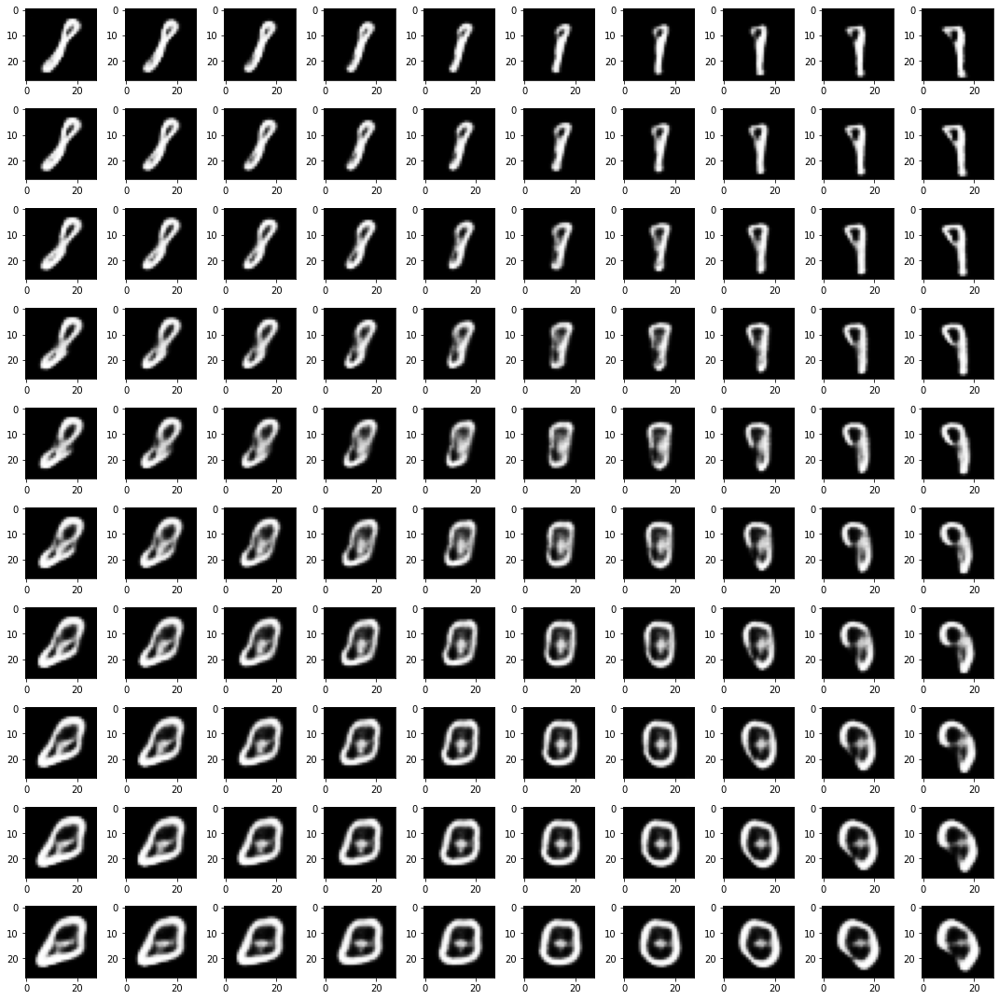

In [ ]:
fig, ax = plt.subplots(10,10, figsize=(15,15))
for m,x in enumerate(range(-20, 20, 4)):
    for n,y in enumerate(range(-20, 20, 4)):        
        reduced = [x,y]
        custom_encoded_sample = pca.inverse_transform(reduced)
        encoded_value = torch.tensor(custom_encoded_sample).float().unsqueeze(0).to(device)

        # Decode sample
        decoder.eval()
        with torch.no_grad():
            generated_img  = decoder(encoded_value)
        ax[m,n].imshow(generated_img.squeeze().cpu().numpy(), cmap='gist_gray')
plt.tight_layout()

# Classification task

## Adding 1 fc layer

In [ ]:
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=False, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params32.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
encoder.to(device)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=1600, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=32, bias=True)
  )
)

In [ ]:
backup = copy.deepcopy(encoder)

In [ ]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in encoder.named_parameters():
    # print(param_name)
    # print('\tFreezing update')
    param.requires_grad = False

In [ ]:
# Add a fully connected layer to match the new task
num_classes = 10
# encoder.encoder_lin[4] = torch.nn.Linear(256, num_classes)
encoder.encoder_lin = nn.Sequential(encoder.encoder_lin, nn.ELU(), torch.nn.Linear(32, num_classes))
print(encoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Sequential(
      (0): Linear(in_features=1600, out_features=64, bias=True)
      (1): ELU(alpha=1.0)
      (2): Linear(in_features=64, out_features=32, bias=True)
    )
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=32, out_features=10, bias=True)
  )
)


In [ ]:
# Check if correct
for param_name, param in encoder.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.0.weight 	- requires_grad=False
encoder_lin.0.0.bias 	- requires_grad=False
encoder_lin.0.2.weight 	- requires_grad=False
encoder_lin.0.2.bias 	- requires_grad=False
encoder_lin.2.weight 	- requires_grad=True
encoder_lin.2.bias 	- requires_grad=True


In [ ]:
### Training function
def train_epoch_classification(encoder, device, dataloader, loss_fn, optimizer):
    # Set train mode
    encoder.train()
    train_loss= []
    for image_batch, label_batch in dataloader:
        # Move tensors to the selected device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Forward pass
        out = encoder(image_batch)
        # Evaluate loss
        loss = loss_fn(out, label_batch)
        # Backward pass and update
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Save loss
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)
        # Print loss
        # print('\t Training loss (single batch):', float(loss.data))

In [ ]:
### Testing function
def test_epoch_classification(encoder, device, dataloader, loss_fn):
    # Set evaluation mode
    encoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Forward pass
            out = encoder(image_batch)
            # Append the network output and the original image to the lists
            conc_out.append(out.cpu())
            conc_label.append(label_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return conc_out, conc_label, val_loss.data # We return all the outputs, all the labels and the global loss

In [ ]:
encoder_class = copy.deepcopy(encoder)


Learning rate = 0.01
Final training loss: 0.2535710036754608 - final validation loss: 0.2605186402797699 - execution_time: 313s


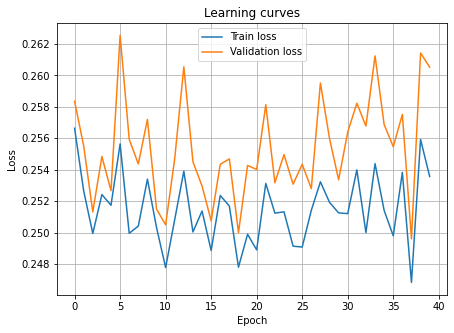


Learning rate = 0.001
Final training loss: 0.24326343834400177 - final validation loss: 0.24636392295360565 - execution_time: 318s


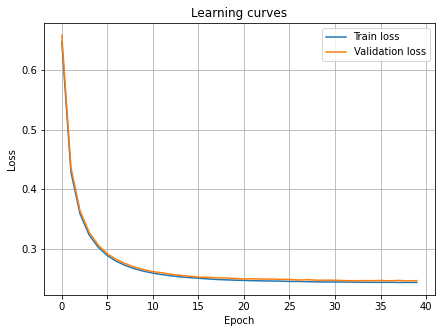


Learning rate = 0.0001
Final training loss: 0.28872159123420715 - final validation loss: 0.2924019396305084 - execution_time: 318s


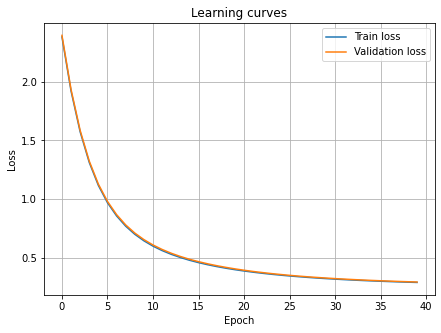


Learning rate = 1e-05
Final training loss: 1.2532694339752197 - final validation loss: 1.264450192451477 - execution_time: 317s


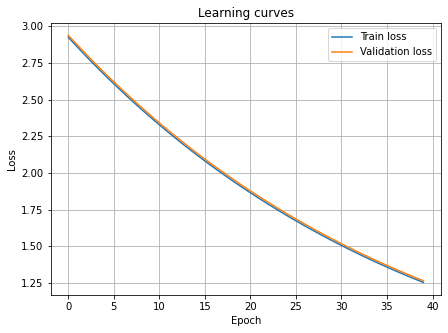


Learning rate = 1e-06
Final training loss: 2.7278997898101807 - final validation loss: 2.7412006855010986 - execution_time: 306s


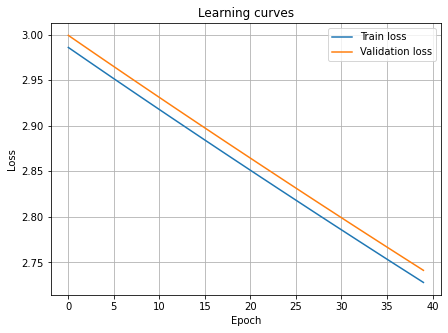

In [ ]:
num_epochs = 40
for lr in tq.tqdm([1e-2, 1e-3, 1e-4, 1e-5, 1e-6]):
    print(f'\nLearning rate = {lr}')
        
    # Define a loss function (CrossEntropyLoss)
    loss_fn = torch.nn.CrossEntropyLoss()

    # Define an optimizer
    optim = torch.optim.Adam(encoder.parameters(), lr=lr)

    # Move all the network parameters to the selected device
    encoder.to(device)
    
    ### Training cycle
    train_losses = []
    val_losses = []
    start_time = time.time()
    for epoch in range(num_epochs):
        ### Training (use the training function)
        train_epoch_classification(
            encoder=encoder,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        # print(f"TRAIN - EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss}")
        
        ### Train loss (use the TESTING function! 
        # We want the train loss but using the network in eval mode and without random transformations)
        _, _, train_loss = test_epoch_classification(
            encoder=encoder,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn)
        train_losses.append(train_loss)

        ### Validation  (use the testing function)
        _, _, val_loss = test_epoch_classification(
            encoder=encoder,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        val_losses.append(val_loss)

    run_time = time.time() - start_time
    print(f'Final training loss: {train_loss} - final validation loss: {val_loss} - execution_time: {run_time:.0f}s')
    fig, ax = plt.subplots(1,1, figsize=(7,5))
    ax.plot(train_losses, label='Train loss')
    ax.plot(val_losses, label='Validation loss') # semilogy
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title('Learning curves')
    ax.grid()
    ax.legend()
    plt.show()

    encoder = encoder_class
    encoder_class = copy.deepcopy(encoder)


Retrain the best model

In [ ]:
# Define a loss function (CrossEntropyLoss)
loss_fn = torch.nn.CrossEntropyLoss()

# Define an optimizer
optim = torch.optim.Adam(encoder.parameters(), lr=0.001)

# Move all the network parameters to the selected device
encoder.to(device)
# print(encoder)

### Training cycle
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(40):
    # print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_loss = train_epoch_classification(
        encoder=encoder,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
run_time = time.time() - start_time   
print(f'Running time: {run_time}')

Running time: 149.69524002075195


In [ ]:
### Test loss
val_outputs, val_labels, val_loss = test_epoch_classification(
    encoder=encoder,
    device=device, 
    dataloader=val_dataloader, 
    loss_fn=loss_fn)

In [ ]:
### Confusion matrix
# Predicted labels
y_true = val_labels.cpu().data.numpy()
y_pred = val_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,979,1,6,5,4,8,7,4,5,3
1,0,1114,9,5,2,5,2,1,10,3
2,6,5,913,12,10,1,9,8,17,2
3,6,7,12,889,1,39,5,3,16,7
4,2,4,5,2,912,0,13,6,7,45
5,17,1,4,28,4,808,21,5,14,4
6,12,4,7,1,5,9,929,0,8,0
7,2,8,16,5,8,1,0,954,3,40
8,6,8,16,24,5,18,1,1,857,30
9,8,2,5,17,31,1,2,35,11,867


In [ ]:
tot_correct_out = (y_pred == y_true).sum()
val_accuracy = 100 * tot_correct_out / len(y_true)
print(f"VAL ACCURACY: {val_accuracy:.2f}%")

VAL ACCURACY: 92.22%


## Adding 2 fc layers

In [ ]:
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=False, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params32.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
encoder.to(device)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=1600, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=32, bias=True)
  )
)

In [ ]:
backup = copy.deepcopy(encoder)

In [ ]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in encoder.named_parameters():
    # print(param_name)
    # print('\tFreezing update')
    param.requires_grad = False

In [ ]:
# Add 2 fully connected layers to match the new task
num_classes = 10
encoder.encoder_lin = nn.Sequential(encoder.encoder_lin, nn.ELU(), 
                                    torch.nn.Linear(32, 16), nn.ELU(), 
                                    torch.nn.Linear(16, num_classes))
print(encoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Sequential(
      (0): Linear(in_features=1600, out_features=64, bias=True)
      (1): ELU(alpha=1.0)
      (2): Linear(in_features=64, out_features=32, bias=True)
    )
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=32, out_features=16, bias=True)
    (3): ELU(alpha=1.0)
    (4): Linear(in_features=16, out_features=10, bias=True)
  )
)


In [ ]:
# Check if correct
for param_name, param in encoder.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.0.weight 	- requires_grad=False
encoder_lin.0.0.bias 	- requires_grad=False
encoder_lin.0.2.weight 	- requires_grad=False
encoder_lin.0.2.bias 	- requires_grad=False
encoder_lin.2.weight 	- requires_grad=True
encoder_lin.2.bias 	- requires_grad=True
encoder_lin.4.weight 	- requires_grad=True
encoder_lin.4.bias 	- requires_grad=True


Retrain the best model

In [ ]:
# Define a loss function (CrossEntropyLoss)
loss_fn = torch.nn.CrossEntropyLoss()

# Define an optimizer
optim = torch.optim.Adam(encoder.parameters(), lr=0.003)

# Move all the network parameters to the selected device
encoder.to(device)
# print(encoder)

### Training cycle
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(40):
    # print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_loss = train_epoch_classification(
        encoder=encoder,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
run_time = time.time() - start_time   
print(f'Running time: {run_time}')

Running time: 151.85495686531067


In [ ]:
### Test loss
val_outputs, val_labels, val_loss = test_epoch_classification(
    encoder=encoder,
    device=device, 
    dataloader=val_dataloader, 
    loss_fn=loss_fn)

In [ ]:
### Confusion matrix
# Predicted labels
y_true = val_labels.cpu().data.numpy()
y_pred = val_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,995,1,3,1,1,4,0,0,8,9
1,0,1129,11,1,1,1,2,1,2,3
2,2,5,950,7,1,0,3,7,6,2
3,2,7,10,923,1,10,3,3,16,10
4,0,4,5,0,941,1,8,4,7,26
5,2,4,2,16,0,851,11,2,9,9
6,7,1,5,3,4,10,941,0,3,1
7,1,4,7,6,4,2,0,978,3,32
8,2,2,2,13,3,10,4,2,912,16
9,5,1,1,11,18,1,1,17,6,918


In [ ]:
tot_correct_out = (y_pred == y_true).sum()
val_accuracy = 100 * tot_correct_out / len(y_true)
print(f"VAL ACCURACY: {val_accuracy:.2f}%")

VAL ACCURACY: 95.38%


## Adding 2 fc layers and enable the update of the last encoder layer

In [ ]:
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=False, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params32.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
encoder.to(device)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=1600, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=32, bias=True)
  )
)

In [ ]:
backup = copy.deepcopy(encoder)

In [ ]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in encoder.named_parameters():
    # print(param_name)
    # print('\tFreezing update')
    param.requires_grad = False

In [ ]:
# Add 2 fully connected layers to match the new task 
num_classes = 10
encoder.encoder_lin = nn.Sequential(encoder.encoder_lin, nn.ELU(), 
                                    torch.nn.Linear(32, 16), nn.ELU(), 
                                    torch.nn.Linear(16, num_classes))
print(encoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Sequential(
      (0): Linear(in_features=1600, out_features=64, bias=True)
      (1): ELU(alpha=1.0)
      (2): Linear(in_features=64, out_features=32, bias=True)
    )
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=32, out_features=16, bias=True)
    (3): ELU(alpha=1.0)
    (4): Linear(in_features=16, out_features=10, bias=True)
  )
)


In [ ]:
# # Allow the training of the last two layers (classifier[4] and classifier[6])
for param in encoder.encoder_lin[0][2].parameters():
    param.requires_grad = True 
# for param in encoder.encoder_lin[2].parameters():
#     param.requires_grad = True 

In [ ]:
# Check if correct
for param_name, param in encoder.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.0.weight 	- requires_grad=False
encoder_lin.0.0.bias 	- requires_grad=False
encoder_lin.0.2.weight 	- requires_grad=True
encoder_lin.0.2.bias 	- requires_grad=True
encoder_lin.2.weight 	- requires_grad=True
encoder_lin.2.bias 	- requires_grad=True
encoder_lin.4.weight 	- requires_grad=True
encoder_lin.4.bias 	- requires_grad=True


Retrain the best model

In [ ]:
# Define a loss function (CrossEntropyLoss)
loss_fn = torch.nn.CrossEntropyLoss()

# Define an optimizer
optim = torch.optim.Adam(encoder.parameters(), lr=0.003)

# Move all the network parameters to the selected device
encoder.to(device)
# print(encoder)

### Training cycle
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(40):
    # print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_loss = train_epoch_classification(
        encoder=encoder,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
run_time = time.time() - start_time   
print(f'Running time: {run_time}')

Running time: 156.31767916679382


In [ ]:
### Test loss
val_outputs, val_labels, val_loss = test_epoch_classification(
    encoder=encoder,
    device=device, 
    dataloader=val_dataloader, 
    loss_fn=loss_fn)

In [ ]:
### Confusion matrix
# Predicted labels
y_true = val_labels.cpu().data.numpy()
y_pred = val_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,1007,1,2,0,0,2,6,0,2,2
1,0,1142,3,1,0,1,0,1,3,0
2,1,2,961,8,4,0,0,5,1,1
3,0,1,8,968,0,1,0,1,4,2
4,1,2,1,0,967,1,1,2,4,17
5,1,1,0,11,0,879,3,0,8,3
6,3,0,2,1,0,8,955,0,6,0
7,0,5,7,1,4,1,0,1001,0,18
8,1,5,4,7,4,1,0,4,937,3
9,2,2,0,5,4,1,0,5,5,955


In [ ]:
tot_correct_out = (y_pred == y_true).sum()
val_accuracy = 100 * tot_correct_out / len(y_true)
print(f"VAL ACCURACY: {val_accuracy:.2f}%")

VAL ACCURACY: 97.72%


## Adding 2 fc layers and enable the update of the last 2 encoder layers

In [ ]:
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=False, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params32.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
encoder.to(device)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=1600, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=32, bias=True)
  )
)

In [ ]:
backup = copy.deepcopy(encoder)

In [ ]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in encoder.named_parameters():
    # print(param_name)
    # print('\tFreezing update')
    param.requires_grad = False

In [ ]:
# Add 2 fully connected layers to match the new task   
num_classes = 10
encoder.encoder_lin = nn.Sequential(encoder.encoder_lin, nn.ELU(), 
                                    torch.nn.Linear(32, 16), nn.ELU(), 
                                    torch.nn.Linear(16, num_classes))
print(encoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Sequential(
      (0): Linear(in_features=1600, out_features=64, bias=True)
      (1): ELU(alpha=1.0)
      (2): Linear(in_features=64, out_features=32, bias=True)
    )
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=32, out_features=16, bias=True)
    (3): ELU(alpha=1.0)
    (4): Linear(in_features=16, out_features=10, bias=True)
  )
)


In [ ]:
# # Allow the training of the last two layers (classifier[4] and classifier[6])
for param in encoder.encoder_lin[0][2].parameters():
    param.requires_grad = True 
for param in encoder.encoder_lin[0][0].parameters():
    param.requires_grad = True 

In [ ]:
# Check if correct
for param_name, param in encoder.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.0.weight 	- requires_grad=True
encoder_lin.0.0.bias 	- requires_grad=True
encoder_lin.0.2.weight 	- requires_grad=True
encoder_lin.0.2.bias 	- requires_grad=True
encoder_lin.2.weight 	- requires_grad=True
encoder_lin.2.bias 	- requires_grad=True
encoder_lin.4.weight 	- requires_grad=True
encoder_lin.4.bias 	- requires_grad=True


Retrain the best model

In [ ]:
# Define a loss function (CrossEntropyLoss)
loss_fn = torch.nn.CrossEntropyLoss()

# Define an optimizer
optim = torch.optim.Adam(encoder.parameters(), lr=0.003)

# Move all the network parameters to the selected device
encoder.to(device)
# print(encoder)

### Training cycle
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(40):
    # print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_loss = train_epoch_classification(
        encoder=encoder,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
run_time = time.time() - start_time   
print(f'Running time: {run_time}')

Running time: 157.34611415863037


In [ ]:
### Test loss
val_outputs, val_labels, val_loss = test_epoch_classification(
    encoder=encoder,
    device=device, 
    dataloader=val_dataloader, 
    loss_fn=loss_fn)

In [ ]:
### Confusion matrix
# Predicted labels
y_true = val_labels.cpu().data.numpy()
y_pred = val_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,1013,1,1,0,0,0,3,1,0,3
1,0,1138,4,0,1,1,1,2,3,1
2,0,1,963,4,2,0,1,5,7,0
3,0,0,5,944,0,13,0,8,9,6
4,0,2,0,0,986,0,3,2,0,3
5,0,0,0,4,2,877,10,0,7,6
6,2,0,0,0,0,0,972,0,1,0
7,0,3,7,0,3,0,0,1021,1,2
8,2,0,0,1,1,1,4,1,949,7
9,2,0,0,0,13,1,0,7,2,954


In [ ]:
tot_correct_out = (y_pred == y_true).sum()
val_accuracy = 100 * tot_correct_out / len(y_true)
print(f"VAL ACCURACY: {val_accuracy:.2f}%")

VAL ACCURACY: 98.17%


## Adding 3 fc layers and enable the update of the last 2 encoder layers

In [ ]:
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=False, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params32.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
encoder.to(device)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=1600, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=32, bias=True)
  )
)

In [ ]:
backup = copy.deepcopy(encoder)

In [ ]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in encoder.named_parameters():
    # print(param_name)
    # print('\tFreezing update')
    param.requires_grad = False

In [ ]:
# Add 3 fully connected layers to match the new task 
num_classes = 10
encoder.encoder_lin = nn.Sequential(encoder.encoder_lin, nn.ELU(), 
                                    torch.nn.Linear(32, 32), nn.ELU(), 
                                    torch.nn.Linear(32, 16), nn.ELU(),
                                    torch.nn.Linear(16, num_classes))
print(encoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Sequential(
      (0): Linear(in_features=1600, out_features=64, bias=True)
      (1): ELU(alpha=1.0)
      (2): Linear(in_features=64, out_features=32, bias=True)
    )
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=32, out_features=32, bias=True)
    (3): ELU(alpha=1.0)
    (4): Linear(in_features=32, out_features=16, bias=True)
    (5): ELU(alpha=1.0)
    (6): Linear(in_features=16, out_features=10, bias=True)
  )
)


In [ ]:
# Allow the training of the last two layers (classifier[4] and classifier[6])
for param in encoder.encoder_lin[0][2].parameters():
    param.requires_grad = True 
for param in encoder.encoder_lin[0][0].parameters():
    param.requires_grad = True 

In [ ]:
# Check if correct
for param_name, param in encoder.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.0.weight 	- requires_grad=True
encoder_lin.0.0.bias 	- requires_grad=True
encoder_lin.0.2.weight 	- requires_grad=True
encoder_lin.0.2.bias 	- requires_grad=True
encoder_lin.2.weight 	- requires_grad=True
encoder_lin.2.bias 	- requires_grad=True
encoder_lin.4.weight 	- requires_grad=True
encoder_lin.4.bias 	- requires_grad=True
encoder_lin.6.weight 	- requires_grad=True
encoder_lin.6.bias 	- requires_grad=True


Retrain the best model

In [ ]:
# Define a loss function (CrossEntropyLoss)
loss_fn = torch.nn.CrossEntropyLoss()

# Define an optimizer
optim = torch.optim.Adam(encoder.parameters(), lr=0.003)

# Move all the network parameters to the selected device
encoder.to(device)
# print(encoder)

### Training cycle
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(40):
    # print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_loss = train_epoch_classification(
        encoder=encoder,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
run_time = time.time() - start_time   
print(f'Running time: {run_time}')

Running time: 161.08300065994263


In [ ]:
### Test loss
val_outputs, val_labels, val_loss = test_epoch_classification(
    encoder=encoder,
    device=device, 
    dataloader=val_dataloader, 
    loss_fn=loss_fn)

In [ ]:
### Confusion matrix
# Predicted labels
y_true = val_labels.cpu().data.numpy()
y_pred = val_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,1017,0,0,0,0,1,1,1,1,1
1,0,1132,3,2,0,1,1,3,9,0
2,0,1,969,9,0,0,0,4,0,0
3,0,0,1,974,0,9,0,0,0,1
4,0,0,1,0,965,3,5,4,6,12
5,1,0,0,3,0,892,6,0,1,3
6,1,0,1,0,1,5,966,0,1,0
7,4,4,4,1,1,1,0,1020,0,2
8,2,0,1,6,0,7,3,0,947,0
9,3,0,0,5,2,3,0,9,3,954


In [ ]:
tot_correct_out = (y_pred == y_true).sum()
val_accuracy = 100 * tot_correct_out / len(y_true)
print(f"VAL ACCURACY: {val_accuracy:.2f}%")

VAL ACCURACY: 98.36%


## Adding 3 fc layers, enable the update of the last 2 encoder layers, mod

In [ ]:
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=nn.ELU(), reg=False, loss=False)

In [ ]:
# Load the state dict previously saved
best_encoder = torch.load('encoder_params32.torch')
# Update the network parameters
encoder.load_state_dict(best_encoder)
encoder.to(device)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=1600, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=64, out_features=32, bias=True)
  )
)

In [ ]:
backup = copy.deepcopy(encoder)

In [ ]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in encoder.named_parameters():
    # print(param_name)
    # print('\tFreezing update')
    param.requires_grad = False

In [ ]:
# Add 3 fully connected layers to match the new task 
num_classes = 10
encoder.encoder_lin = nn.Sequential(encoder.encoder_lin, nn.ELU(), 
                                    torch.nn.Linear(256, 128), nn.ELU(), 
                                    torch.nn.Linear(128, 64), nn.ELU(),
                                    torch.nn.Linear(64, num_classes))
encoder.encoder_lin[0][0] = torch.nn.Linear(1600, 512)
encoder.encoder_lin[0][2] = torch.nn.Linear(512, 256)
print(encoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ELU(alpha=1.0)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Sequential(
      (0): Linear(in_features=1600, out_features=512, bias=True)
      (1): ELU(alpha=1.0)
      (2): Linear(in_features=512, out_features=256, bias=True)
    )
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=256, out_features=128, bias=True)
    (3): ELU(alpha=1.0)
    (4): Linear(in_features=128, out_features=64, bias=True)
    (5): ELU(alpha=1.0)
    (6): Linear(in_features=64, out_features=10, bias=True)
  )
)


In [ ]:
# Allow the training of the last two layers (classifier[4] and classifier[6])
# for param in encoder.encoder_lin[0][2].parameters():
#     param.requires_grad = True 
# for param in encoder.encoder_lin[0][0].parameters():
#     param.requires_grad = True 

In [ ]:
# Check if correct
for param_name, param in encoder.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.0.weight 	- requires_grad=True
encoder_lin.0.0.bias 	- requires_grad=True
encoder_lin.0.2.weight 	- requires_grad=True
encoder_lin.0.2.bias 	- requires_grad=True
encoder_lin.2.weight 	- requires_grad=True
encoder_lin.2.bias 	- requires_grad=True
encoder_lin.4.weight 	- requires_grad=True
encoder_lin.4.bias 	- requires_grad=True
encoder_lin.6.weight 	- requires_grad=True
encoder_lin.6.bias 	- requires_grad=True


Retrain the best model

In [ ]:
# Define a loss function (CrossEntropyLoss)
loss_fn = torch.nn.CrossEntropyLoss()

# Define an optimizer
optim = torch.optim.Adam(encoder.parameters(), lr=0.003)

# Move all the network parameters to the selected device
encoder.to(device)
# print(encoder)

### Training cycle
train_losses = []
val_losses = []
start_time = time.time()
for epoch in range(40):
    # print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_loss = train_epoch_classification(
        encoder=encoder,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
run_time = time.time() - start_time   
print(f'Running time: {run_time}')

Running time: 159.64899921417236


In [ ]:
### Test loss
val_outputs, val_labels, val_loss = test_epoch_classification(
    encoder=encoder,
    device=device, 
    dataloader=val_dataloader, 
    loss_fn=loss_fn)

In [ ]:
### Confusion matrix
# Predicted labels
y_true = val_labels.cpu().data.numpy()
y_pred = val_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,1015,0,1,0,1,0,0,0,4,1
1,0,1127,15,1,3,2,0,1,1,1
2,0,0,975,3,0,0,0,2,1,2
3,0,0,1,978,0,1,0,1,2,2
4,0,1,1,0,988,0,0,0,1,5
5,0,0,1,6,2,881,7,0,5,4
6,0,0,0,0,1,1,967,0,6,0
7,2,3,3,0,2,0,0,1022,0,5
8,1,1,1,1,0,1,0,1,960,0
9,3,0,0,0,6,3,0,3,1,963


In [ ]:
tot_correct_out = (y_pred == y_true).sum()
val_accuracy = 100 * tot_correct_out / len(y_true)
print(f"VAL ACCURACY: {val_accuracy:.2f}%")

VAL ACCURACY: 98.76%


### Train the best model in the full train + validation set

In [ ]:
# Define a loss function (CrossEntropyLoss)
loss_fn = torch.nn.CrossEntropyLoss()

# Define an optimizer
optim = torch.optim.Adam(encoder.parameters(), lr=0.001)

# Move all the network parameters to the selected device
encoder.to(device)
# print(encoder)

### Training cycle
train_losses = []
for epoch in tq.tqdm(range(50)):
    # print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_loss = train_epoch_classification(
        encoder=encoder,
        device=device, 
        dataloader=train_dataloader_original, 
        loss_fn=loss_fn, 
        optimizer=optim)

In [ ]:
### Test loss
test_outputs, test_labels, test_loss = test_epoch_classification(
    encoder=encoder,
    device=device, 
    dataloader=test_dataloader, 
    loss_fn=loss_fn)
# Print Test loss
print(f"TEST LOSS : {test_loss}")

TEST LOSS : 0.057775117456912994


In [ ]:
### Confusion matrix
# Predicted labels
y_true = test_labels.cpu().data.numpy()
y_pred = test_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,976,0,0,0,0,0,1,1,2,0
1,0,1132,0,0,0,1,0,0,1,1
2,1,1,1025,1,1,0,0,1,2,0
3,1,0,3,997,0,4,0,1,2,2
4,0,0,2,0,970,0,2,0,3,5
5,1,0,0,3,0,883,3,1,1,0
6,3,2,0,1,0,1,950,0,1,0
7,0,1,4,1,0,0,0,1019,1,2
8,1,0,0,2,1,0,1,2,967,0
9,0,2,0,1,6,3,2,3,1,991


In [ ]:
tot_correct_out = (y_pred == y_true).sum()
test_accuracy = 100 * tot_correct_out / len(y_true)
print(f"TEST ACCURACY: {test_accuracy:.2f}%")

TEST ACCURACY: 99.10%


# Denoising AE

In [ ]:
# DOWNLOAD DATASET
train_dataset_original = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

#### Random noise

In [ ]:
class NoisyDataset1(Dataset):

  def __init__(self, dataset, transform=None, noise_factor = 0.1):
    """
    Args:
        csv_file (string): Path to the csv file.
        transform (callable, optional): Optional transform to be applied
            on a sample.
    """
    self.transform = transform
    self.noise_factor = noise_factor

    self.data = list(dataset)
    # Now self.data contains all our dataset.
    # Each element of the list self.data is a tuple: (input, output)

  def __len__(self):

    return len(self.data)

  def __getitem__(self, idx):
    
    original_sample = self.data[idx]
    # if self.transform_noise:
    #     sample_noise = self.transform_noise(original_sample[0])
    if self.transform:
        sample = self.transform(original_sample[0])
        sample_noise = self.transform(original_sample[0])
        sample_noise = sample_noise + self.noise_factor * torch.randn(sample_noise.shape)
        
    return sample_noise, original_sample[1], sample

In [ ]:
# CREATE THE DATASETS (TRAIN AND TEST)
train_dataset_original_n1 = NoisyDataset1(train_dataset_original, 
                             transform = transforms.Compose([transforms.ToTensor(),]),
                             noise_factor = 0.1)

test_dataset_n1 = NoisyDataset1(test_dataset, 
                             transform = transforms.Compose([transforms.ToTensor(),]),
                             noise_factor = 0.1)

In [ ]:
# # SPLIT TRAINING AND VALIDATION SET
# train_dataset_n1, val_dataset_n1 = torch.utils.data.random_split(train_dataset_original_n1, 
#                                         [50000, 10000], generator=torch.Generator().manual_seed(1))

In [ ]:
# DATALOADER
train_dataloader_original_n1 = DataLoader(train_dataset_original_n1, batch_size=250, shuffle=False)
# train_dataloader_n1 = DataLoader(train_dataset_n1, batch_size=250, shuffle=False)
# val_dataloader_n1 = DataLoader(val_dataset_n1, batch_size=250, shuffle=False)
test_dataloader_n1 = DataLoader(test_dataset_n1, batch_size=250, shuffle=False)

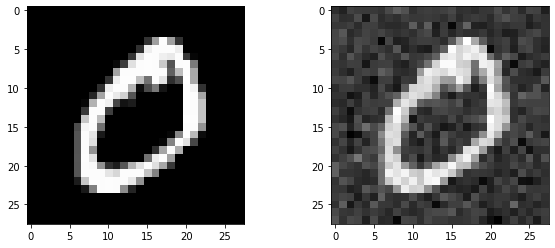

In [ ]:
# EXAMPLE
batch = next(iter(train_dataloader_original_n1))
fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].imshow(batch[2][1].cpu().squeeze().numpy(), cmap='gist_gray')
ax[1].imshow(batch[0][1].cpu().squeeze().numpy(), cmap='gist_gray')
plt.show()

CNN 3 conv: 64(3x3)-16(3x3)-64, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.003, reg = False



Best val_loss: 0.00486 - train_loss: 0.00435 - execution_time: 788s
Final training loss: 0.004349866416305304 - final validation loss: 0.00486367754638195


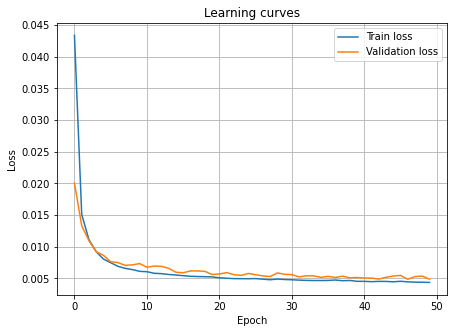

In [ ]:
random.seed(0)
num_epochs = 50
patience = 7
act_dict = {'ELU':nn.ELU()}
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
    f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
    f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}')


start_time = time.time()
# time.sleep(0.1)

### Set the random seed for reproducible results
torch.manual_seed(0)
activation = act_dict[act]

### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
if reg == 'L2':
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd)}
    optimizer = opt_dict[opt]
else:
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr)}
    optimizer = opt_dict[opt]

### Training cycle
no_improve_epoch = 0
train_loss_log, val_loss_log = [], []
best_loss = 1e10

for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
    ### Training (use the training function)
    train_loss = train_epoch_denoise(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader_original_n1, loss_fn=loss_fn, optimizer=optimizer)
    train_loss_log.append(train_loss)
    ### Validation  (use the testing function)
    val_loss = test_epoch_denoise(encoder=encoder, decoder=decoder, device=device, dataloader=test_dataloader_n1, loss_fn=loss_fn)
    val_loss_log.append(val_loss)

run_time = time.time() - start_time
print(f'Best val_loss: {val_loss:.5f} - train_loss: {train_loss:.5f} - execution_time: {run_time:.0f}s') 

print(f'Final training loss: {train_loss} - final validation loss: {val_loss}')

fig, ax = plt.subplots(1,1, figsize=(7,5))
ax.plot(train_loss_log, label='Train loss')
ax.plot(val_loss_log, label='Validation loss') # semilogy
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.set_title('Learning curves')
ax.grid()
ax.legend()
plt.show()


Test evaluation

In [ ]:
test_loss = test_epoch_denoise(encoder=encoder, decoder=decoder, device=device, dataloader=test_dataloader_n1, loss_fn=loss_fn)
test_loss

tensor(0.0049)

Plot some sample reconstruction

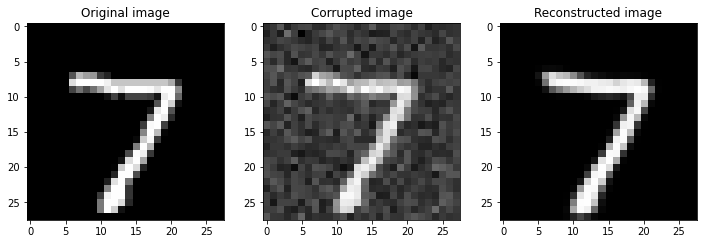

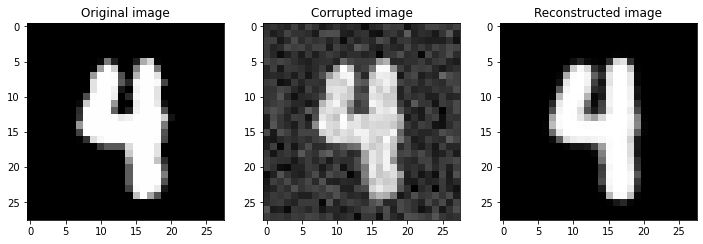

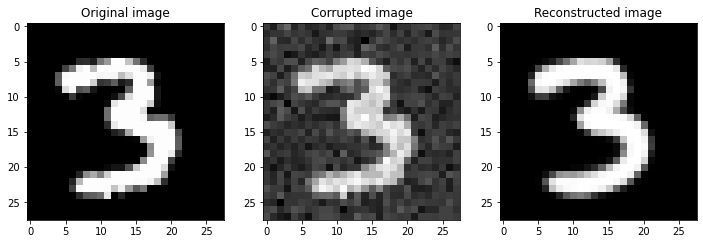

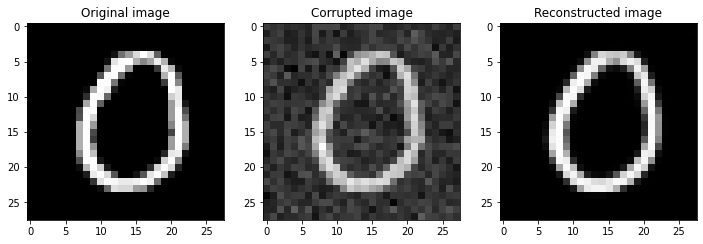

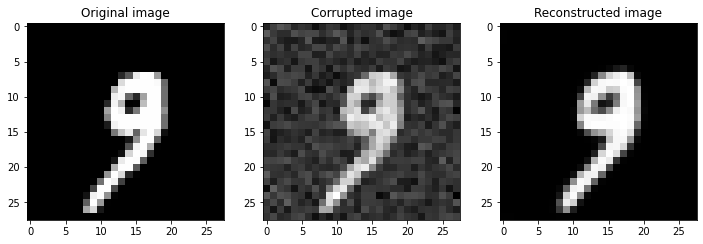

In [ ]:
for i, batch in enumerate(test_dataloader_n1):
  if i < 5:
    # EXAMPLE
    # batch = next(iter(test_dataloader_n))
    fig, ax = plt.subplots(1,3, figsize=(12,4))
    img = batch[0].to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
        
    ax[0].imshow(batch[2][0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[0].set_title('Original image')
    ax[1].imshow(img[0][0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[1].set_title('Corrupted image')
    ax[2].imshow(rec_img[0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[2].set_title('Reconstructed image')
    plt.show()

#### RandomErasing

In [ ]:
class NoisyDataset(Dataset):

  def __init__(self, dataset, transform=None, transform_noise=None):
    """
    Args:
        csv_file (string): Path to the csv file.
        transform (callable, optional): Optional transform to be applied
            on a sample.
    """
    self.transform = transform
    self.transform_noise = transform_noise

    self.data = list(dataset)
    # Now self.data contains all our dataset.
    # Each element of the list self.data is a tuple: (input, output)

  def __len__(self):

    return len(self.data)

  def __getitem__(self, idx):
    
    original_sample = self.data[idx]
    if self.transform_noise:
        sample_noise = self.transform_noise(original_sample[0])
    if self.transform:
        sample = self.transform(original_sample[0])
    
    return sample_noise, original_sample[1], sample

In [ ]:
# DEFINE THE NOISE TRANSFORMATION
noise_transform = transforms.Compose([
        transforms.ToTensor(),
        torchvision.transforms.RandomErasing(p=1, scale=(0.05, 0.15), ratio=(0.7, 1.7), value=0, inplace=False)
        ])

In [ ]:
# CREATE THE DATASETS (TRAIN AND TEST)
train_dataset_original_n = NoisyDataset(train_dataset_original, 
                             transform = transforms.Compose([transforms.ToTensor(),]), 
                             transform_noise = noise_transform)
                                                                                
test_dataset_n = NoisyDataset(test_dataset, 
                             transform = transforms.Compose([transforms.ToTensor(),]), 
                             transform_noise = noise_transform)

In [ ]:
# # SPLIT TRAINING AND VALIDATION SET
# train_dataset_n, val_dataset_n = torch.utils.data.random_split(train_dataset_original_n, 
#                                         [50000, 10000], generator=torch.Generator().manual_seed(1))

In [ ]:
# DATALOADER
train_dataloader_original_n = DataLoader(train_dataset_original_n, batch_size=250, shuffle=False)
# train_dataloader_n = DataLoader(train_dataset_n, batch_size=250, shuffle=False)
# val_dataloader_n = DataLoader(val_dataset_n, batch_size=250, shuffle=False)
test_dataloader_n = DataLoader(test_dataset_n, batch_size=250, shuffle=False)

torch.Size([250, 1, 28, 28])


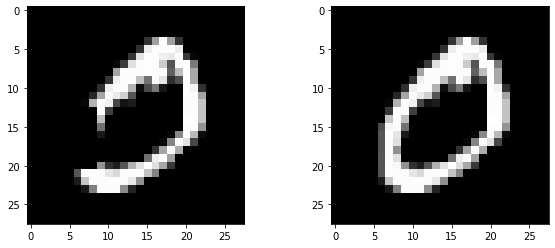

In [ ]:
# EXAMPLE
batch = next(iter(train_dataloader_original_n))
print(batch[0].shape)
fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].imshow(batch[0][1].cpu().squeeze().numpy(), cmap='gist_gray')
ax[1].imshow(batch[2][1].cpu().squeeze().numpy(), cmap='gist_gray')
plt.show()

In [ ]:
# # Define train dataloader
# train_dataloader_original = DataLoader(train_dataset_original, batch_size=250, shuffle=False)
# train_dataloader_original_noise = DataLoader(train_dataset_original_noise, batch_size=250, shuffle=False)

In [ ]:
### Training function
def train_epoch_denoise(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    
    train_loss= []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _, original_batch in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        original_batch = original_batch.to(device)
        # print(image_batch.shape)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, original_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Save loss
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)
        # Print batch loss
        # print('\t partial train loss (single batch): %f' % (loss.data))
    return np.mean(train_loss)

In [ ]:
### Testing function
def test_epoch_denoise(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()    
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _, original_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(original_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

CNN 3 conv: 64(3x3)-16(3x3)-64, 2 fc: 64-32, act = ELU, opt = Adam, lr = 0.003, reg = False



Best val_loss: 0.00874 - train_loss: 0.00863 - execution_time: 986s
Final training loss: 0.008629745803773403 - final validation loss: 0.00874412152916193


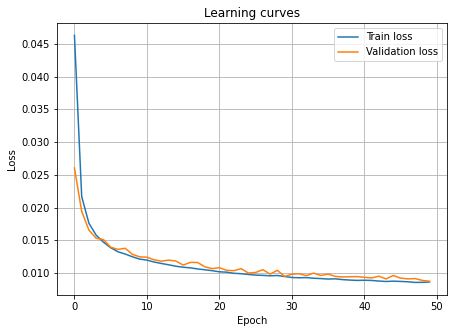

In [ ]:
random.seed(0)
num_epochs = 50
patience = 7
act_dict = {'ELU':nn.ELU()}
encoded_space_dim = 32
(conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, Nh1, 
    Nh2, act, opt, lr, reg, wd) = (3, 2, 64, 16, 64, 0, 3, 3, 64, 32, 'ELU',
                                   'Adam', 0.003, 'False', 0)
print(f'CNN {conv_layers} conv: {Nconv1}({kernel1}x{kernel1}){-Nconv2}({kernel2}x{kernel2}){-Nconv3 if conv_layers >= 3 else ""}' 
    f'{-Nconv4 if conv_layers >= 4 else ""}, {fc_layers} fc: {Nh1}{-Nh2 if fc_layers == 3 else ""}{-encoded_space_dim},'
    f' act = {act}, opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}')


start_time = time.time()
# time.sleep(0.1)

### Set the random seed for reproducible results
torch.manual_seed(0)
activation = act_dict[act]

### Initialize the two networks
encoder = Encoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
decoder = Decoder(encoded_space_dim, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, kernel1, kernel2, 
            stride1=2, stride2=2, Nh1=Nh1, Nh2=Nh2, activation=activation, reg=reg, loss=False)
# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
if reg == 'L2':
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr, weight_decay = wd),
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr, weight_decay = wd)}
    optimizer = opt_dict[opt]
else:
    opt_dict = {'Adam': torch.optim.Adam(params_to_optimize, lr = lr), 
                'RMSprop': torch.optim.RMSprop(params_to_optimize, lr = lr)}
    optimizer = opt_dict[opt]

### Training cycle
no_improve_epoch = 0
train_loss_log, val_loss_log = [], []
best_loss = 1e10

for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):
    ### Training (use the training function)
    train_loss = train_epoch_denoise(encoder=encoder, decoder=decoder, device=device, dataloader=train_dataloader_original_n, loss_fn=loss_fn, optimizer=optimizer)
    train_loss_log.append(train_loss)
    ### Validation  (use the testing function)
    val_loss = test_epoch_denoise(encoder=encoder, decoder=decoder, device=device, dataloader=test_dataloader_n, loss_fn=loss_fn)
    val_loss_log.append(val_loss)

run_time = time.time() - start_time
print(f'Best val_loss: {val_loss:.5f} - train_loss: {train_loss:.5f} - execution_time: {run_time:.0f}s') 

print(f'Final training loss: {train_loss} - final validation loss: {val_loss}')

fig, ax = plt.subplots(1,1, figsize=(7,5))
ax.plot(train_loss_log, label='Train loss')
ax.plot(val_loss_log, label='Validation loss') # semilogy
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.set_title('Learning curves')
ax.grid()
ax.legend()
plt.show()


Test evaluation

In [ ]:
test_loss = test_epoch_denoise(encoder=encoder, decoder=decoder, device=device, dataloader=test_dataloader_n, loss_fn=loss_fn)
test_loss

tensor(0.0087)

Plot some sample reconstruction

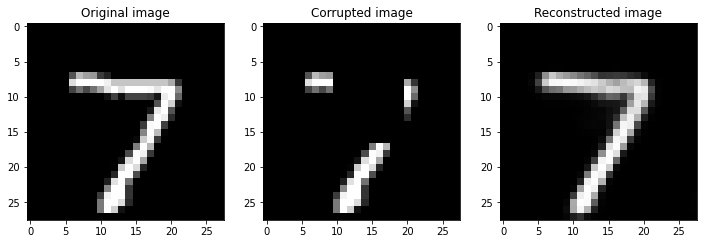

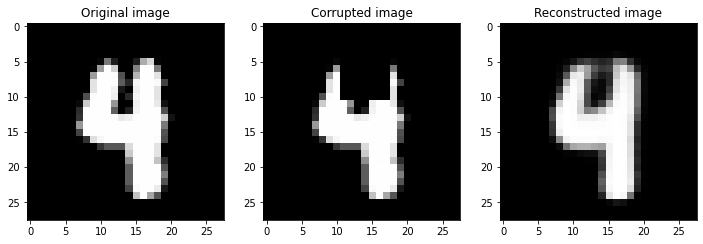

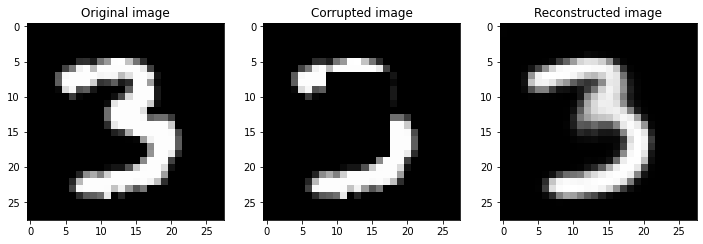

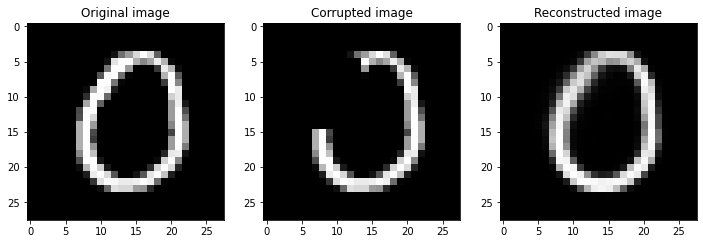

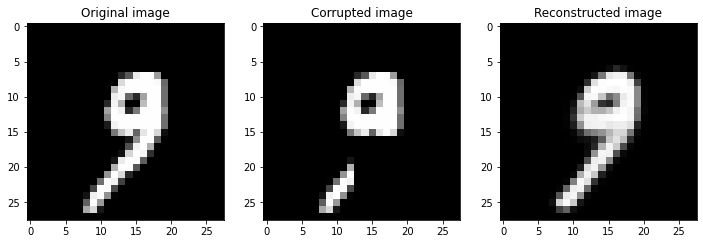

In [ ]:
for i, batch in enumerate(test_dataloader_n):
  if i < 5:
    # EXAMPLE
    # batch = next(iter(test_dataloader_n))
    fig, ax = plt.subplots(1,3, figsize=(12,4))
    img = batch[0].to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
        
    ax[0].imshow(batch[2][0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[0].set_title('Original image')
    ax[1].imshow(batch[0][0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[1].set_title('Corrupted image')
    ax[2].imshow(rec_img[0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[2].set_title('Reconstructed image')
    plt.show()

# VAE

## Code size = 16

In [ ]:
class LinearVAE(nn.Module):
    def __init__(self):
        super().__init__()

        # activation
        self.act = nn.ELU()
        
        # encoder
        cnn_enc = [nn.Conv2d(1, 64, kernel_size=3, stride=2, padding=1),
                      self.act,
                      nn.Conv2d(64, 16, kernel_size=3, stride=2, padding=1),
                      self.act,
                      nn.Conv2d(16, 64, kernel_size=3, stride=1, padding=0), 
                      self.act
                      ]
        self.encoder_cnn = nn.Sequential(*cnn_enc)

        self.flatten = nn.Flatten(start_dim=1)

        linear_enc = [nn.Linear(64 * 5 * 5, 64), 
                         self.act,
                         nn.Linear(64, 32)
                         ]
        self.encoder_lin = nn.Sequential(*linear_enc)
        
                 
        # decoder 
        linear_dec = [nn.Linear(16, 64), 
                         self.act,
                         nn.Linear(64, 64 * 5 * 5)
                         ]
        self.decoder_lin = nn.Sequential(*linear_dec)

        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(64, 5, 5))

        cnn_dec = [nn.ConvTranspose2d(64, 16, kernel_size=3, stride=1, padding=0, output_padding=0),
                   self.act,
                   nn.ConvTranspose2d(16, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
                   self.act,
                   nn.ConvTranspose2d(64, 1, kernel_size=3, stride=2, padding=1, output_padding=1)
        ]

        self.decoder_cnn = nn.Sequential(*cnn_dec)
        
    def reparameterize(self, mu, log_var):
        
        std = torch.exp(0.5 * log_var) 
        eps = torch.randn_like(std) 
        sample = mu + (eps * std) 
        return sample
 
    def forward(self, x, explore=False, generate_from=False, new=None):
        # Encoding
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        x = x.view(-1, 2, 16)
        
        # First part of the code used as mean, second as variance
        mu = x[:, 0, :] 
        log_var = x[:, 1, :] 

        # Reparameterization
        z = self.reparameterize(mu, log_var)

        if generate_from:
            z = new
 
        # Decoding
        x = self.decoder_lin(z)
        x = self.unflatten(x)
        x = self.decoder_cnn(x)

        reconstruction = torch.sigmoid(x)

        if explore:
            return reconstruction, mu, log_var, z

        return reconstruction, mu, log_var

In [ ]:
def kl_divergence(mu, logvar):
    kl = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)
    return kl

In [ ]:
def plot_results_vae(train_loss_log, val_loss_log, model, device):
    fig, ax = plt.subplots(1,3, figsize=(15,3))
    # Plot the learning curves (loss)
    ax[0].plot(train_loss_log, label='Train loss')
    ax[0].plot(val_loss_log, label='Training loss') # semilogy
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    ax[0].set_title('Learning curves')
    ax[0].grid()
    ax[0].legend()

    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    model.eval()
    
    with torch.no_grad():
            img = img.to(device)
            # img = img.view(img.size(0), -1)

            rec, mu, log_var = model(img)
    
    img = img.view(1,1,28,28)
    rec = rec.view(1,1,28,28)
    ax[1].imshow(img[0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[1].set_title('Original image')
    ax[2].imshow(rec[0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[2].set_title('Reconstructed image')

    plt.show()


Final train_loss: 16570.55273 - Final test_loss: 16475.74609 - execution_time: 383s


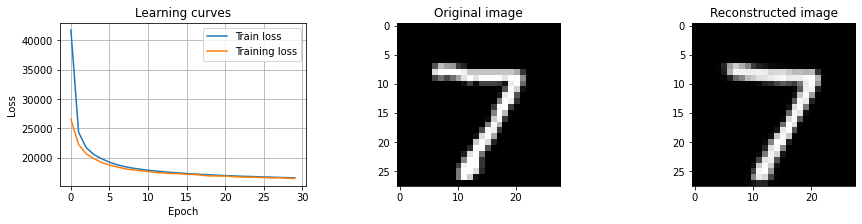

In [ ]:
random.seed(0)
num_epochs = 30
# encoded_space_dim = 32
lr = 0.001

start_time = time.time()

### Set the random seed for reproducible results
torch.manual_seed(0)
reconstruction_loss = nn.BCELoss(reduction='sum')

### Initialize the two networks
model = LinearVAE().to(device)

# params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

train_loss_log = []
val_loss_log = []
for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):

    # Set train mode for both the encoder and the decoder
    model.train()
    train_loss = []
    for image_batch, _ in train_dataloader_original: 
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        # image_batch = image_batch.view(image_batch.size(0), -1)

        rec, mu, log_var = model(image_batch)

        # Reconstruction loss
        rec_loss = reconstruction_loss(rec, image_batch)
        # KL divergence
        kl = kl_divergence(mu, log_var)
        # Complete loss
        loss = rec_loss + kl

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Save loss
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)

    train_loss_log.append(np.mean(train_loss))

    # Validation step
    model.eval()
    val_loss = []
    for image_batch, _ in test_dataloader: 
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        
        rec, mu, log_var = model(image_batch)

        # Reconstruction loss
        rec_loss = reconstruction_loss(rec, image_batch)
        
        # KL divergence
        kl = kl_divergence(mu, log_var)
        # Complete loss
        loss = rec_loss + kl
        # Save loss
        loss_batch = loss.detach().cpu().numpy()
        val_loss.append(loss_batch)

    val_loss_log.append(np.mean(val_loss))

run_time = time.time() - start_time
print(f'Final train_loss: {np.mean(train_loss):.5f} - Final test_loss: {np.mean(val_loss):.5f} - execution_time: {run_time:.0f}s') 

# Plot the learning curves (loss)
plot_results_vae(train_loss_log, val_loss_log, model, device)

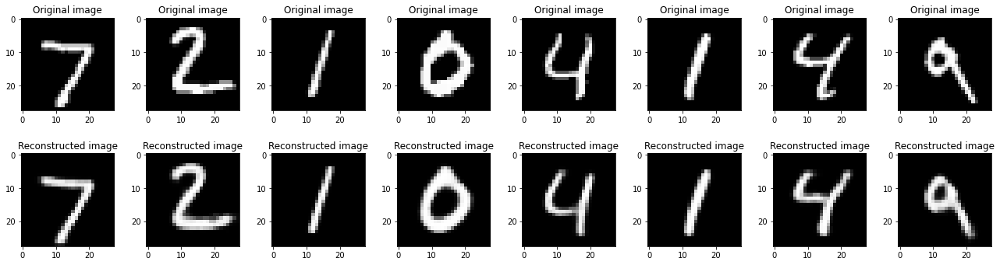

In [ ]:
fig, ax = plt.subplots(2,8, figsize=(18,5))
batch = next(iter(test_dataloader))
img = batch[0].to(device)
for i in range(8):
    model.eval()
    
    with torch.no_grad():
        img = img.to(device)
        rec, mu, log_var = model(img)
           
    ax[0,i].imshow(img[i].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[0,i].set_title('Original image')
    ax[1,i].imshow(rec[i].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[1,i].set_title('Reconstructed image')

plt.tight_layout()

#### Exploration of the latent space and generation

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tq.tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    
    model.eval()
    with torch.no_grad():
        rec, mu, log_var, encoded_img = model(img, explore=True, generate_from=False)
        # encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,Enc. Variable 10,Enc. Variable 11,Enc. Variable 12,Enc. Variable 13,Enc. Variable 14,Enc. Variable 15,label
0,-0.483839,1.956493,2.625577,1.648636,0.350998,2.104681,-1.880048,1.353325,-1.860163,-0.003503,1.831196,2.296430,-2.273793,-1.538705,-1.240823,-1.653751,7
1,-0.094728,1.558850,-2.985558,-1.178436,2.331461,-1.165128,-1.332378,-2.754099,-1.581607,-3.964018,-0.297936,-3.452103,2.656031,-1.233560,-1.825956,0.253049,2
2,1.058646,3.735748,2.259953,-1.663517,0.044509,-0.533767,-1.879041,0.136658,1.813280,1.365212,2.640399,-0.636771,3.545910,0.446621,-3.000058,-0.986995,1
3,-1.173172,-0.930037,0.025063,1.578870,2.304244,-0.709204,-2.771030,1.888268,0.309986,0.209780,-0.187903,-1.065663,-0.061776,0.608288,1.506997,-1.664047,0
4,1.763718,0.552246,0.115105,3.903074,-0.281255,-3.322088,0.281271,2.450204,-1.906574,0.861922,2.789522,-3.267201,-2.480244,1.150218,0.292647,0.172324,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.012303,2.481633,-0.626832,1.269079,3.842077,-1.755451,-4.056680,-0.068848,-1.523339,-3.628892,-2.251501,1.336496,0.502980,-0.152105,-1.371706,0.771847,2
9996,-1.129489,0.414045,-1.184591,0.056710,4.094388,1.741903,-3.077551,-1.041040,-0.639920,-1.178247,-1.561438,-1.210029,0.259838,-1.537707,-0.626149,-2.071451,3
9997,-1.426883,-0.778376,2.224273,2.293105,-0.908278,-0.961823,-0.300674,2.542493,-0.724744,0.234122,1.166860,-0.719706,0.588678,0.574322,-2.548105,1.040917,4
9998,-2.483311,-1.790847,-1.852148,-0.672267,-3.566636,1.191337,-4.820953,-1.686852,1.007972,-0.026702,2.125545,-0.064316,-1.938410,0.239151,-2.123154,-0.946346,5


In [ ]:
encoded_samples_array = np.array(encoded_samples)[:,:16]
encoded_samples_array.shape

(10000, 16)

PCA

In [ ]:
pca = PCA(n_components=2)
code_2d_pca = pca.fit_transform(encoded_samples_array)
code_2d_pca.shape

(10000, 2)

In [ ]:
px.scatter(code_2d_pca, x=0, y=1, color=encoded_samples.label.astype(str), opacity=0.7)

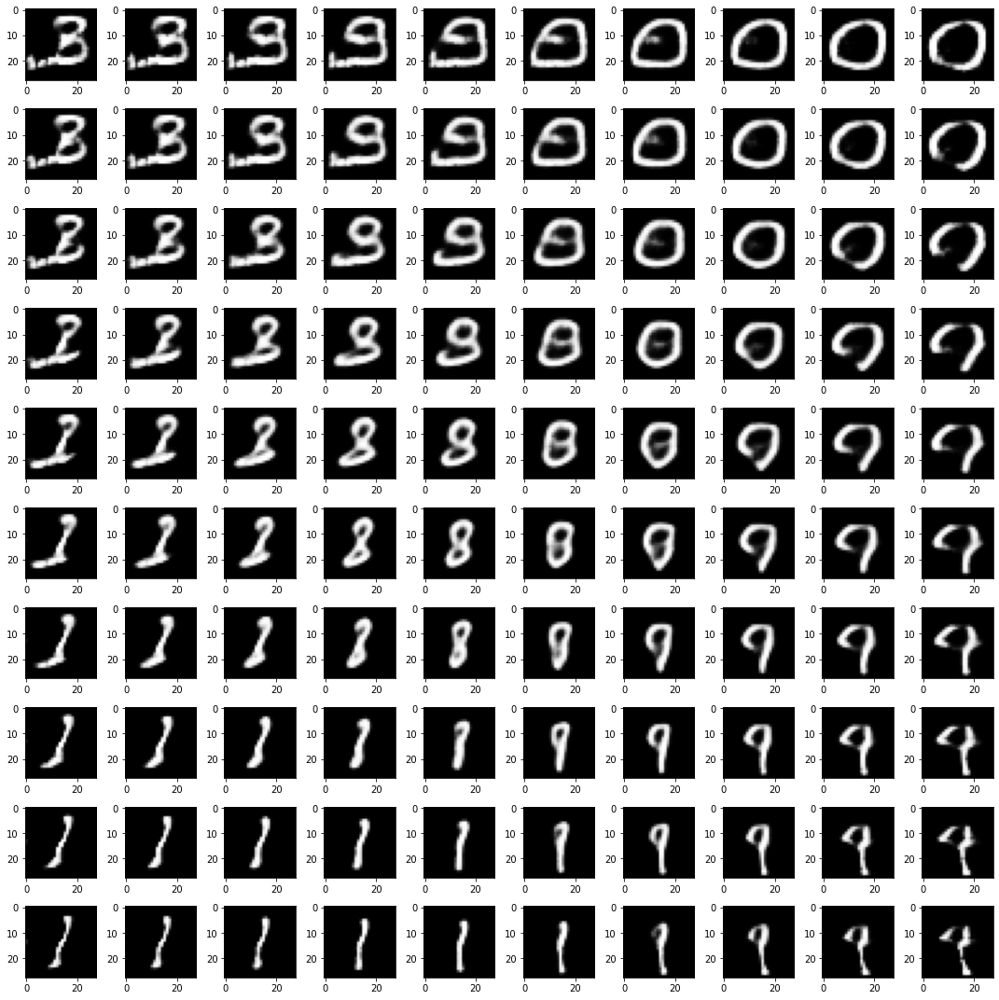

In [ ]:
fig, ax = plt.subplots(10,10, figsize=(15,15))
for m,x in enumerate(range(-10, 10, 2)):
    for n,y in enumerate(range(-10, 10, 2)):        
        reduced = [x,y]
        custom_encoded_sample = pca.inverse_transform(reduced)
        encoded_value = torch.tensor(custom_encoded_sample).float().unsqueeze(0).to(device)

        # Decode sample
        model.eval()
        with torch.no_grad():
            rec, mu, log_var = model(img, explore=False, generate_from=True, new = encoded_value)
            # generated_img  = decoder(encoded_value)
        ax[m,n].imshow(rec.squeeze().cpu().numpy(), cmap='gist_gray')
plt.tight_layout()
plt.savefig('generation.png')

## Code size = 2


In [ ]:
class LinearVAE(nn.Module):
    def __init__(self):
        super().__init__()

        # activation
        self.act = nn.ELU()
        
        # encoder
        cnn_enc = [nn.Conv2d(1, 64, kernel_size=3, stride=2, padding=1),
                      self.act,
                      nn.Conv2d(64, 16, kernel_size=3, stride=2, padding=1),
                      self.act,
                      nn.Conv2d(16, 64, kernel_size=3, stride=1, padding=0), 
                      self.act
                      ]
        self.encoder_cnn = nn.Sequential(*cnn_enc)

        self.flatten = nn.Flatten(start_dim=1)

        linear_enc = [nn.Linear(64 * 5 * 5, 64), 
                         self.act,
                         nn.Linear(64, 4)
                         ]
        self.encoder_lin = nn.Sequential(*linear_enc)
        
                 
        # decoder 
        linear_dec = [nn.Linear(2, 64), 
                         self.act,
                         nn.Linear(64, 64 * 5 * 5)
                         ]
        self.decoder_lin = nn.Sequential(*linear_dec)

        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(64, 5, 5))

        cnn_dec = [nn.ConvTranspose2d(64, 16, kernel_size=3, stride=1, padding=0, output_padding=0),
                   self.act,
                   nn.ConvTranspose2d(16, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
                   self.act,
                   nn.ConvTranspose2d(64, 1, kernel_size=3, stride=2, padding=1, output_padding=1)
        ]

        self.decoder_cnn = nn.Sequential(*cnn_dec)
        
    def reparameterize(self, mu, log_var):
        
        std = torch.exp(0.5 * log_var) 
        eps = torch.randn_like(std) 
        sample = mu + (eps * std) 
        return sample
 
    def forward(self, x, explore=False, generate_from=False, new=None):
        # Encoding
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        x = x.view(-1, 2, 2)
        
        # First part of the code used as mean, second as variance
        mu = x[:, 0, :] 
        log_var = x[:, 1, :] 

        # Reparameterization
        z = self.reparameterize(mu, log_var)

        if generate_from:
            z = new
 
        # Decoding
        x = self.decoder_lin(z)
        x = self.unflatten(x)
        x = self.decoder_cnn(x)

        reconstruction = torch.sigmoid(x)

        if explore:
            return reconstruction, mu, log_var, z

        return reconstruction, mu, log_var

In [ ]:
def kl_divergence(mu, logvar):
    kl = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)
    return kl

In [ ]:
def plot_results_vae(train_loss_log, val_loss_log, model, device):
    fig, ax = plt.subplots(1,3, figsize=(15,3))
    # Plot the learning curves (loss)
    ax[0].plot(train_loss_log, label='Train loss')
    ax[0].plot(val_loss_log, label='Test loss') # semilogy
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    ax[0].set_title('Learning curves')
    ax[0].grid()
    ax[0].legend()

    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    model.eval()
    
    with torch.no_grad():
            img = img.to(device)
            # img = img.view(img.size(0), -1)

            rec, mu, log_var = model(img)
    
    img = img.view(1,1,28,28)
    rec = rec.view(1,1,28,28)
    ax[1].imshow(img[0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[1].set_title('Original image')
    ax[2].imshow(rec[0].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[2].set_title('Reconstructed image')

    plt.show()


Final train_loss: 33980.42578 - Final test_loss: 34572.97656 - execution_time: 374s


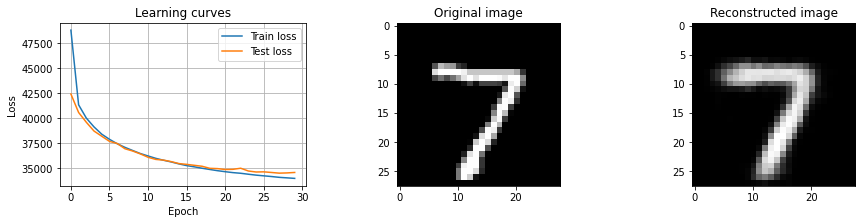

In [ ]:
random.seed(0)
num_epochs = 30
# encoded_space_dim = 32
lr = 0.001

start_time = time.time()

### Set the random seed for reproducible results
torch.manual_seed(0)
reconstruction_loss = nn.BCELoss(reduction='sum')

### Initialize the two networks
model = LinearVAE().to(device)

# params_to_optimize = [{'params': encoder.parameters()}, {'params': decoder.parameters()}]
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

train_loss_log = []
val_loss_log = []
for epoch in tq.tqdm(range(num_epochs), desc = f'Training'):

    # Set train mode for both the encoder and the decoder
    model.train()
    train_loss = []
    for image_batch, _ in train_dataloader_original: 
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        # image_batch = image_batch.view(image_batch.size(0), -1)

        rec, mu, log_var = model(image_batch)

        # Reconstruction loss
        rec_loss = reconstruction_loss(rec, image_batch)
        # KL divergence
        kl = kl_divergence(mu, log_var)
        # Complete loss
        loss = rec_loss + kl

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Save loss
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)

    train_loss_log.append(np.mean(train_loss))

    # Validation step
    model.eval()
    val_loss = []
    for image_batch, _ in test_dataloader: 
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        
        rec, mu, log_var = model(image_batch)

        # Reconstruction loss
        rec_loss = reconstruction_loss(rec, image_batch)
        
        # KL divergence
        kl = kl_divergence(mu, log_var)
        # Complete loss
        loss = rec_loss + kl
        # Save loss
        loss_batch = loss.detach().cpu().numpy()
        val_loss.append(loss_batch)

    val_loss_log.append(np.mean(val_loss))

run_time = time.time() - start_time
print(f'Final train_loss: {np.mean(train_loss):.5f} - Final test_loss: {np.mean(val_loss):.5f} - execution_time: {run_time:.0f}s') 

# Plot the learning curves (loss)
plot_results_vae(train_loss_log, val_loss_log, model, device)

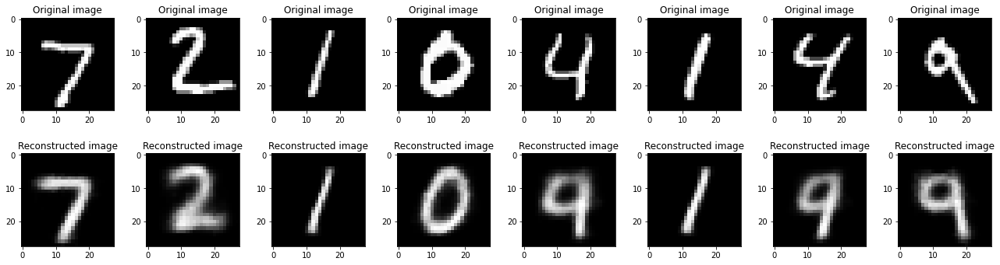

In [ ]:
fig, ax = plt.subplots(2,8, figsize=(18,5))
batch = next(iter(test_dataloader))
img = batch[0].to(device)
for i in range(8):
    model.eval()
    
    with torch.no_grad():
        img = img.to(device)
        rec, mu, log_var = model(img)
           
    ax[0,i].imshow(img[i].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[0,i].set_title('Original image')
    ax[1,i].imshow(rec[i].cpu().squeeze().numpy(), cmap='gist_gray')
    ax[1,i].set_title('Reconstructed image')

plt.tight_layout()

#### Exploration of the latent space and generation

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tq.tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    
    model.eval()
    with torch.no_grad():
        rec, mu, log_var, encoded_img = model(img, explore=True, generate_from=False)
        # encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,label
0,0.633538,-1.809261,7
1,4.794018,4.561519,2
2,-15.376088,2.424818,1
3,1.447494,11.978245,0
4,8.379763,0.517989,4
...,...,...,...
9995,4.660405,5.257440,2
9996,1.014514,3.364830,3
9997,2.107215,-0.313655,4
9998,-11.142421,8.546121,5


In [ ]:
encoded_samples_array = np.array(encoded_samples)[:,:2]
encoded_samples_array.shape

(10000, 2)

In [ ]:
px.scatter(encoded_samples_array, x=0, y=1, color=encoded_samples.label.astype(str), opacity=0.7)

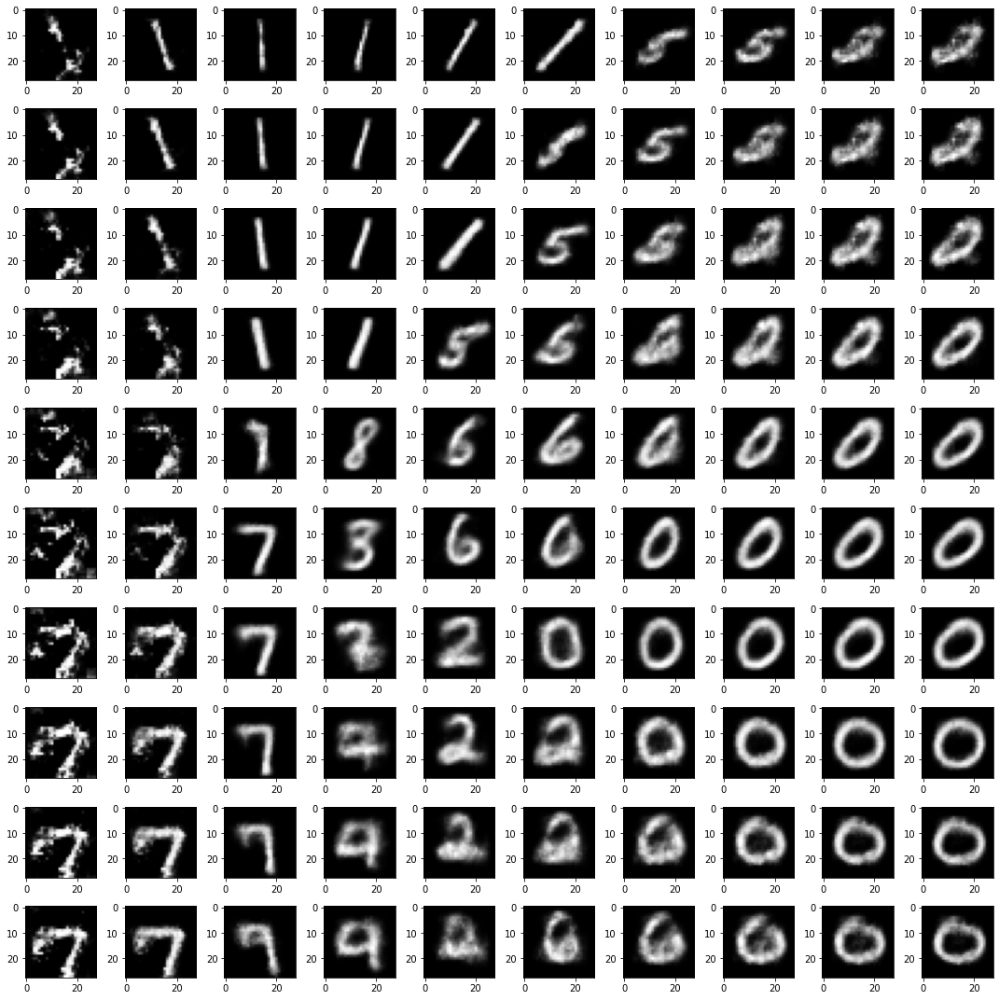

In [ ]:
fig, ax = plt.subplots(10,10, figsize=(15,15))
for m,x in enumerate(range(-20, 20, 4)):
    for n,y in enumerate(range(-10, 30, 4)):        
        custom_encoded_sample = [x,y]
        # custom_encoded_sample = pca.inverse_transform(reduced)
        encoded_value = torch.tensor(custom_encoded_sample).float().unsqueeze(0).to(device)

        # Decode sample
        model.eval()
        with torch.no_grad():
            rec, mu, log_var = model(img, explore=False, generate_from=True, new = encoded_value)
            # generated_img  = decoder(encoded_value)
        ax[m,n].imshow(rec.squeeze().cpu().numpy(), cmap='gist_gray')
plt.tight_layout()
plt.savefig('generation.png')

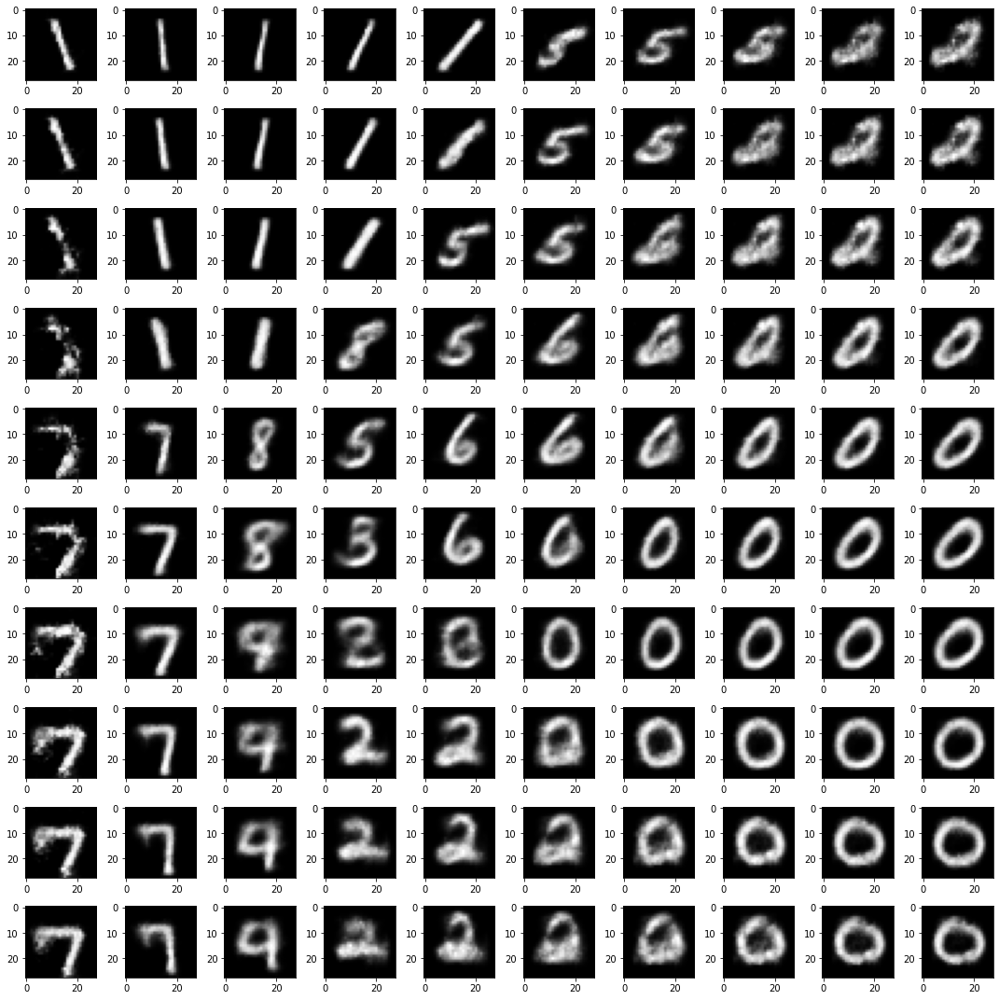

In [ ]:
fig, ax = plt.subplots(10,10, figsize=(15,15))
for m,x in enumerate(range(-15, 15, 3)):
    for n,y in enumerate(range(-5, 25, 3)):        
        custom_encoded_sample = [x,y]
        # custom_encoded_sample = pca.inverse_transform(reduced)
        encoded_value = torch.tensor(custom_encoded_sample).float().unsqueeze(0).to(device)

        # Decode sample
        model.eval()
        with torch.no_grad():
            rec, mu, log_var = model(img, explore=False, generate_from=True, new = encoded_value)
            # generated_img  = decoder(encoded_value)
        ax[m,n].imshow(rec.squeeze().cpu().numpy(), cmap='gist_gray')
plt.tight_layout()
plt.savefig('generation.png')